In [1]:
import numpy as np
from nonlinear_model import discrete_nonlinear
from Koopman_numpy import Koopman_numpy
from MPC import *
import time

# Test Koopman operater in numpy

In [5]:
file_name = 'unordered_encoder_[3, 32, 64, 10]_decoder_[10, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
operater = Koopman_numpy(file_name)
x = np.array([1.,1.,0.3])
nonlinear_x = x
u = np.array([0.5,0.3])
lifted_x = operater.encode(x)
for i in range(5):
    next_lifted_x = operater.linear(lifted_x,u)
    nonlinear_x = discrete_nonlinear(nonlinear_x,u,0.1)
next_x = operater.decode(next_lifted_x)
print(next_x,nonlinear_x)
operater.property()

[ 0.01599448  3.57607424 -2.26687173] [[1.23376368 1.08798932 0.45      ]]
The system is uncontrollable, the rank of the controllability matrix is 8.


In [8]:
file_name = 'unordered_encoder_[3, 32, 64, 10]_decoder_[10, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
operater = Koopman_numpy(file_name)
A,B = operater.linear_matrix()
print(A,B)

[[ 1.1970794  0.        -0.         0.        -0.        -0.
  -0.        -0.         0.         0.       ]
 [-0.         1.3212098  0.        -0.         0.         0.
   0.         0.         0.         0.       ]
 [-0.         0.         1.2823637 -0.        -0.         0.
   0.         0.         0.         0.       ]
 [ 0.         0.         0.         2.0000052 -0.        -0.
  -0.        -0.         0.         0.       ]
 [-0.         0.         0.         0.         2.0009594 -0.
  -0.         0.        -0.         0.       ]
 [-0.         0.        -0.        -0.        -0.         1.9997422
   0.         0.         0.        -0.       ]
 [ 0.        -0.        -0.         0.        -0.        -0.
   2.0031626 -0.        -0.        -0.       ]
 [ 0.        -0.         0.         0.         0.         0.
   0.         2.000604  -0.        -0.       ]
 [ 0.        -0.        -0.        -0.        -0.         0.
  -0.        -0.         2.0002277  0.       ]
 [ 0.         0.     

In [6]:
Ae = np.linalg.eigvals(A)
print(Ae)

[-0.6671216 +0.j          0.05704826+0.j         -0.1561022 +0.12911077j
 -0.1561022 -0.12911077j -0.49422142+0.j         -0.43215787+0.j
 -0.37377557+0.j          0.99992865+0.j          1.0001483 +0.00024431j
  1.0001483 -0.00024431j  1.0004467 +0.j        ]


# Test MPC function

In [1]:
# get augmented matrices
A,B = operater.linear_matrix()
Q = np.diag(np.array([1.,2.,3.,4.,5.,6.,7.,8.,9.,10.,11.]))
R = np.diag(np.array([1.,2.]))
rho = 1.
Gamma,Theta,Qbig,H = get_Augmented_Matrix(A,B,Q,R,rho,3,2)
print(Gamma.shape)
print(Theta.shape)
print(Qbig.shape)
print(H.shape)

NameError: name 'operater' is not defined

In [1]:
#%matplotlib notebook
import numpy as np
from nonlinear_model import discrete_nonlinear
from Koopman_numpy import Koopman_numpy
from MPC import *
import time

In [2]:
SimLength = 160
init_x = np.array([-1.,0.,0.])
path=simulate_path(init_x,SimLength)

./dataset/MPC/SimLenth_160_Ts_0.1


[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.78539816  0.78539816  0.78539816  0.78539816
  0.78539816  0.78539816  0.78539816  0.78539816  0.78539816  0.78539816
  0.78539816  0.78539816  0.78539816  0.78539816  0.78539816  0.78539816
  0.78539816  0.78539816  0.78539816  0.78539816  1.57079633  1.57079633
  1.57079633  1.57079633  1.57079633  1.57079633  1.57079633  1.57079633
  1.57079633  1.57079633  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265
  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265
  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265
  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265  3.14159265
  3.14159265  3.14

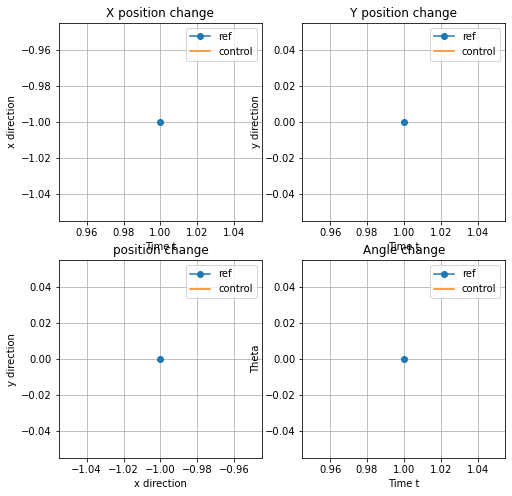

Point 2 ,Step 1 - MSE error in lifted space,state x, input u:


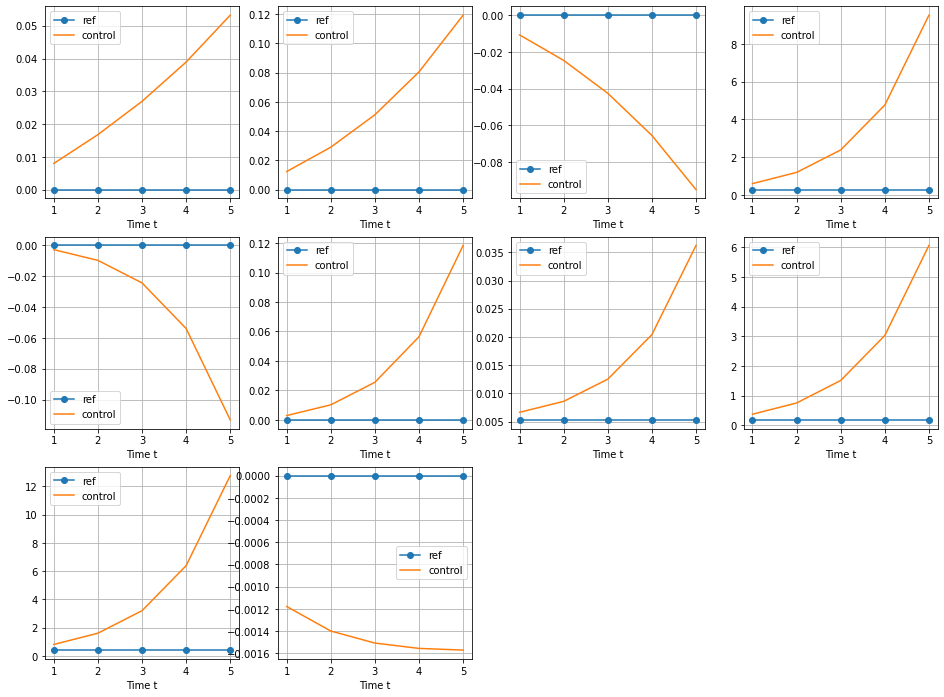

0.1746512553848144 [-0.97465126  0.          0.05      ] [0.25348745 0.5       ]
Point 2 ,Step 2 - MSE error in lifted space,state x, input u:


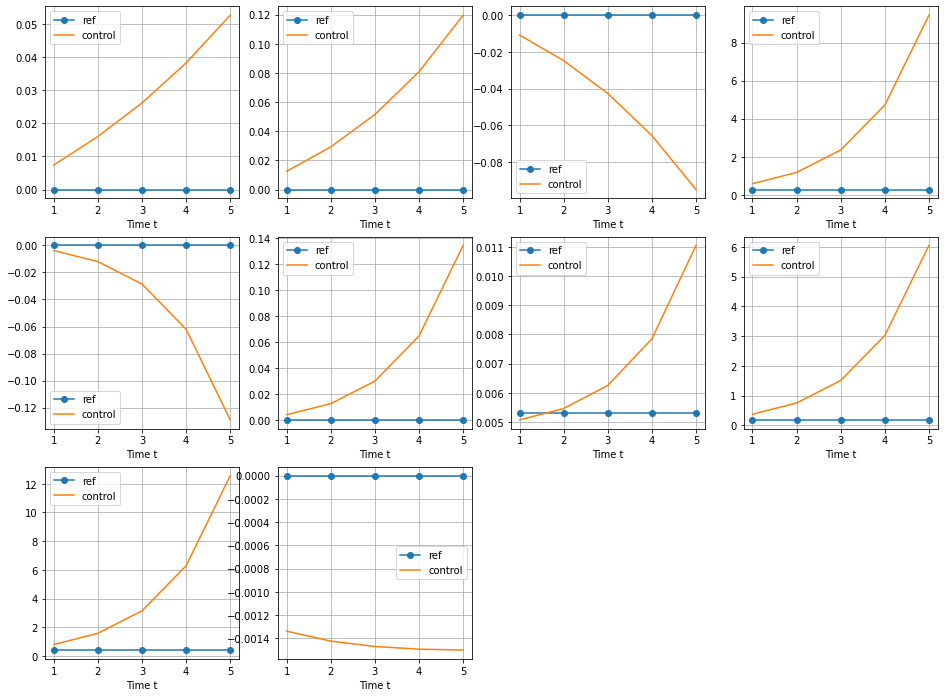

0.14017293467969857 [-0.94016231  0.00172589  0.1       ] [0.34532102 0.5       ]
Point 2 ,Step 3 - MSE error in lifted space,state x, input u:


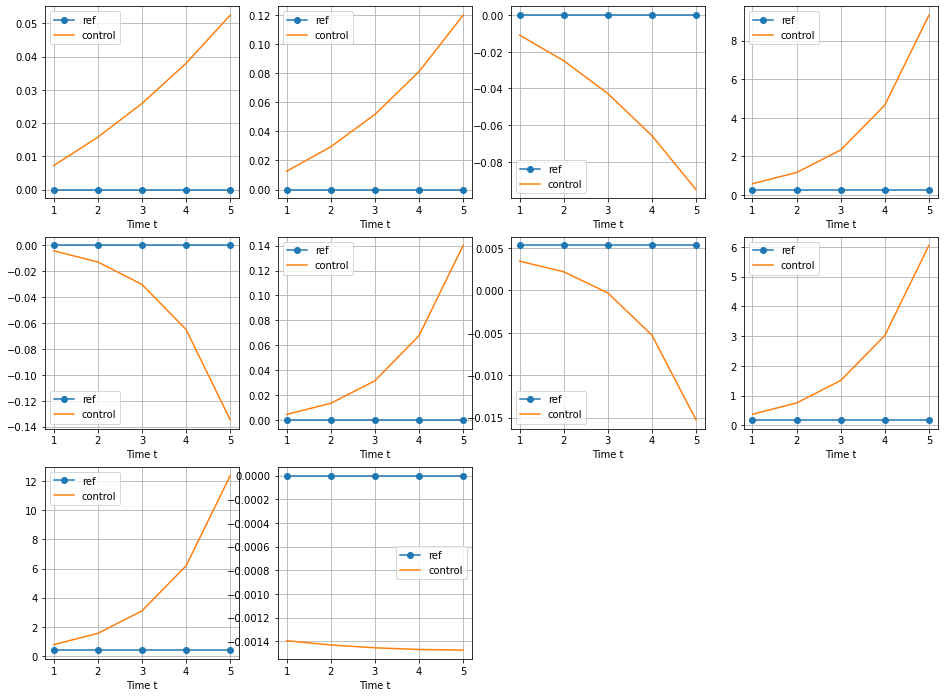

0.10266358081966628 [-0.90251598  0.00550312  0.15      ] [0.37835347 0.5       ]
Point 2 ,Step 4 - MSE error in lifted space,state x, input u:


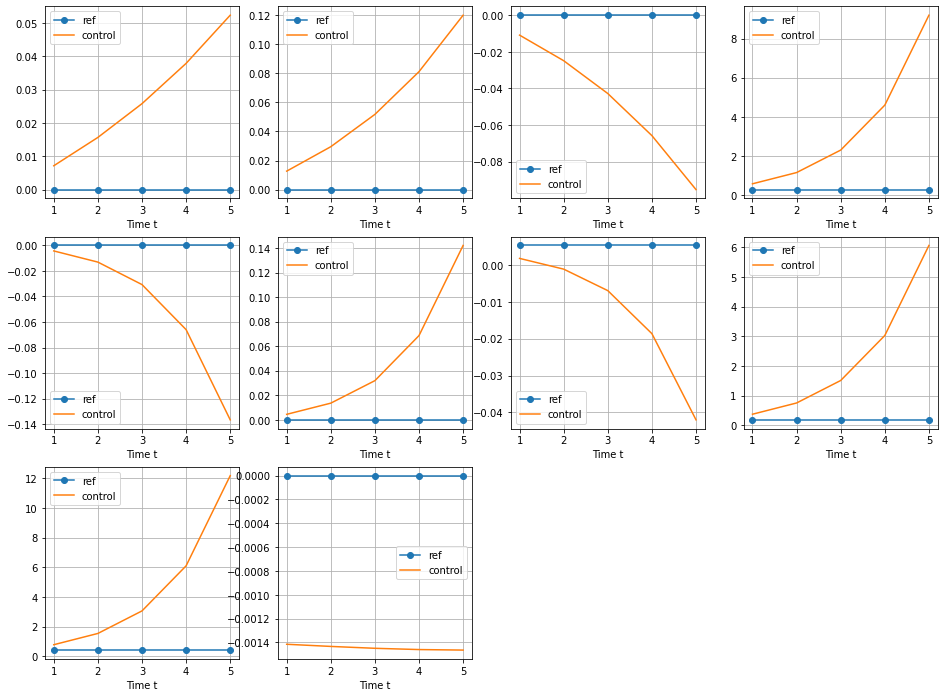

0.06493964915023871 [-0.86394314  0.01133283  0.2       ] [0.39010894 0.5       ]
Point 2 ,Step 5 - MSE error in lifted space,state x, input u:
0.03174136296644432 [-0.8253019  0.0191658  0.25     ] [0.39427154 0.5       ]
Point 2 ,Step 6 - MSE error in lifted space,state x, input u:
0.03176365216586644 [-0.78694942  0.0289588   0.3       ] [0.39583026 0.5       ]
Point 2 ,Step 7 - MSE error in lifted space,state x, input u:
0.06518934565432824 [-0.74906034  0.04067926  0.35      ] [0.39660448 0.5       ]
Point 2 ,Step 8 - MSE error in lifted space,state x, input u:
0.10360853696161638 [-0.71175773  0.05429578  0.4       ] [0.39710128 0.5       ]
Point 2 ,Step 9 - MSE error in lifted space,state x, input u:
0.14295616779556086 [-0.67521275  0.06974675  0.45      ] [0.39677048 0.5       ]
Point 2 ,Step 10 - MSE error in lifted space,state x, input u:
0.18253153153456358 [-0.6395275   0.08698469  0.5       ] [0.39630594 0.5       ]
Point 2 ,Step 11 - MSE error in lifted space,state x, in

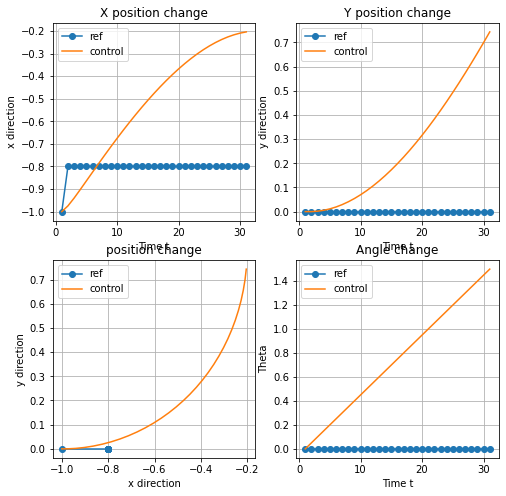

Point 3 ,Step 1 - MSE error in lifted space,state x, input u:


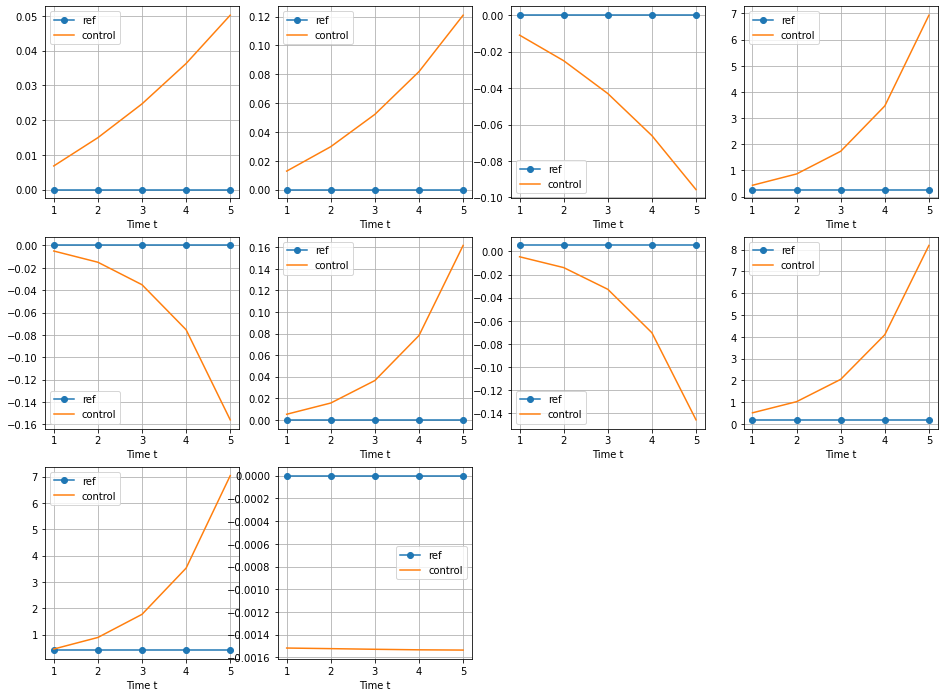

0.9326787946246345 [-0.20104282  0.78799205  1.55      ] [0.44939705 0.5       ]
Point 3 ,Step 2 - MSE error in lifted space,state x, input u:


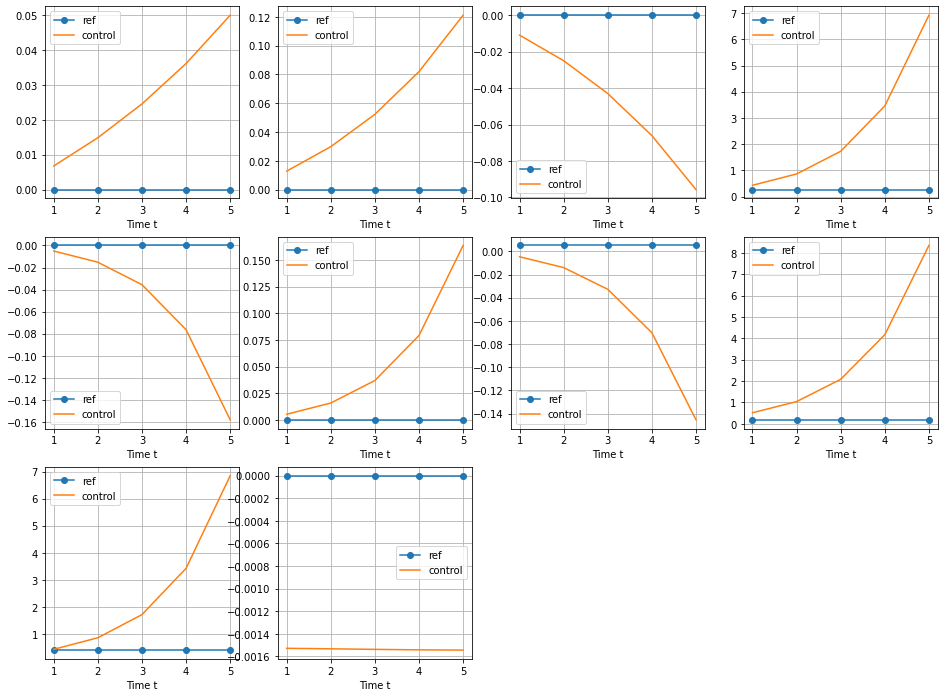

0.9719453600439945 [-0.20009565  0.8335307   1.6       ] [0.45548498 0.5       ]
Point 3 ,Step 3 - MSE error in lifted space,state x, input u:


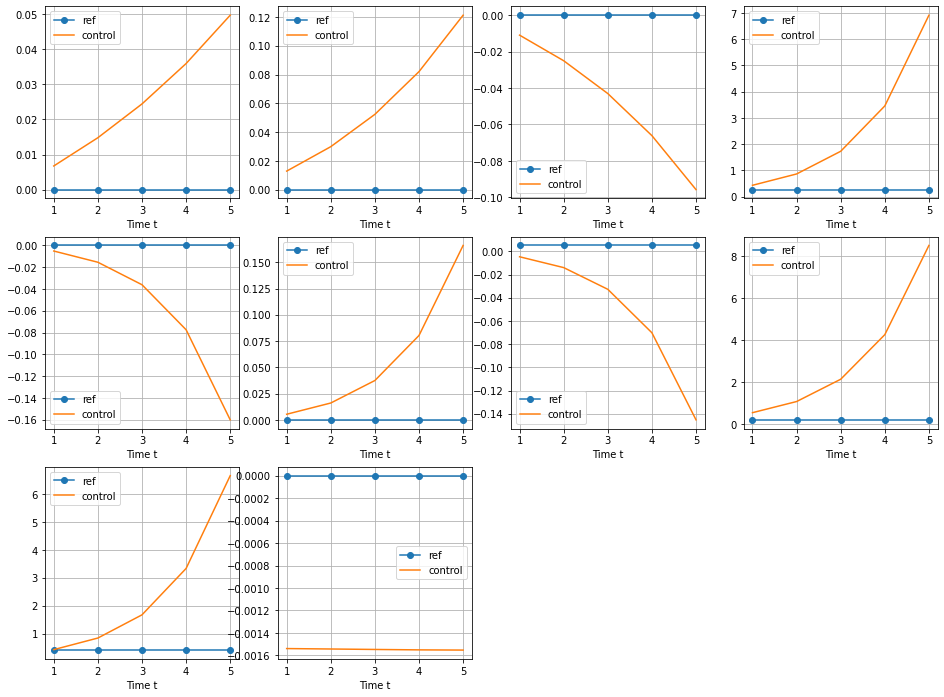

1.0111451572229322 [-0.20144409  0.87969116  1.65      ] [0.46180151 0.5       ]
Point 3 ,Step 4 - MSE error in lifted space,state x, input u:


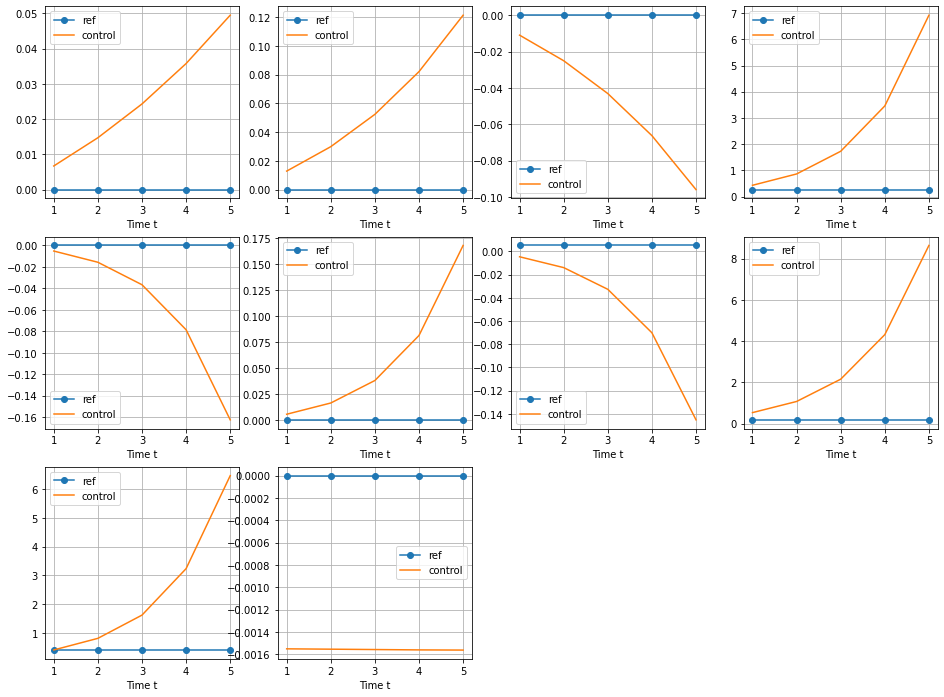

1.05027059978375 [-0.20515029  0.92638658  1.7       ] [0.46842273 0.5       ]
Point 3 ,Step 5 - MSE error in lifted space,state x, input u:
1.089302998737352 [-0.21127328  0.97351282  1.75      ] [0.47522351 0.5       ]
Point 3 ,Step 6 - MSE error in lifted space,state x, input u:
1.1282269324314924 [-0.21986918  1.02096543  1.8       ] [0.48224879 0.5       ]
Point 3 ,Step 7 - MSE error in lifted space,state x, input u:
1.167027336346398 [-0.23099093  1.06863619  1.85      ] [0.48950942 0.5       ]
Point 3 ,Step 8 - MSE error in lifted space,state x, input u:
1.2056884636148368 [-0.24468786  1.1164119   1.9       ] [0.4970035 0.5      ]
Point 3 ,Step 9 - MSE error in lifted space,state x, input u:
1.244193507735995 [-0.26100506  1.16417393  1.95      ] [0.50472388 0.5       ]
Point 3 ,Step 10 - MSE error in lifted space,state x, input u:
1.2825244621385843 [-0.27998279  1.21179806  2.        ] [0.51266091 0.5       ]
Point 3 ,Step 11 - MSE error in lifted space,state x, input u:
1.32

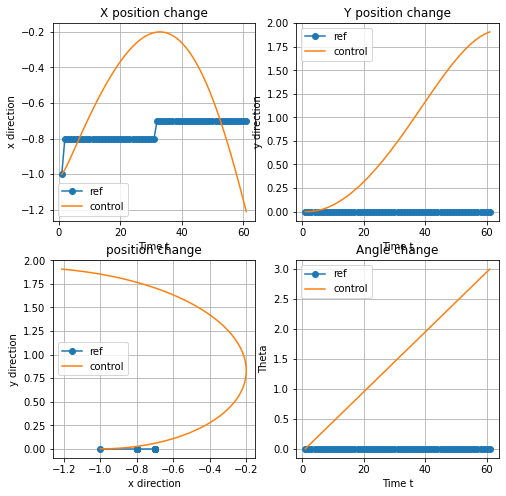

Point 4 ,Step 1 - MSE error in lifted space,state x, input u:


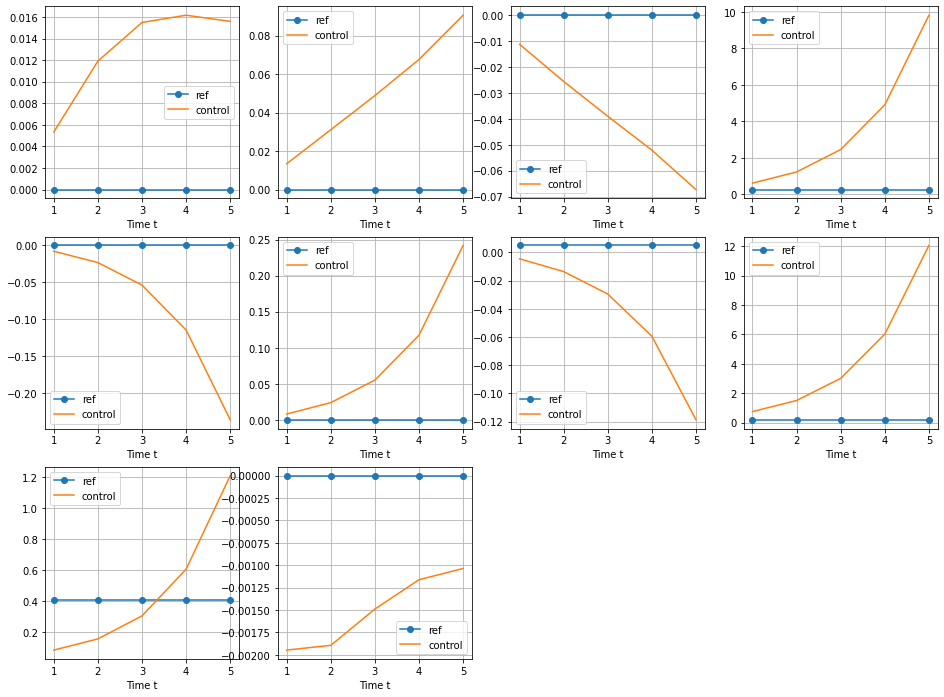

2.034041617956841 [-1.28021045  1.91693481  3.05      ] [0.69686536 0.5       ]
Point 4 ,Step 2 - MSE error in lifted space,state x, input u:


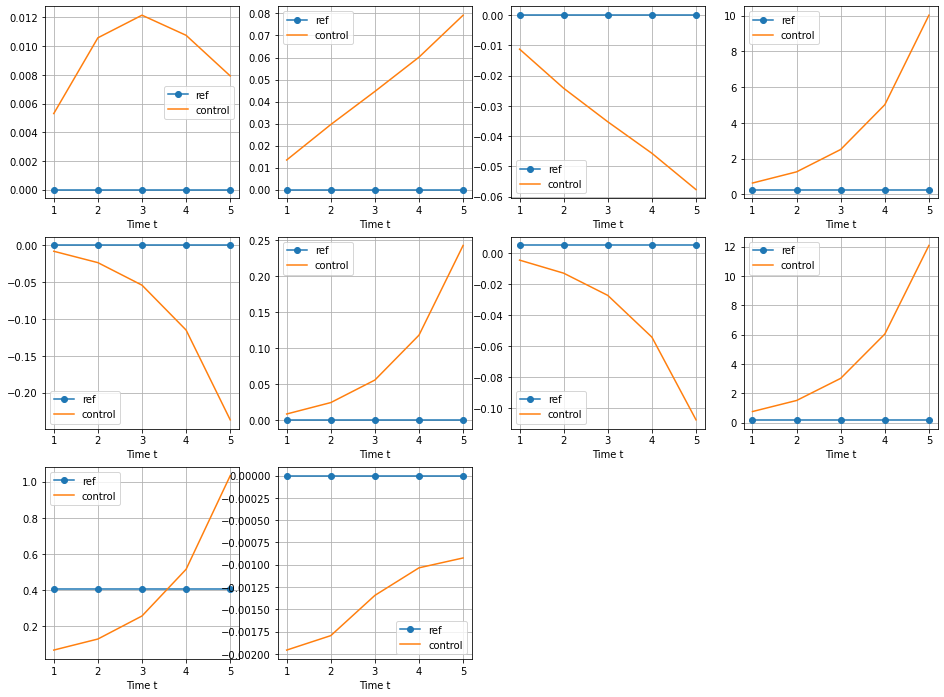

2.0645128409351385 [-1.3502468   1.92336762  3.1       ] [0.70331162 0.5       ]
Point 4 ,Step 3 - MSE error in lifted space,state x, input u:


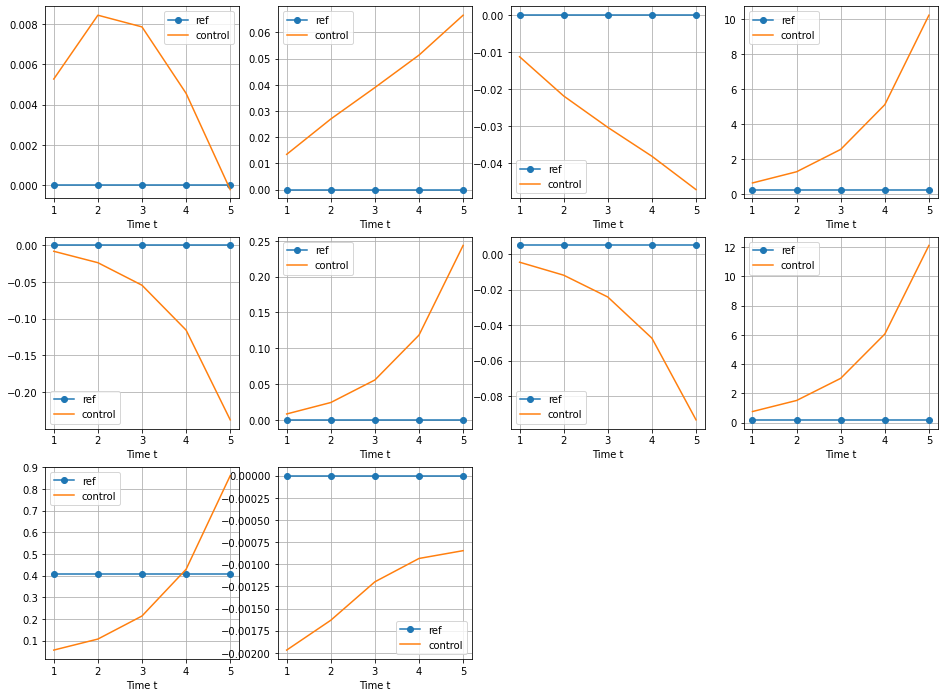

2.094001766970302 [-1.42106878  1.92631499  3.15      ] [0.70883281 0.5       ]
Point 4 ,Step 4 - MSE error in lifted space,state x, input u:


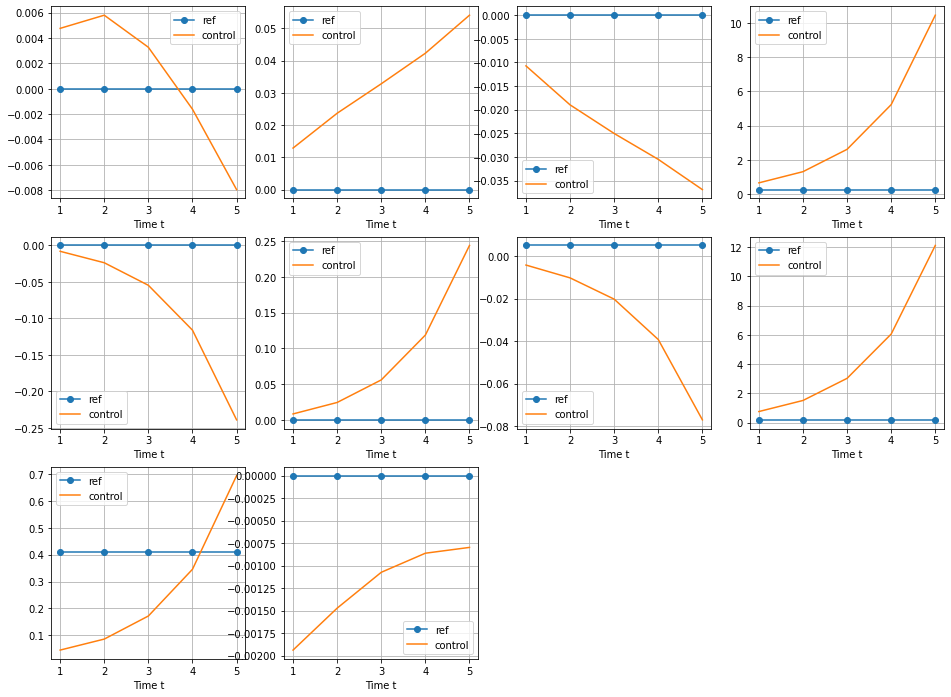

2.122450890591841 [-1.49242323  1.92571508  3.19752098] [0.7135697  0.47520984]
Point 4 ,Step 5 - MSE error in lifted space,state x, input u:
2.1499382564567786 [-1.5639871   1.92170845  3.23074574] [0.71675944 0.33224751]
Point 4 ,Step 6 - MSE error in lifted space,state x, input u:
2.177374684400015 [-1.63565342  1.9153022   3.25054319] [0.71952079 0.19797452]
Point 4 ,Step 7 - MSE error in lifted space,state x, input u:
2.2056646798805124 [-1.70753353  1.90743969  3.26410301] [0.72308846 0.13559823]
Point 4 ,Step 8 - MSE error in lifted space,state x, input u:
2.2352235711895174 [-1.77971313  1.89855243  3.27477078] [0.72724677 0.10667768]
Point 4 ,Step 9 - MSE error in lifted space,state x, input u:
2.266229414992222 [-1.85223479  1.88883662  3.28382301] [0.7316958 0.0905223]
Point 4 ,Step 10 - MSE error in lifted space,state x, input u:
2.298765767765579 [-1.92511799  1.87839995  3.29180666] [0.73626659 0.07983649]
Point 4 ,Step 11 - MSE error in lifted space,state x, input u:
2.3

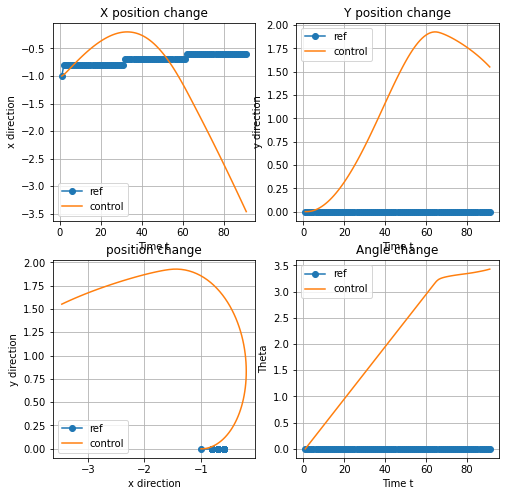

Point 5 ,Step 1 - MSE error in lifted space,state x, input u:


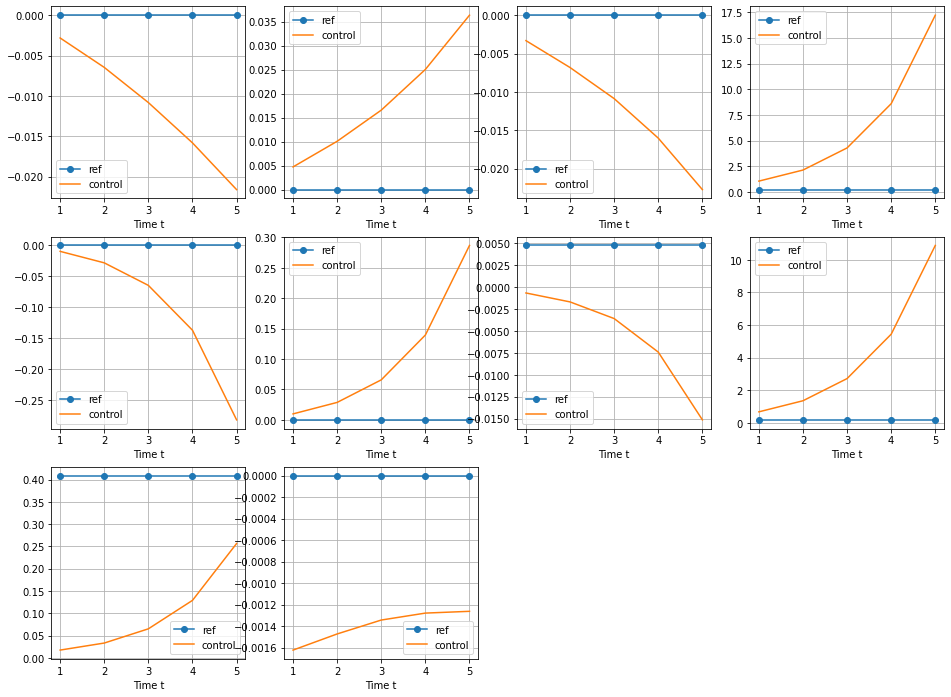

3.4032854241514414 [-3.54151247  1.52694257  3.44034032] [0.83796086 0.11427281]
Point 5 ,Step 2 - MSE error in lifted space,state x, input u:


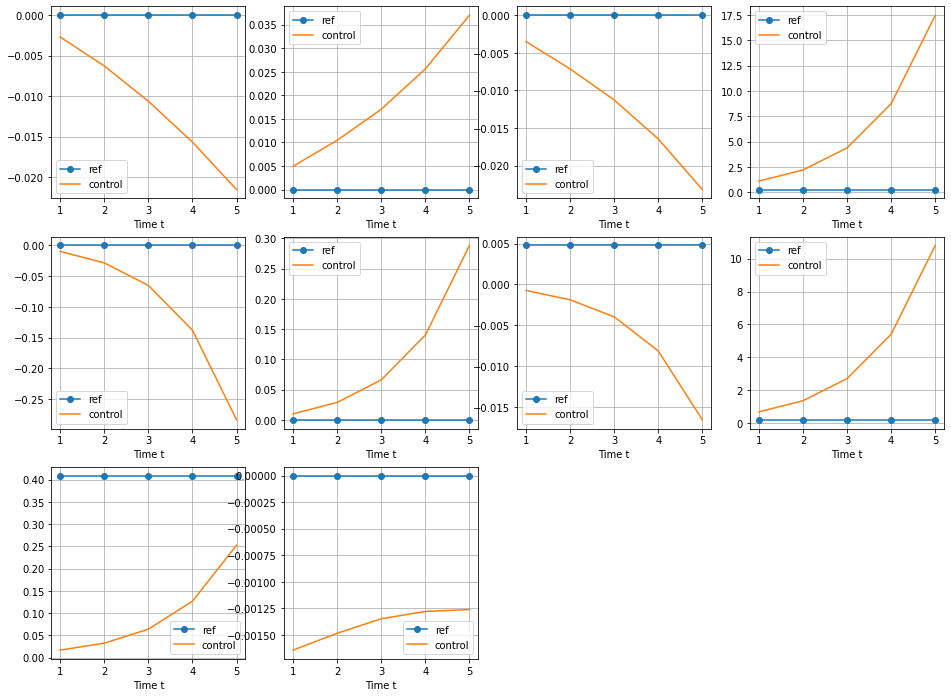

3.4646467302577535 [-3.62207945  1.50213079  3.45264718] [0.84301023 0.12306861]
Point 5 ,Step 3 - MSE error in lifted space,state x, input u:


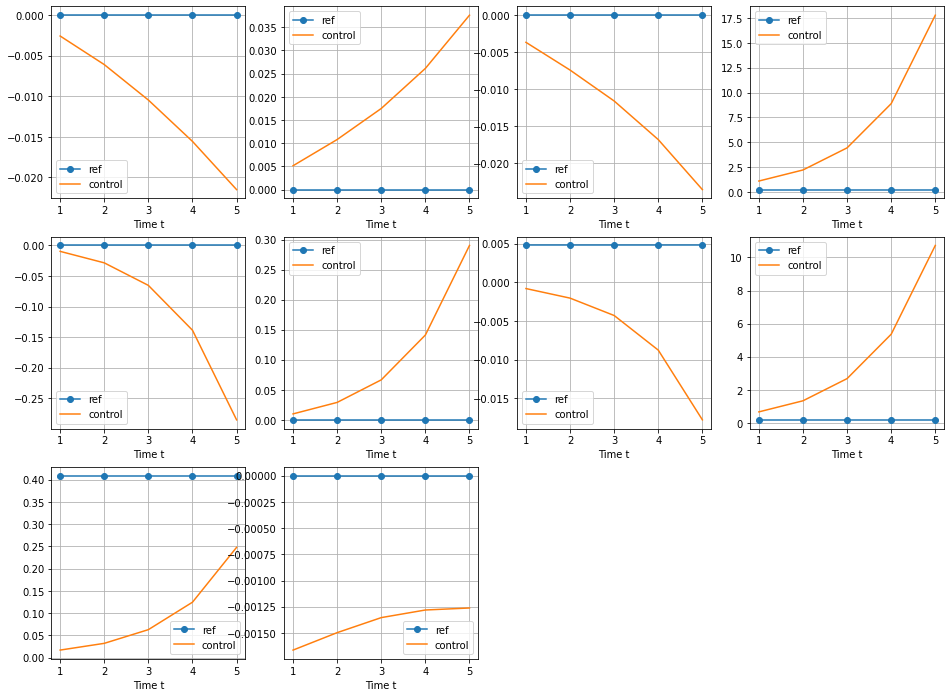

3.5266171951449 [-3.70279889  1.47618024  3.46572993] [0.84788322 0.13082748]
Point 5 ,Step 4 - MSE error in lifted space,state x, input u:


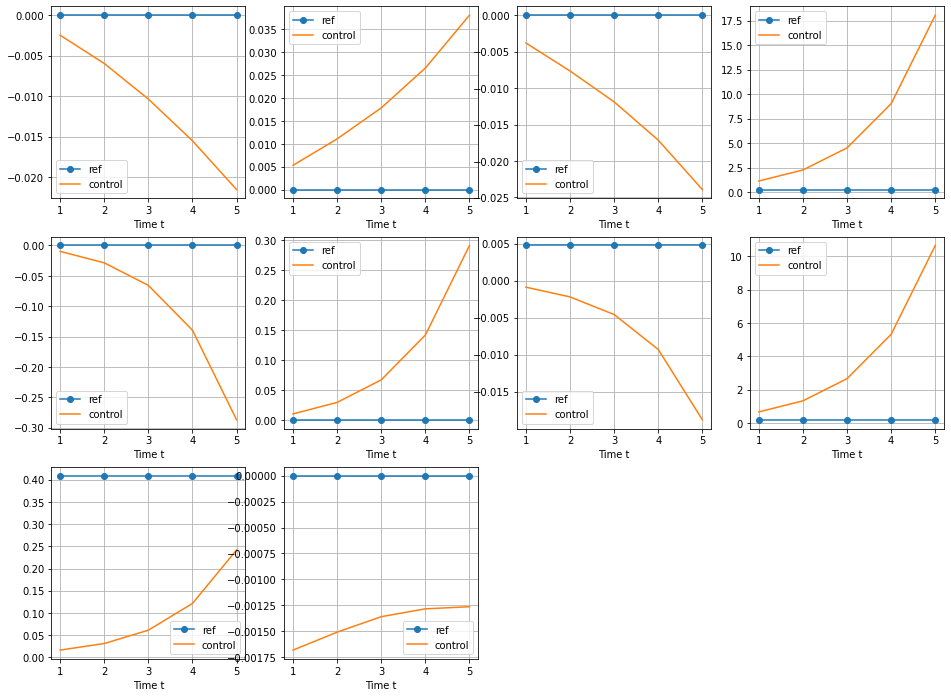

3.5891257492074584 [-3.783618    1.44902604  3.47945895] [0.85258894 0.13729023]
Point 5 ,Step 5 - MSE error in lifted space,state x, input u:
3.65210557793315 [-3.86447987  1.4206162   3.49349705] [0.85707414 0.14038101]
Point 5 ,Step 6 - MSE error in lifted space,state x, input u:
3.715509468651848 [-3.94533483  1.39092721  3.50757424] [0.86133392 0.14077192]
Point 5 ,Step 7 - MSE error in lifted space,state x, input u:
3.7793084772980743 [-4.02614353  1.35995749  3.5216031 ] [0.86539988 0.14028863]
Point 5 ,Step 8 - MSE error in lifted space,state x, input u:
3.843477730833752 [-4.10686792  1.32771416  3.53552794] [0.86925592 0.13924835]
Point 5 ,Step 9 - MSE error in lifted space,state x, input u:
3.907997090687263 [-4.18747388  1.29420928  3.54933155] [0.87292029 0.13803609]
Point 5 ,Step 10 - MSE error in lifted space,state x, input u:
3.972847018078998 [-4.26792783  1.25945755  3.56299691] [0.87638579 0.13665362]
Point 5 ,Step 11 - MSE error in lifted space,state x, input u:
4.0

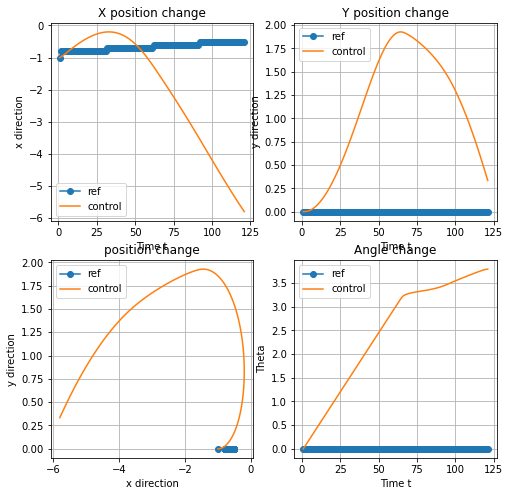

Point 6 ,Step 1 - MSE error in lifted space,state x, input u:


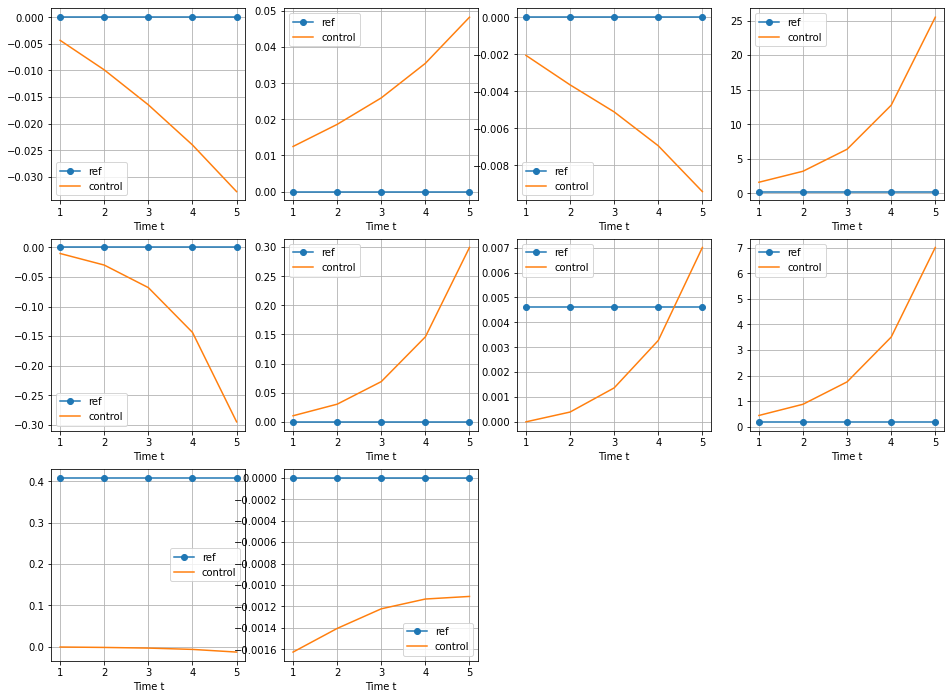

5.478529976863142 [-5.87141766  0.27906894  3.80206657] [0.89374265 0.05140593]
Point 6 ,Step 2 - MSE error in lifted space,state x, input u:


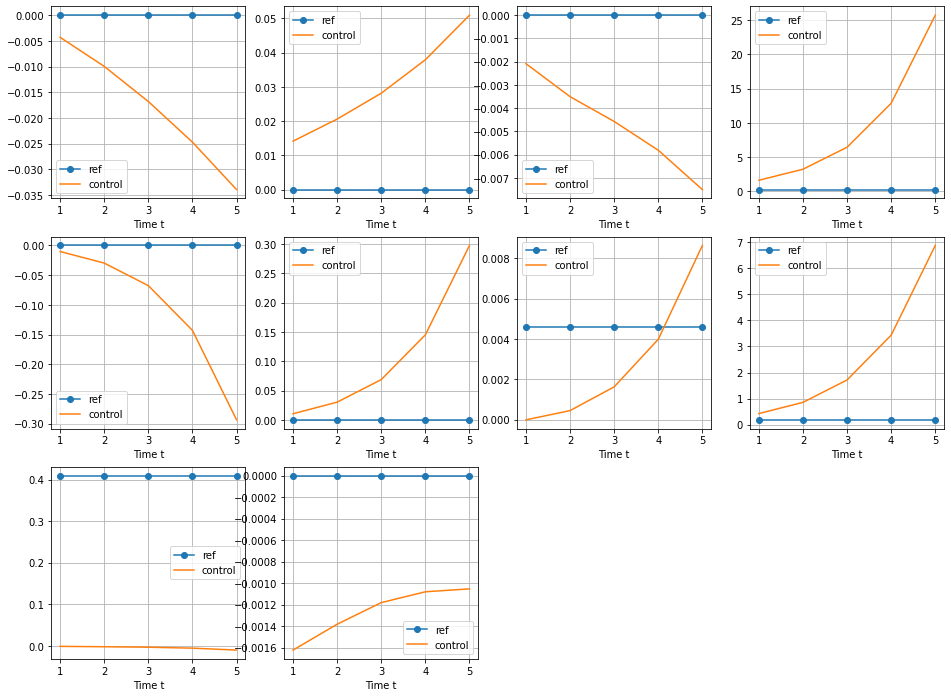

5.546358760368997 [-5.94181833  0.22437716  3.8073278 ] [0.89148444 0.05261226]
Point 6 ,Step 3 - MSE error in lifted space,state x, input u:


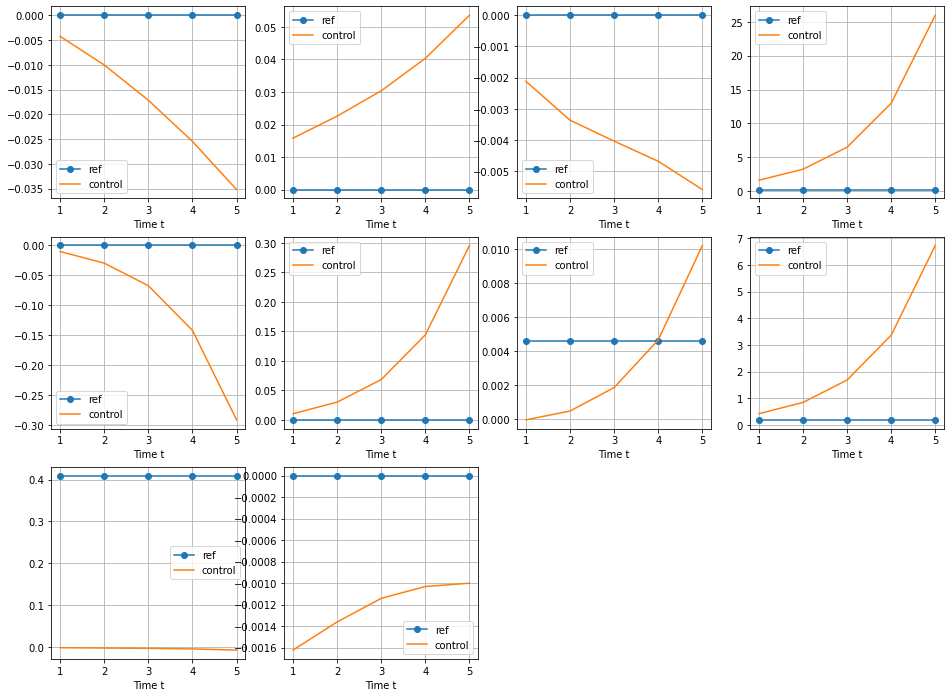

5.614305204905725 [-6.01174718  0.16945953  3.81275321] [0.88915632 0.05425415]
Point 6 ,Step 4 - MSE error in lifted space,state x, input u:


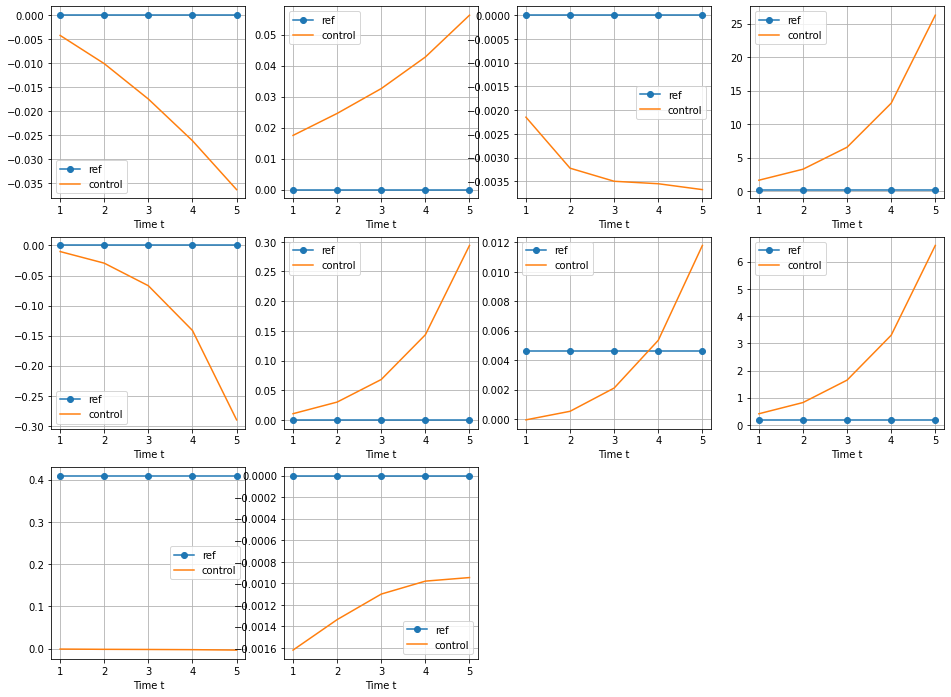

5.682340273862641 [-6.08119035  0.11431158  3.81835422] [0.88677227 0.0560101 ]
Point 6 ,Step 5 - MSE error in lifted space,state x, input u:
5.750435550542501 [-6.15013361  0.05892815  3.82413316] [0.88433575 0.05778939]
Point 6 ,Step 6 - MSE error in lifted space,state x, input u:
5.818563464276619 [-6.21856253e+00  3.30420390e-03  3.83008978e+00] [0.88184693 0.05956616]
Point 6 ,Step 7 - MSE error in lifted space,state x, input u:
5.8866153021266125 [-6.2863812  -0.05249786  3.83617337] [0.87825074 0.06083588]
Point 6 ,Step 8 - MSE error in lifted space,state x, input u:
5.9543495889771 [-6.35336462 -0.10829949  3.84225477] [0.87181414 0.060814  ]
Point 6 ,Step 9 - MSE error in lifted space,state x, input u:
6.021866198338806 [-6.41962749 -0.16418698  3.84853341] [0.86684373 0.06278644]
Point 6 ,Step 10 - MSE error in lifted space,state x, input u:
6.089271646301677 [-6.48528623 -0.2202742   3.85517358] [0.86353026 0.06640173]
Point 6 ,Step 11 - MSE error in lifted space,state x, in

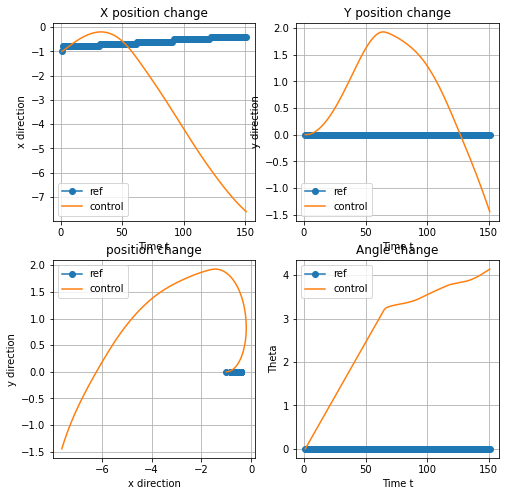

Point 7 ,Step 1 - MSE error in lifted space,state x, input u:


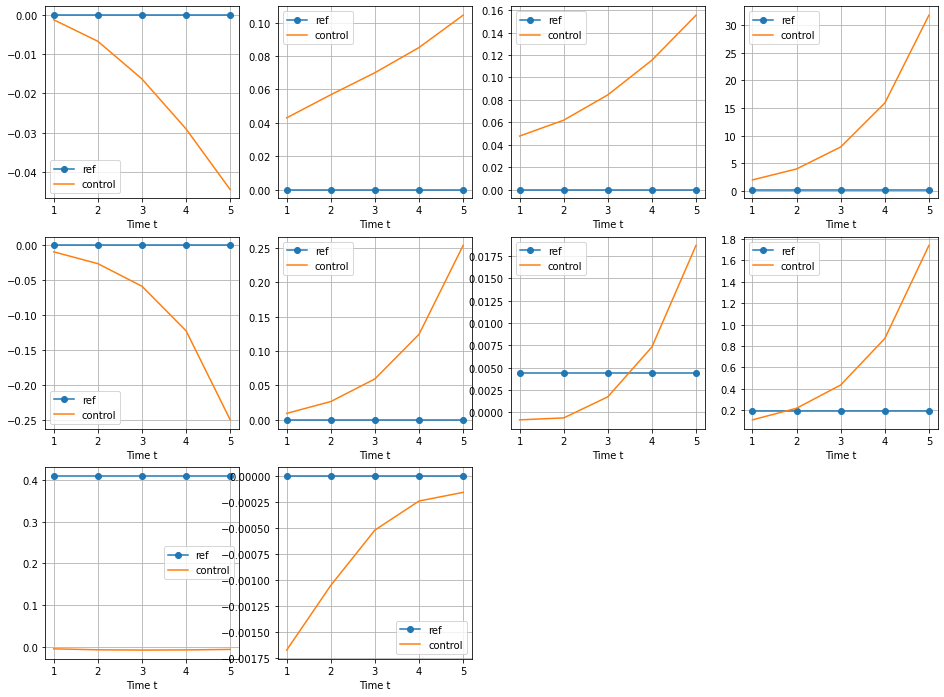

7.509349032267839 [-7.6557144  -1.51122088  4.15894517] [0.80506178 0.19080585]
Point 7 ,Step 2 - MSE error in lifted space,state x, input u:


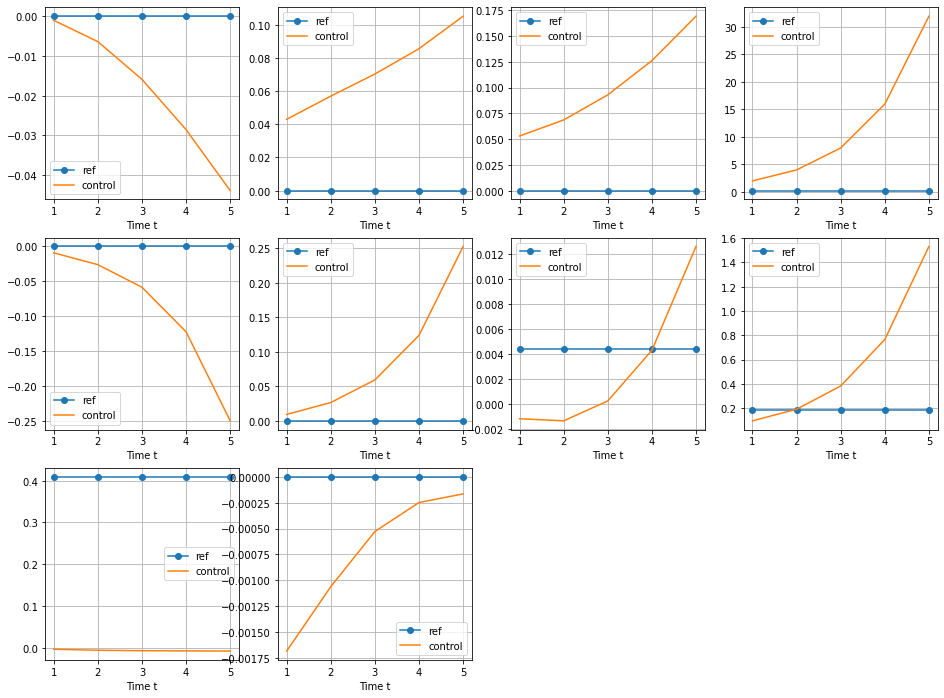

7.56461066287539 [-7.69787963 -1.57946557  4.17863276] [0.80219975 0.19687582]
Point 7 ,Step 3 - MSE error in lifted space,state x, input u:


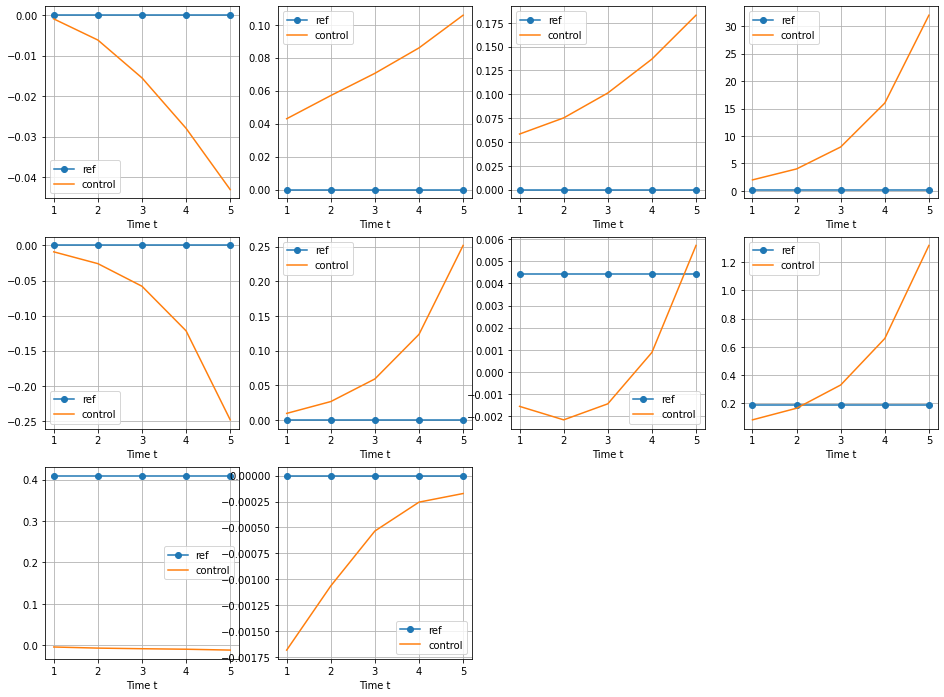

7.61897356584221 [-7.73854459 -1.64827565  4.19888902] [0.79927878 0.20256263]
Point 7 ,Step 4 - MSE error in lifted space,state x, input u:


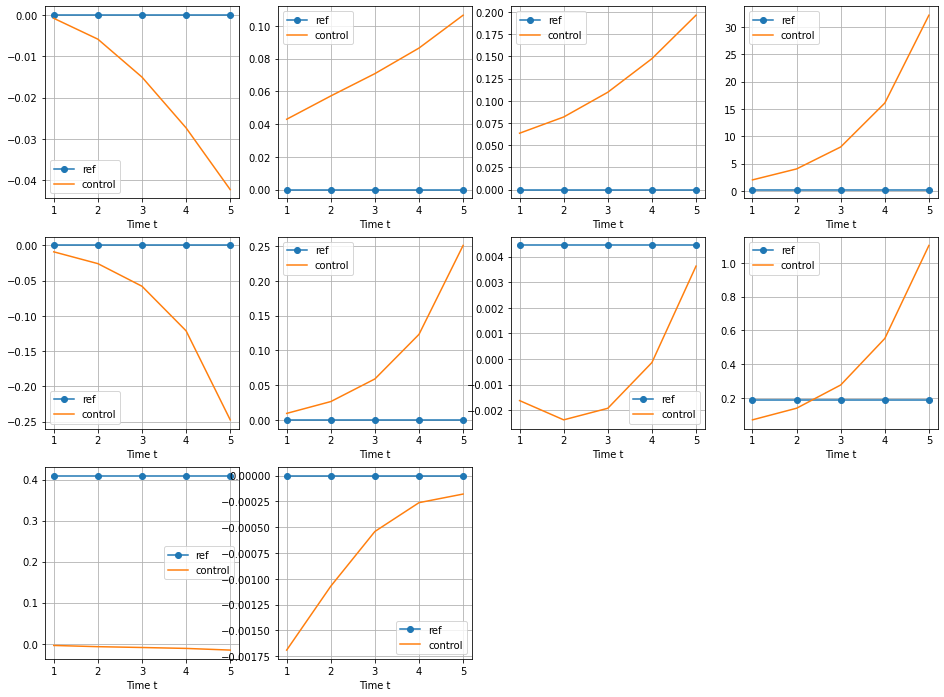

7.6723825784736785 [-7.77765    -1.71761606  4.21990675] [0.79607322 0.21017733]
Point 7 ,Step 5 - MSE error in lifted space,state x, input u:
7.724778039185264 [-7.81512922 -1.78746429  4.24173957] [0.79268324 0.2183282 ]
Point 7 ,Step 6 - MSE error in lifted space,state x, input u:
7.776099057215305 [-7.85091398 -1.85779831  4.26440158] [0.7891403  0.22662009]
Point 7 ,Step 7 - MSE error in lifted space,state x, input u:
7.8262842928280065 [-7.88493609 -1.92859285  4.28789541] [0.7854534  0.23493824]
Point 7 ,Step 8 - MSE error in lifted space,state x, input u:
7.875272179779596 [-7.91712802 -1.99981817  4.31222006] [0.78162431 0.24324652]
Point 7 ,Step 9 - MSE error in lifted space,state x, input u:
7.9230010517943095 [-7.94742333 -2.0714396   4.33737312] [0.77765262 0.25153066]
Point 7 ,Step 10 - MSE error in lifted space,state x, input u:
7.969707192445414 [-7.97593798 -2.14387707  4.3632242 ] [0.77847754 0.25851076]
Point 7 ,Step 11 - MSE error in lifted space,state x, input u:
8

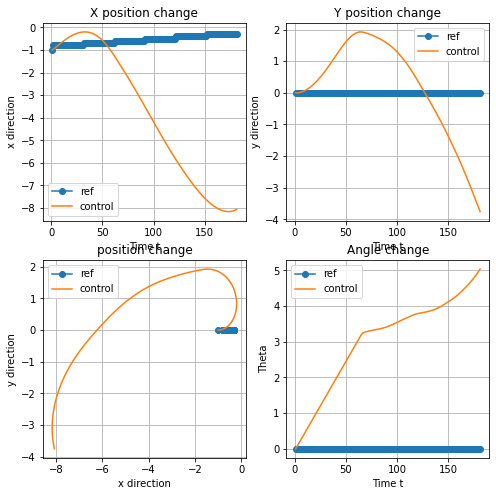

Point 8 ,Step 1 - MSE error in lifted space,state x, input u:


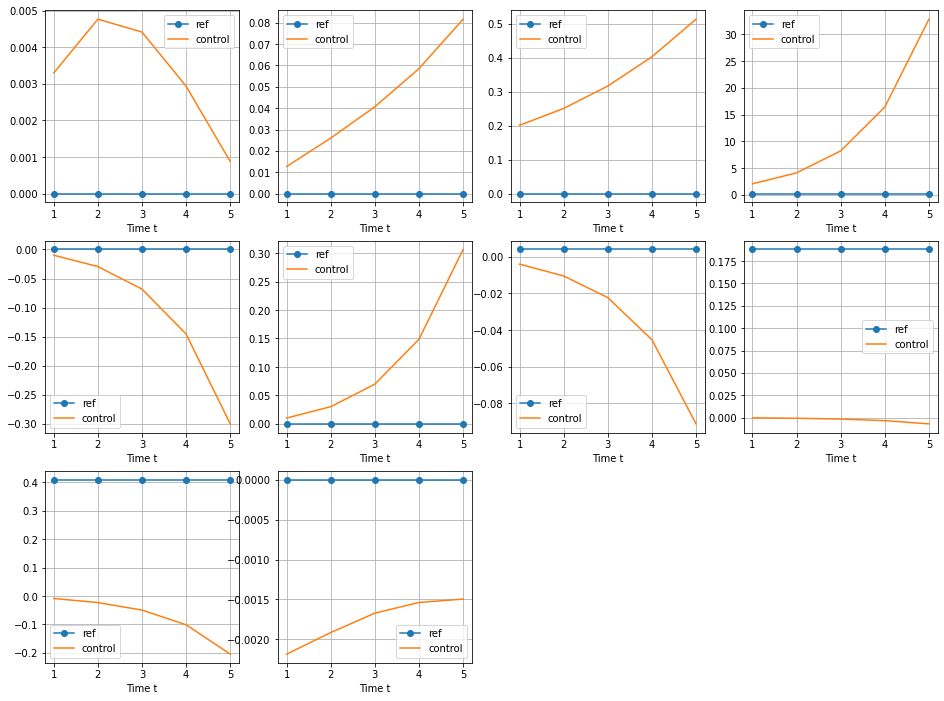

8.721105172592198 [-8.03178019 -3.83678178  5.08337055] [0.87693233 0.44897618]
Point 8 ,Step 2 - MSE error in lifted space,state x, input u:


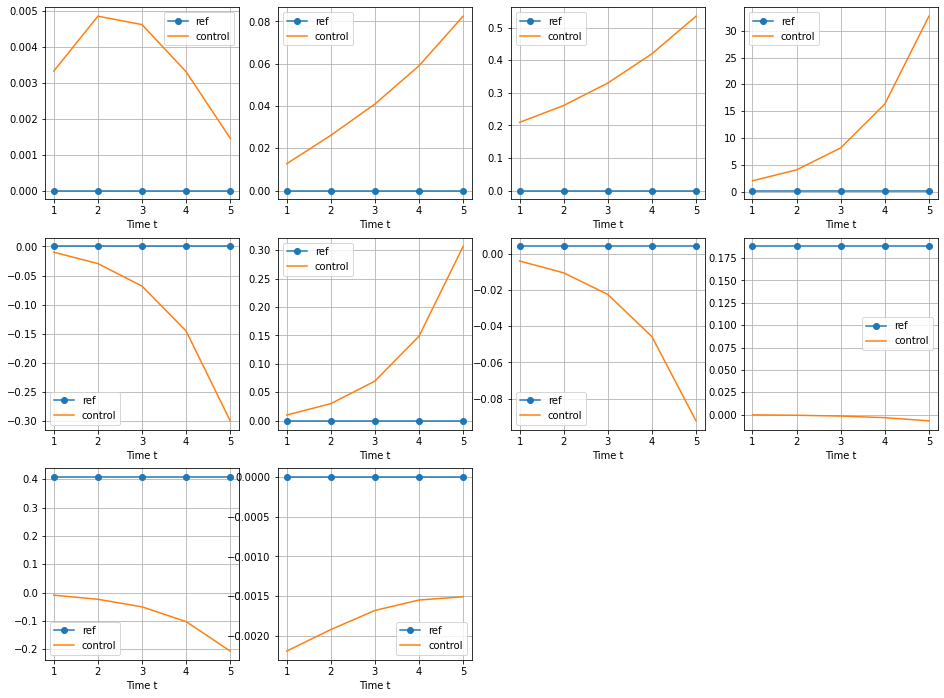

8.728949556145508 [-7.9999843  -3.9185208   5.12843382] [0.87705445 0.4506327 ]
Point 8 ,Step 3 - MSE error in lifted space,state x, input u:


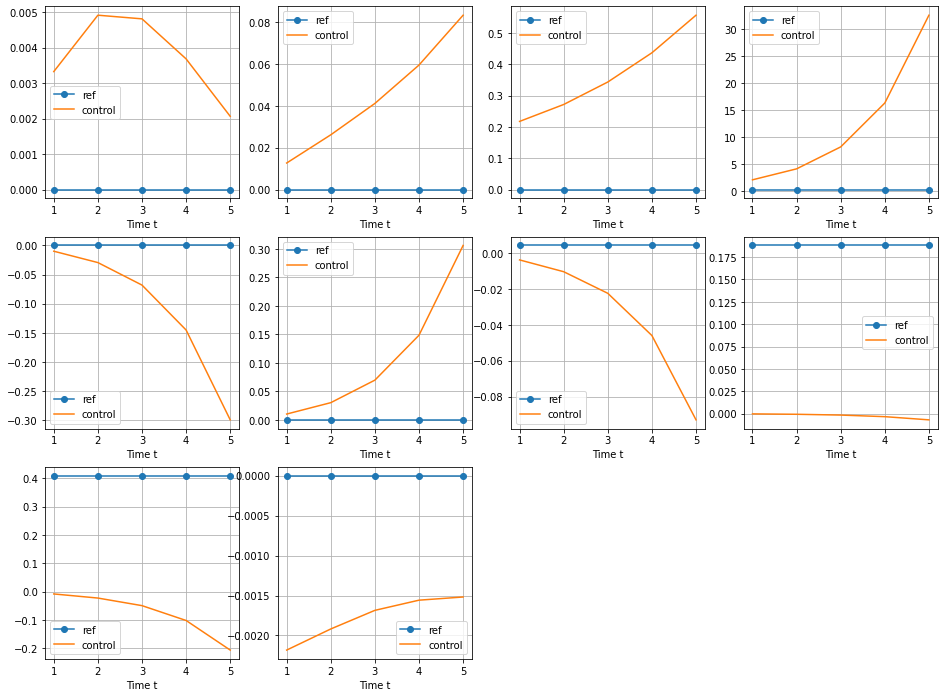

8.733718976995855 [-7.96460408 -3.99859608  5.1734205 ] [0.87543189 0.44986677]
Point 8 ,Step 4 - MSE error in lifted space,state x, input u:


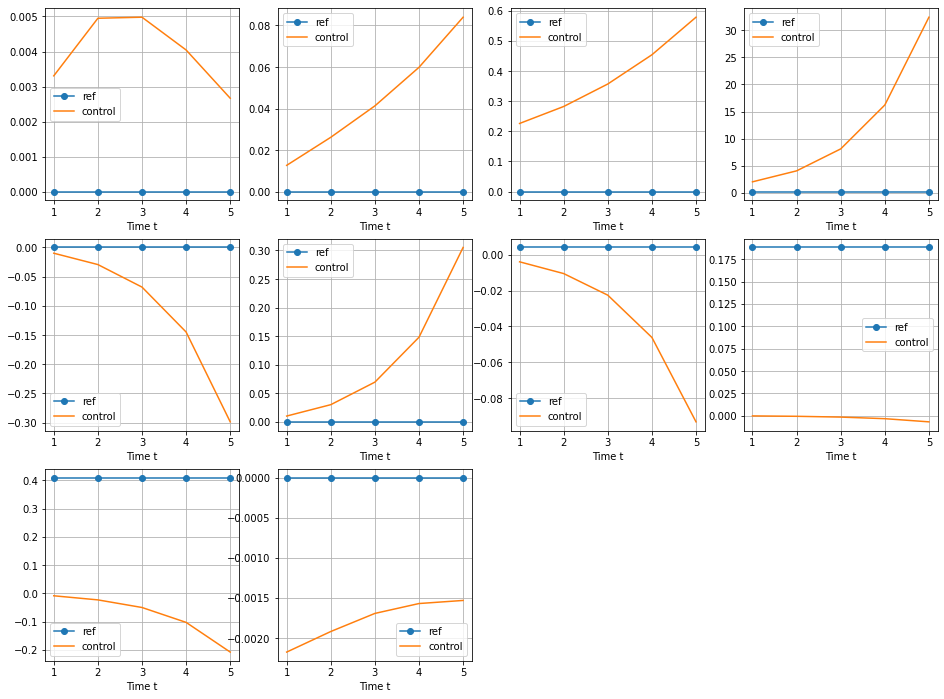

8.735423073883727 [-7.92576926 -4.07677638  5.21822877] [0.87294352 0.44808273]
Point 8 ,Step 5 - MSE error in lifted space,state x, input u:
8.734091195271661 [-7.88361807 -4.15287399  5.2627973 ] [0.86991779 0.44568531]
Point 8 ,Step 6 - MSE error in lifted space,state x, input u:
8.729765308514 [-7.838298   -4.22672522  5.30707703] [0.86648211 0.44279728]
Point 8 ,Step 7 - MSE error in lifted space,state x, input u:
8.722497598387822 [-7.78996569 -4.29818393  5.35102329] [0.86269109 0.43946261]
Point 8 ,Step 8 - MSE error in lifted space,state x, input u:
8.71234936815931 [-7.73878617 -4.36711971  5.39459368] [0.8585735  0.43570395]
Point 8 ,Step 9 - MSE error in lifted space,state x, input u:
8.699390257558587 [-7.68493157 -4.43341745  5.43774757] [0.85414926 0.43153889]
Point 8 ,Step 10 - MSE error in lifted space,state x, input u:
8.683697482136393 [-7.6285796  -4.49697755  5.48044616] [0.84943688 0.42698588]
Point 8 ,Step 11 - MSE error in lifted space,state x, input u:
8.665354

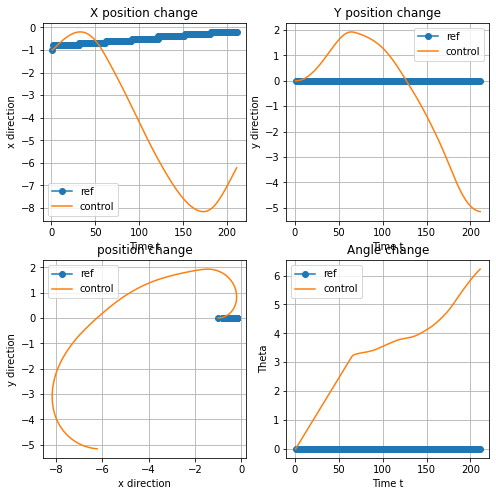

Point 9 ,Step 1 - MSE error in lifted space,state x, input u:


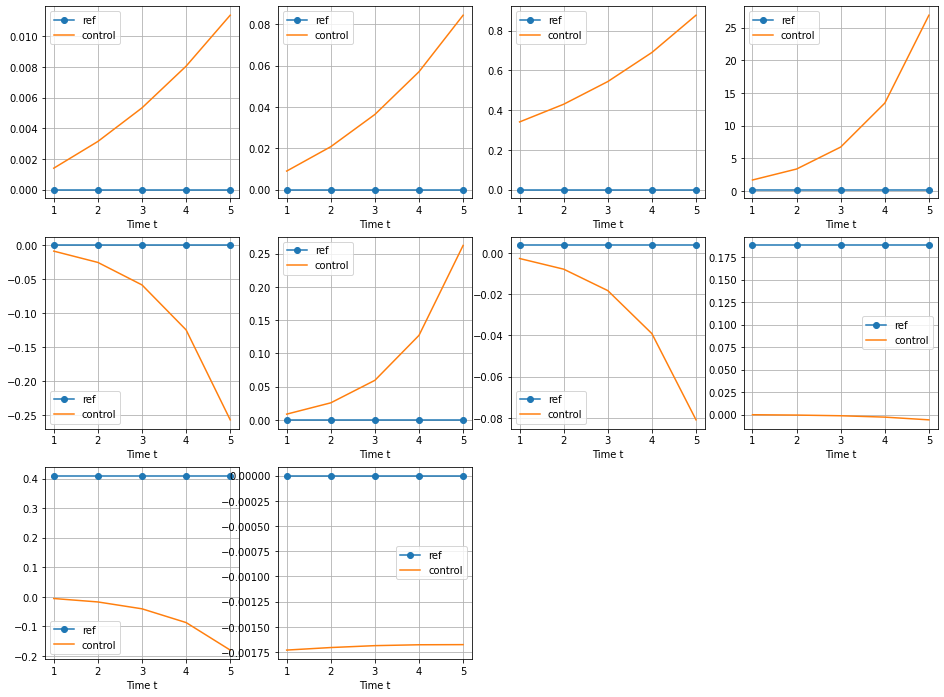

7.948303590359334 [-6.14462308 -5.1612074   6.25612291] [0.7377055 0.30522  ]
Point 9 ,Step 2 - MSE error in lifted space,state x, input u:


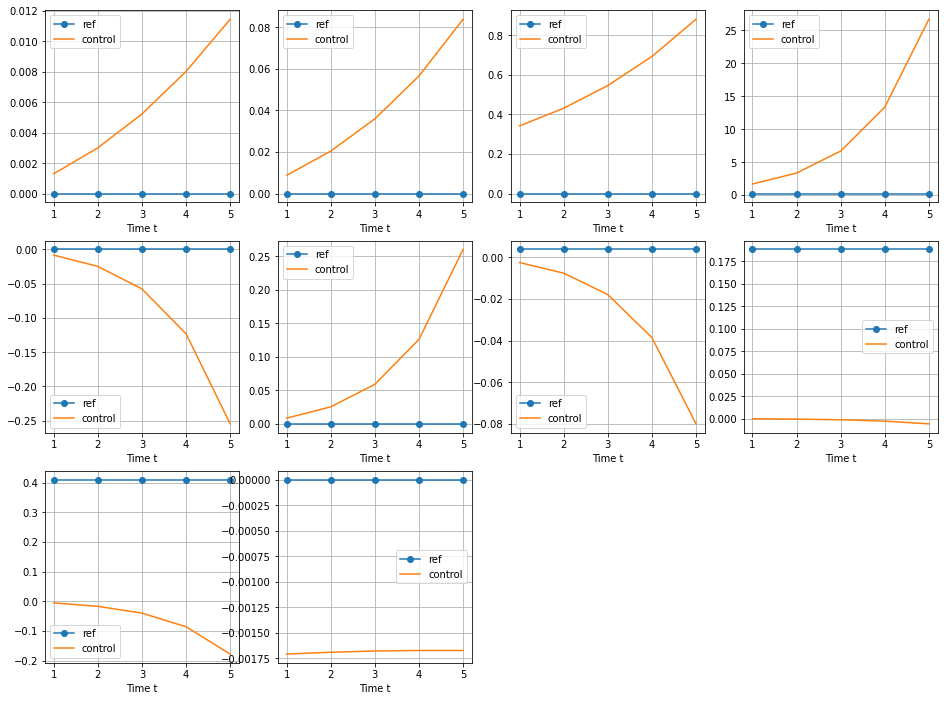

7.894111261781348 [-6.0714728  -5.1631875   6.28594191] [0.73177071 0.29818997]
Point 9 ,Step 3 - MSE error in lifted space,state x, input u:


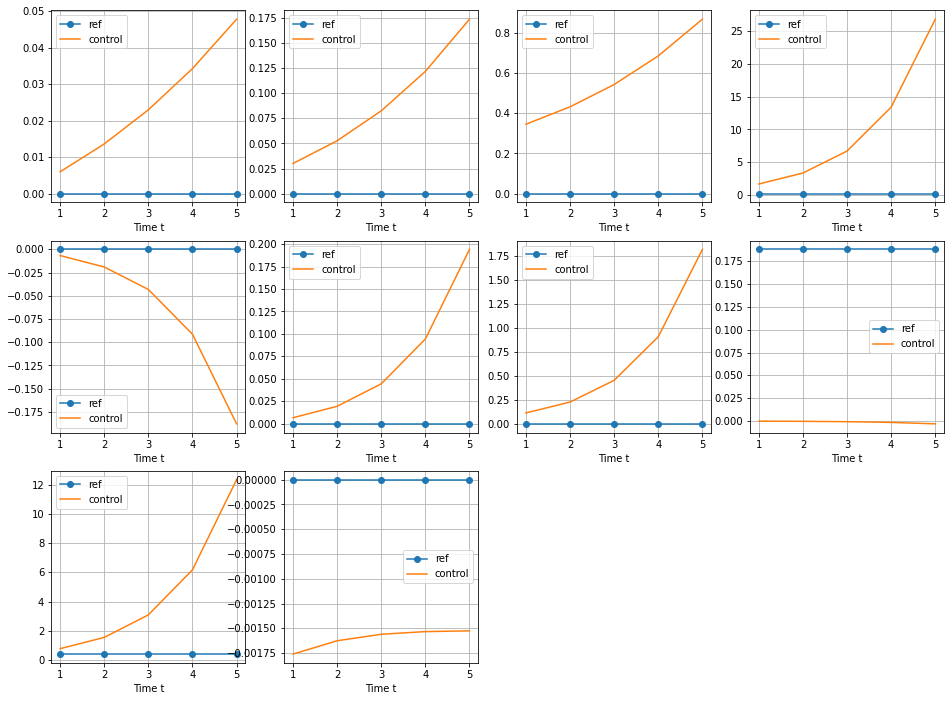

7.8495705524087365 [-6.01260757 -5.16302523  0.0527566 ] [0.58865455 0.5       ]
Point 9 ,Step 4 - MSE error in lifted space,state x, input u:


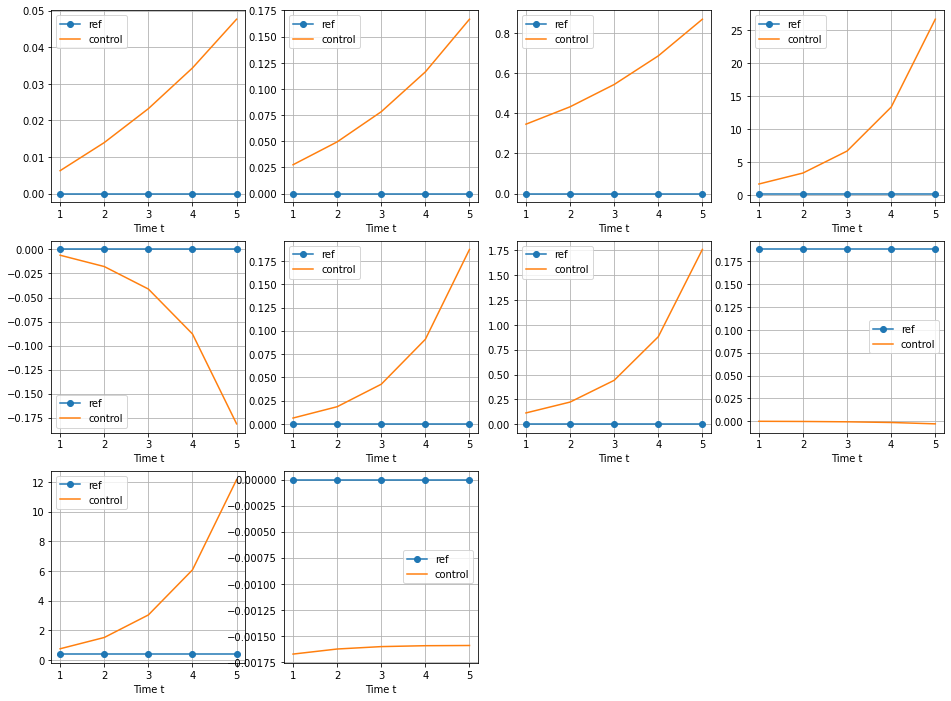

7.80716697070017 [-5.95870384 -5.16017881  0.1027566 ] [0.5397883 0.5      ]
Point 9 ,Step 5 - MSE error in lifted space,state x, input u:
7.764479544425405 [-5.90648289 -5.1547938   0.1527566 ] [0.52497875 0.5       ]
Point 9 ,Step 6 - MSE error in lifted space,state x, input u:
7.720637534704645 [-5.85484511 -5.14684385  0.2027566 ] [0.52246159 0.5       ]
Point 9 ,Step 7 - MSE error in lifted space,state x, input u:
7.675359391504759 [-5.80348318 -5.13628479  0.2527566 ] [0.52436079 0.5       ]
Point 9 ,Step 8 - MSE error in lifted space,state x, input u:
7.62862185990614 [-5.75241321 -5.12309442  0.3027566 ] [0.5274588 0.5      ]
Point 9 ,Step 9 - MSE error in lifted space,state x, input u:
7.580503727479016 [-5.70176626 -5.10727438  0.3527566 ] [0.53060223 0.5       ]
Point 9 ,Step 10 - MSE error in lifted space,state x, input u:
7.531095660713496 [-5.65168074 -5.08883512  0.4027566 ] [0.53371955 0.5       ]
Point 9 ,Step 11 - MSE error in lifted space,state x, input u:
7.48049640

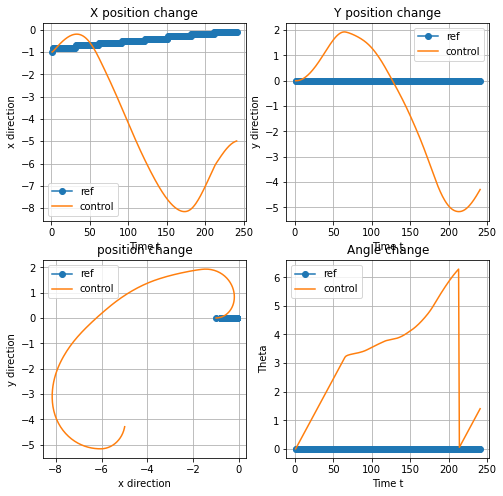

Point 10 ,Step 1 - MSE error in lifted space,state x, input u:


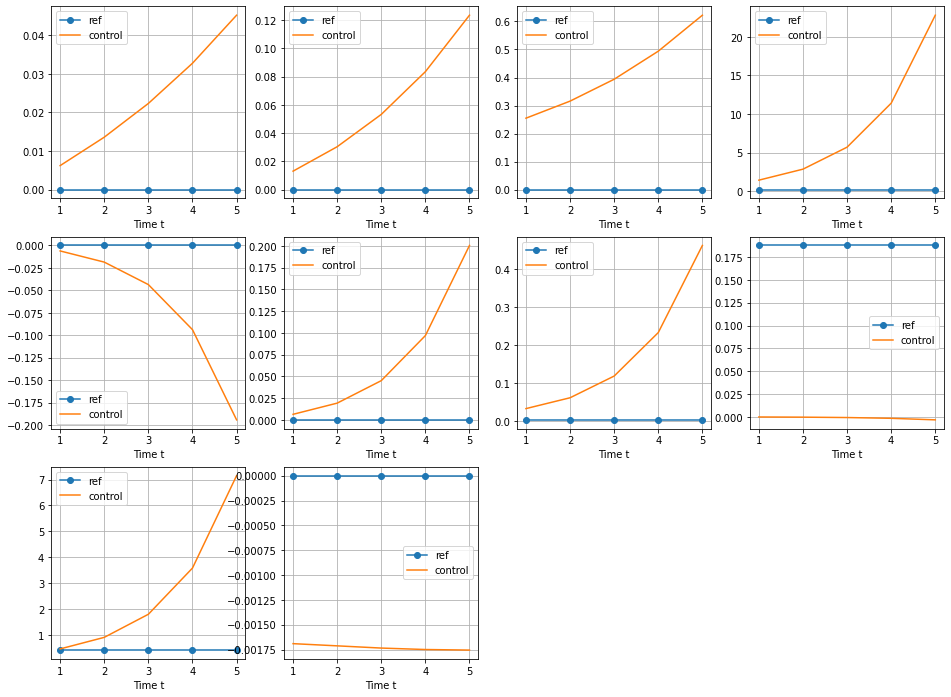

6.539539123864203 [-4.98129021 -4.23701779  1.4527566 ] [0.54855097 0.5       ]
Point 10 ,Step 2 - MSE error in lifted space,state x, input u:


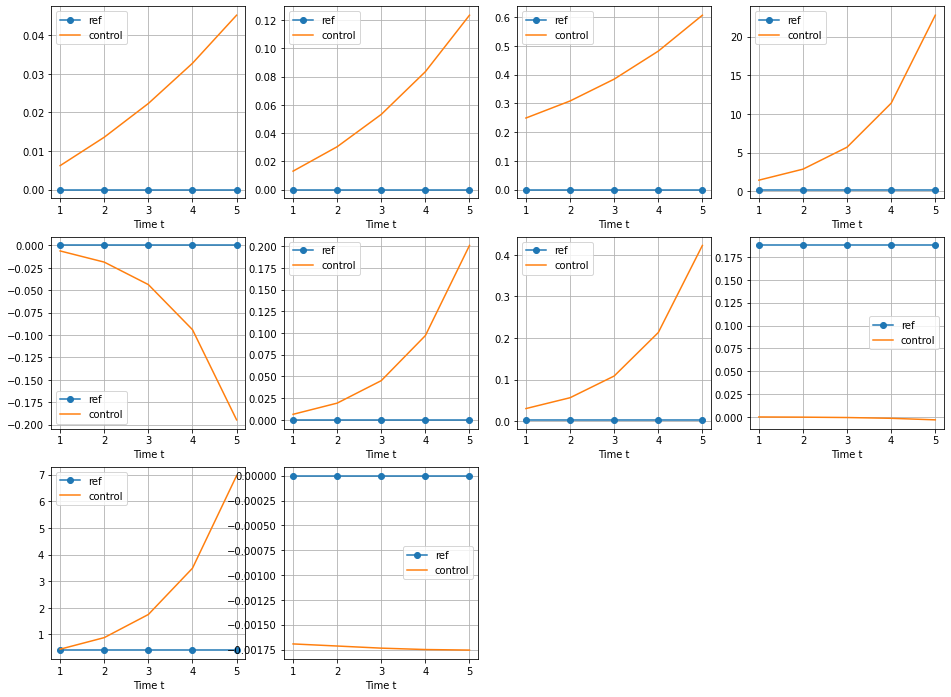

6.499281241231082 [-4.97480585 -4.18233946  1.5027566 ] [0.55061481 0.5       ]
Point 10 ,Step 3 - MSE error in lifted space,state x, input u:


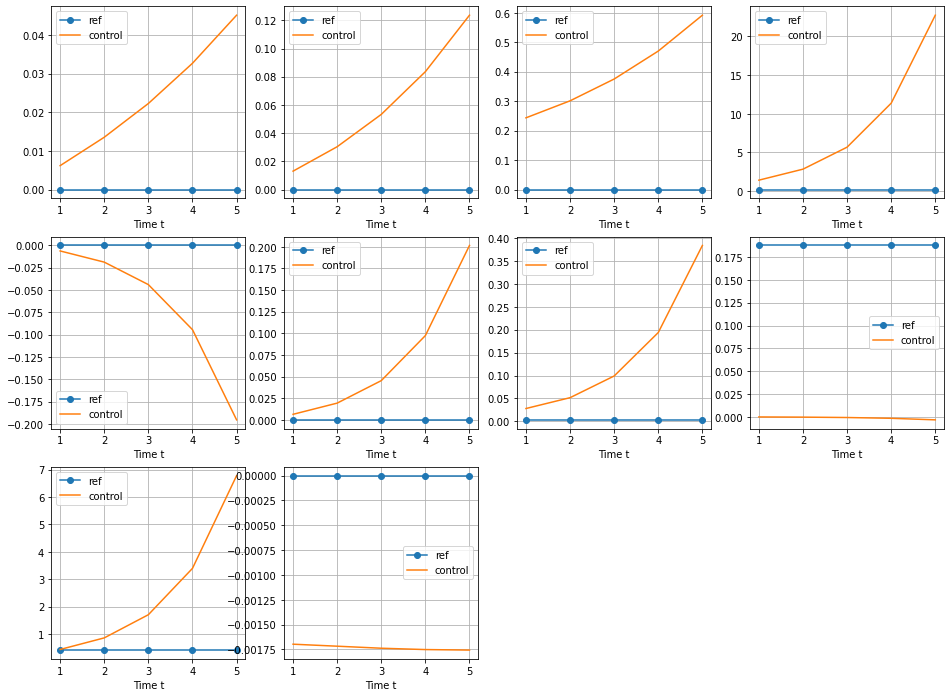

6.461036990873636 [-4.9710476  -4.12718849  1.5527566 ] [0.5527888 0.5      ]
Point 10 ,Step 4 - MSE error in lifted space,state x, input u:


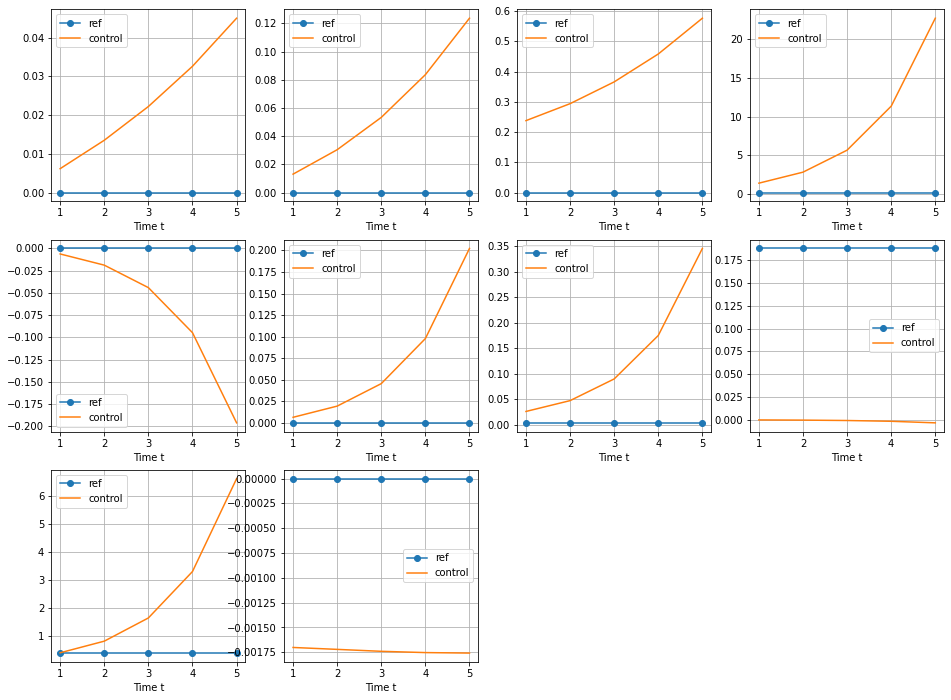

6.424950766273258 [-4.97004625 -4.0716867   1.6027566 ] [0.55510814 0.5       ]
Point 10 ,Step 5 - MSE error in lifted space,state x, input u:
6.391165067572266 [-4.97182797 -4.01595787  1.6527566 ] [0.55757311 0.5       ]
Point 10 ,Step 6 - MSE error in lifted space,state x, input u:
6.359821851024182 [-4.9764138  -3.96013126  1.7027566 ] [0.56014636 0.5       ]
Point 10 ,Step 7 - MSE error in lifted space,state x, input u:
6.33105739064917 [-4.9838198 -3.9043345  1.7527566] [0.56286121 0.5       ]
Point 10 ,Step 8 - MSE error in lifted space,state x, input u:
6.305003015847669 [-4.99405714 -3.84869541  1.8027566 ] [0.56573069 0.5       ]
Point 10 ,Step 9 - MSE error in lifted space,state x, input u:
6.281784826443303 [-5.00713213 -3.79334265  1.8527566 ] [0.56876029 0.5       ]
Point 10 ,Step 10 - MSE error in lifted space,state x, input u:
6.261523040169637 [-5.02304608 -3.73840592  1.9027566 ] [0.57195265 0.5       ]
Point 10 ,Step 11 - MSE error in lifted space,state x, input u:
6

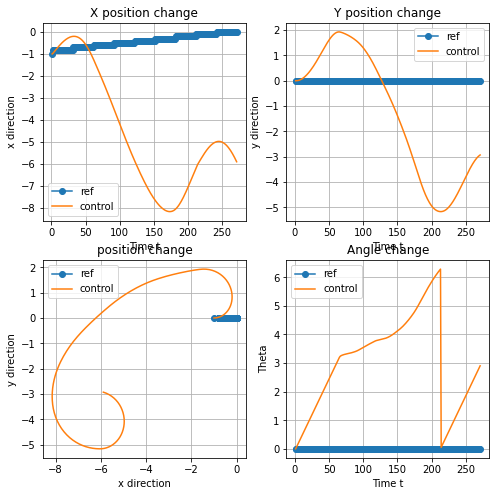

Point 11 ,Step 1 - MSE error in lifted space,state x, input u:


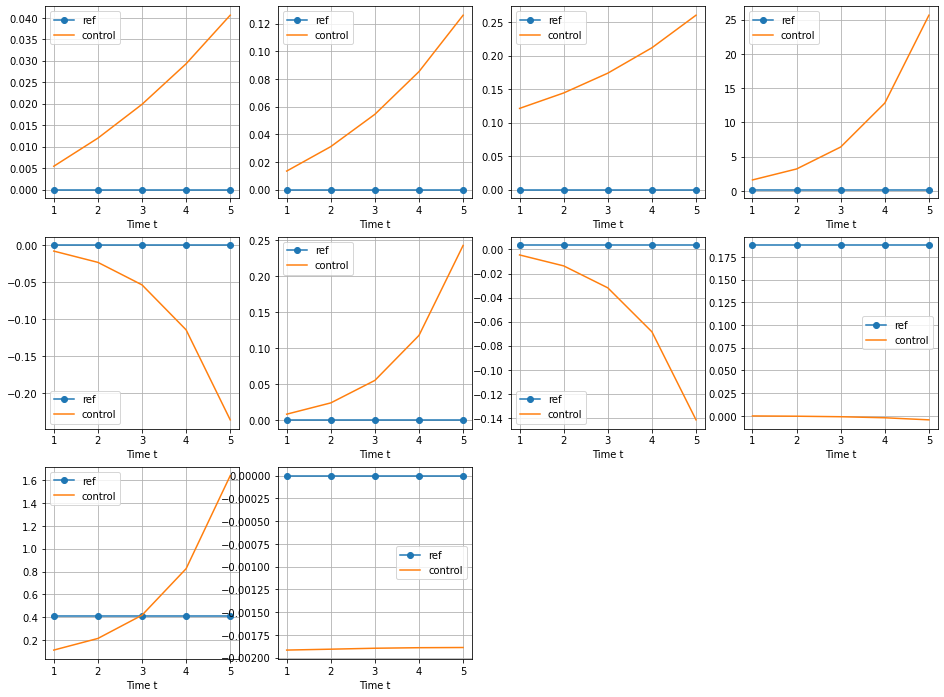

6.722989506450458 [-5.95931518 -2.91260837  2.9527566 ] [0.68008856 0.5       ]
Point 11 ,Step 2 - MSE error in lifted space,state x, input u:


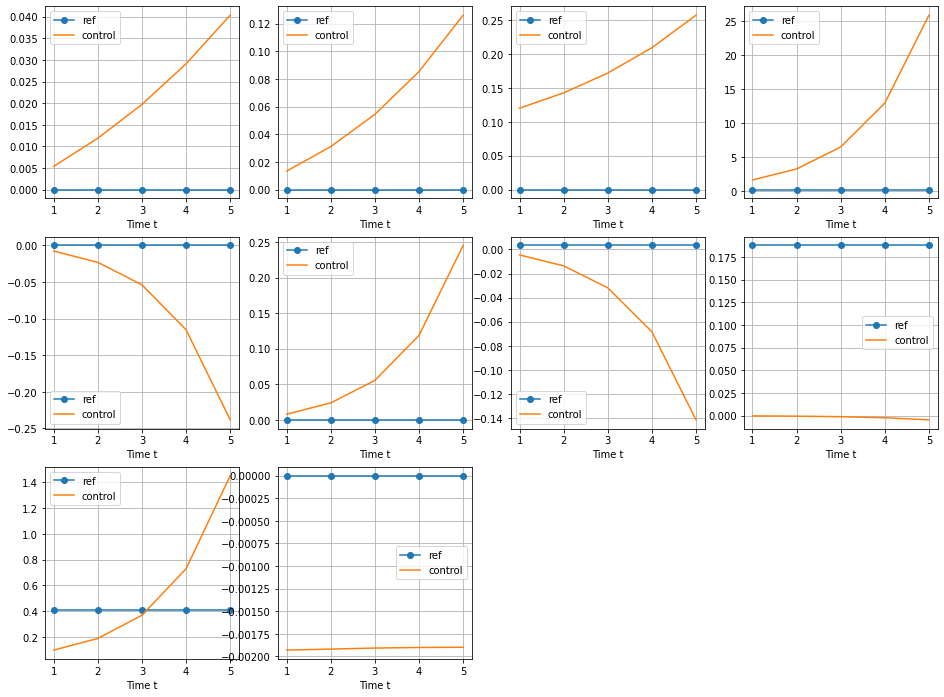

6.778323657679868 [-6.02677028 -2.89971681  3.0027566 ] [0.68675924 0.5       ]
Point 11 ,Step 3 - MSE error in lifted space,state x, input u:


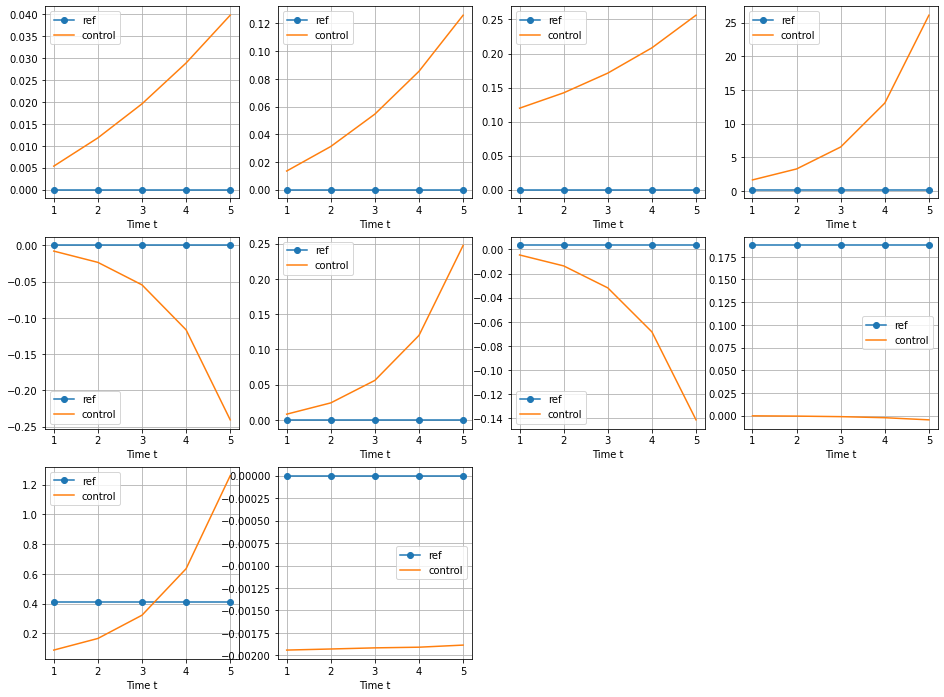

6.836406634126098 [-6.09545537 -2.8901191   3.0527566 ] [0.69352422 0.5       ]
Point 11 ,Step 4 - MSE error in lifted space,state x, input u:


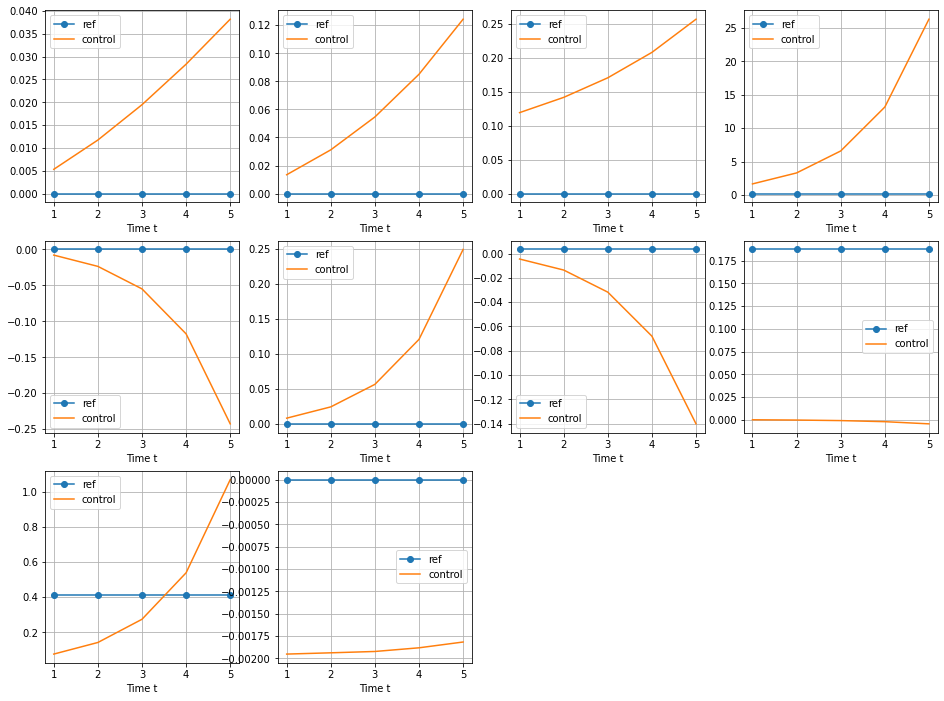

6.897087387237518 [-6.16521367 -2.88390569  3.1027566 ] [0.70034471 0.5       ]
Point 11 ,Step 5 - MSE error in lifted space,state x, input u:
6.960199444340872 [-6.23587345 -2.88116017  3.1527566 ] [0.70713098 0.5       ]
Point 11 ,Step 6 - MSE error in lifted space,state x, input u:
7.025554329266005 [-6.30724104 -2.88195694  3.2027566 ] [0.7137204 0.5      ]
Point 11 ,Step 7 - MSE error in lifted space,state x, input u:
7.092955937090695 [-6.37911704 -2.88635865  3.2527566 ] [0.72010652 0.5       ]
Point 11 ,Step 8 - MSE error in lifted space,state x, input u:
7.162212415842908 [-6.45130807 -2.89441691  3.3027566 ] [0.72639383 0.5       ]
Point 11 ,Step 9 - MSE error in lifted space,state x, input u:
7.233060447480975 [-6.52354815 -2.90616127  3.3527566 ] [0.73188519 0.5       ]
Point 11 ,Step 10 - MSE error in lifted space,state x, input u:
7.305272957992613 [-6.59561164 -2.92160877  3.40173039] [0.73700551 0.48973783]
Point 11 ,Step 11 - MSE error in lifted space,state x, input u:

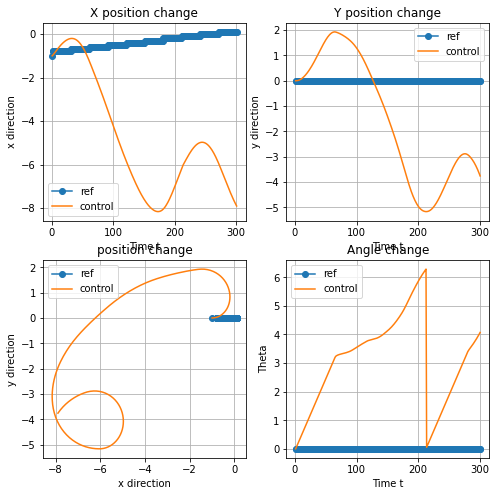

Point 12 ,Step 1 - MSE error in lifted space,state x, input u:


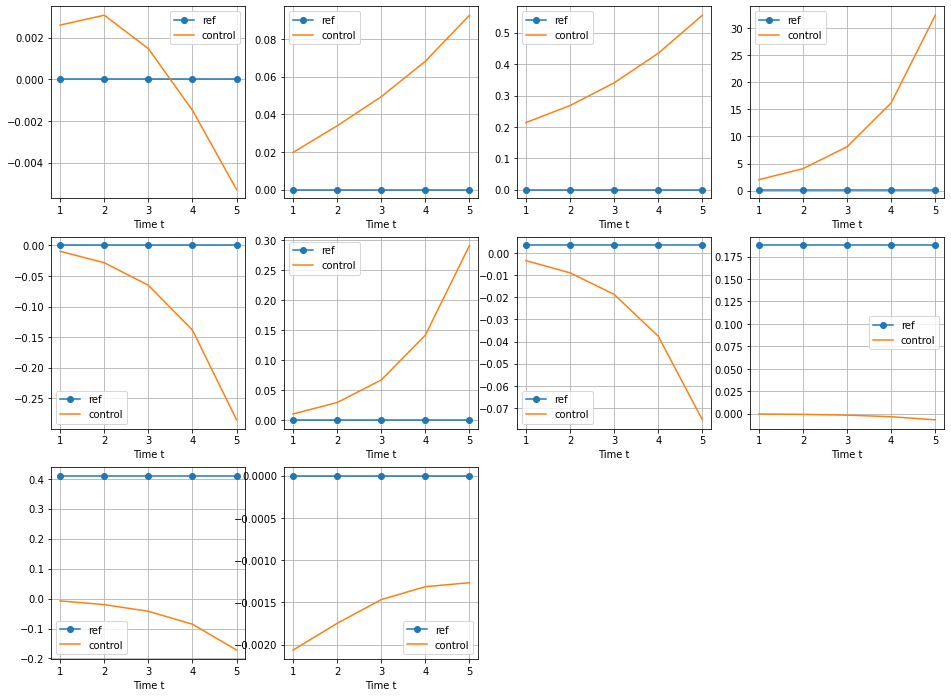

9.001547645481402 [-7.94880192 -3.8242499   4.11093407] [0.84661383 0.40294968]
Point 12 ,Step 2 - MSE error in lifted space,state x, input u:


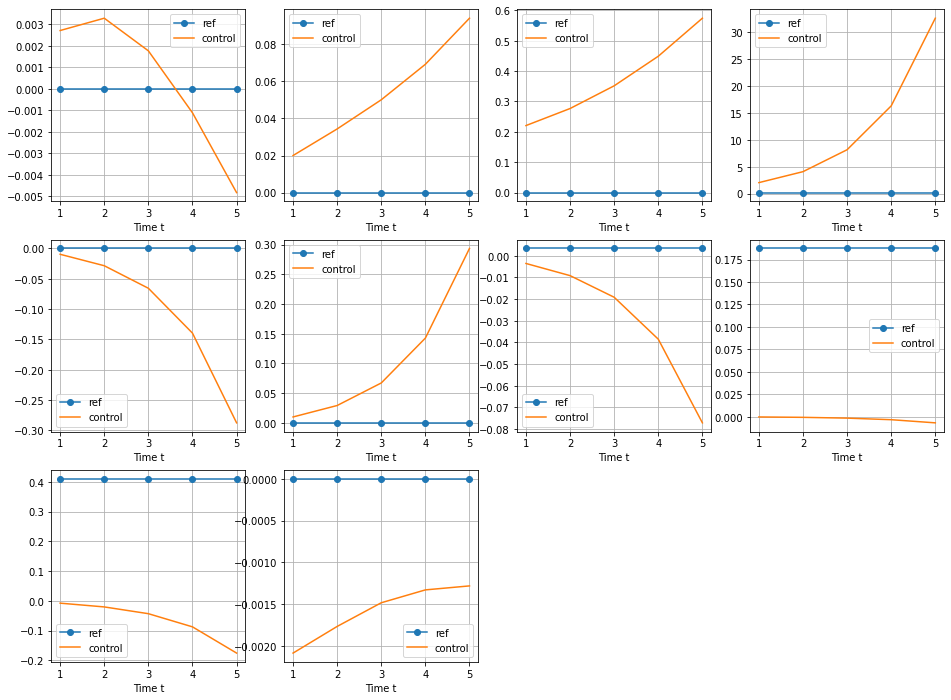

9.075132623708882 [-7.99700858 -3.89449386  4.15196916] [0.85194464 0.4103509 ]
Point 12 ,Step 3 - MSE error in lifted space,state x, input u:


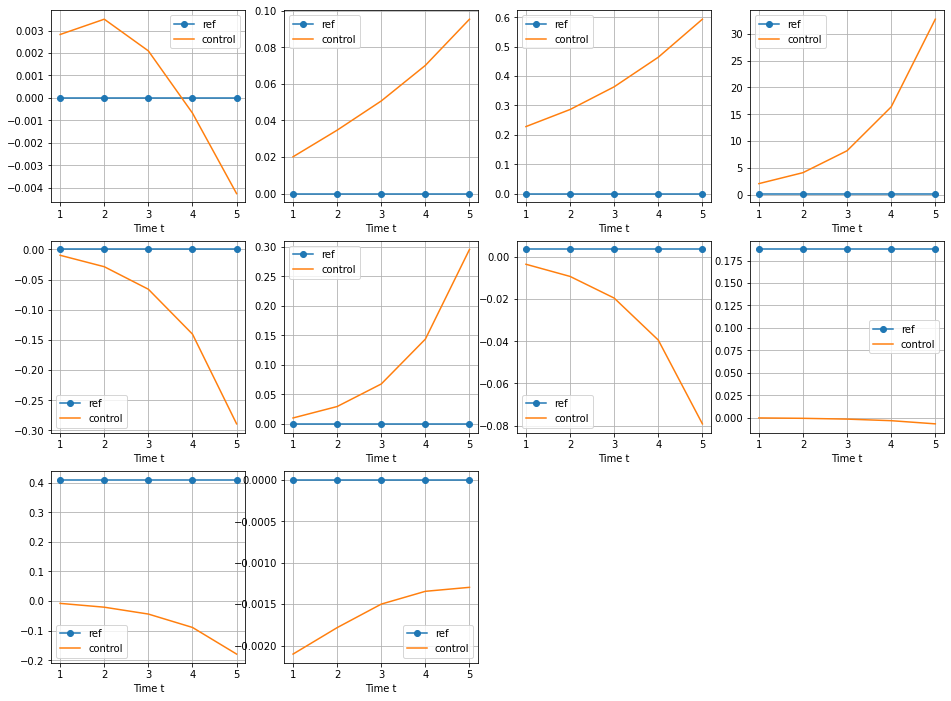

9.147559617656169 [-8.04257077 -3.96709894  4.19374849] [0.85717037 0.41779331]
Point 12 ,Step 4 - MSE error in lifted space,state x, input u:


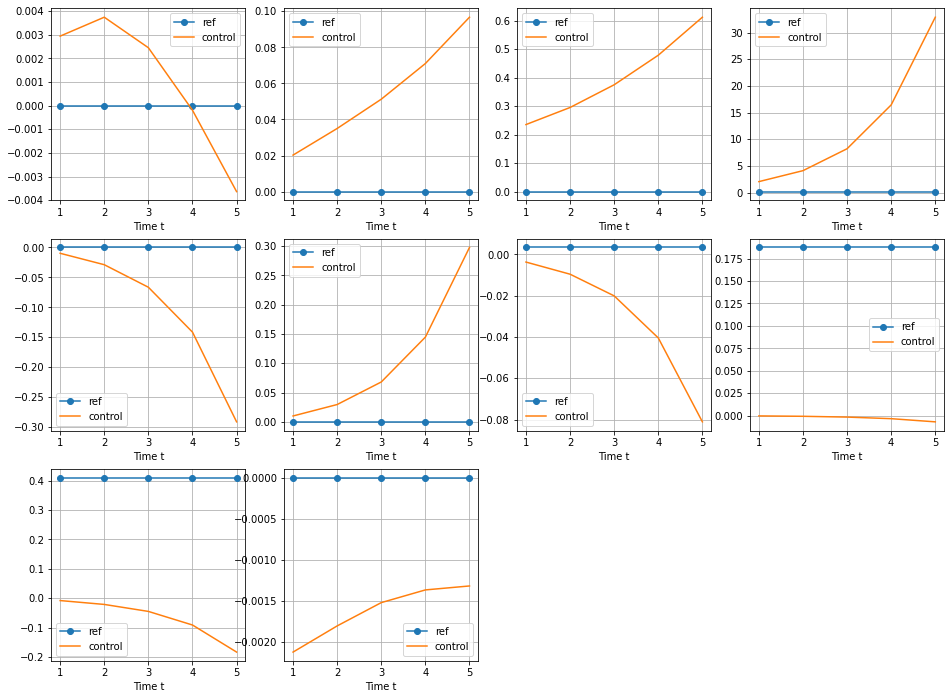

9.218685676287826 [-8.08531644 -4.04199173  4.2362803 ] [0.86232951 0.42531803]
Point 12 ,Step 5 - MSE error in lifted space,state x, input u:
9.288364785512638 [-8.12507284 -4.1190876   4.27957333] [0.8674298  0.43293037]
Point 12 ,Step 6 - MSE error in lifted space,state x, input u:
9.356447014581434 [-8.16166661 -4.1982892   4.32363583] [0.87246763 0.44062497]
Point 12 ,Step 7 - MSE error in lifted space,state x, input u:
9.422778395116314 [-8.19492446 -4.27948548  4.36847512] [0.87743496 0.44839289]
Point 12 ,Step 8 - MSE error in lifted space,state x, input u:
9.487201101407058 [-8.22467409 -4.362551    4.41409747] [0.88232194 0.45622354]
Point 12 ,Step 9 - MSE error in lifted space,state x, input u:
9.549626496652602 [-8.25077569 -4.44744382  4.46071549] [0.88814891 0.46618022]
Point 12 ,Step 10 - MSE error in lifted space,state x, input u:
9.609911257492774 [-8.27305016 -4.53407271  4.50843514] [0.89446724 0.47719643]
Point 12 ,Step 11 - MSE error in lifted space,state x, input 

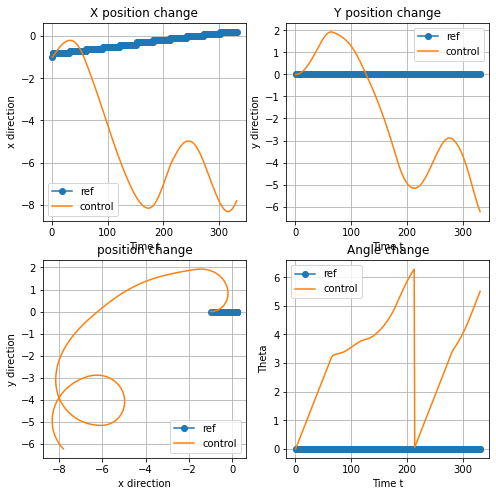

Point 13 ,Step 1 - MSE error in lifted space,state x, input u:


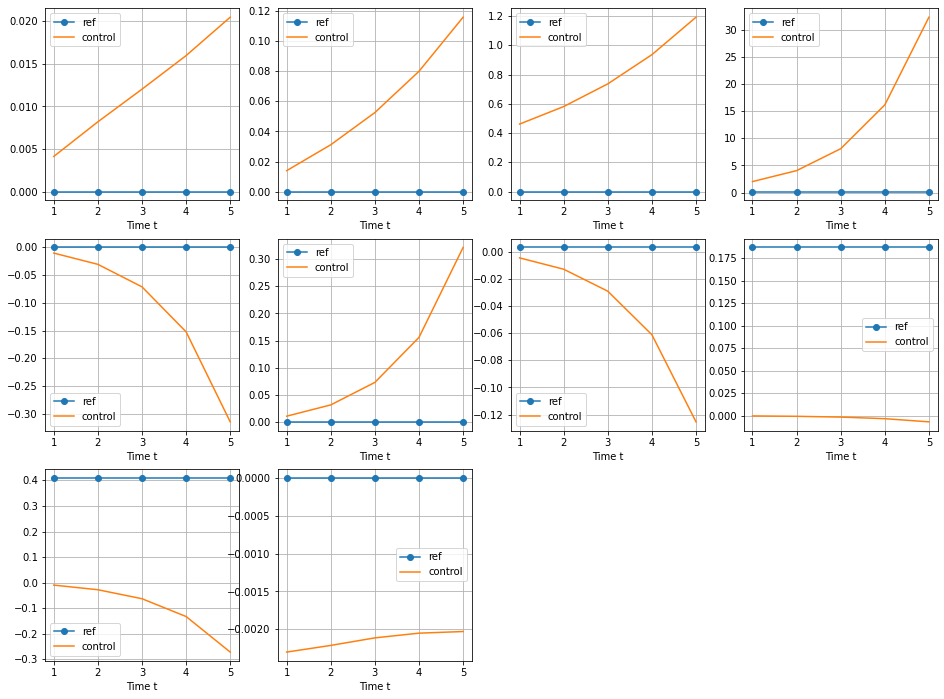

10.207901228704348 [-7.74160993 -6.28758755  5.55730008] [0.8997964 0.5      ]
Point 13 ,Step 2 - MSE error in lifted space,state x, input u:


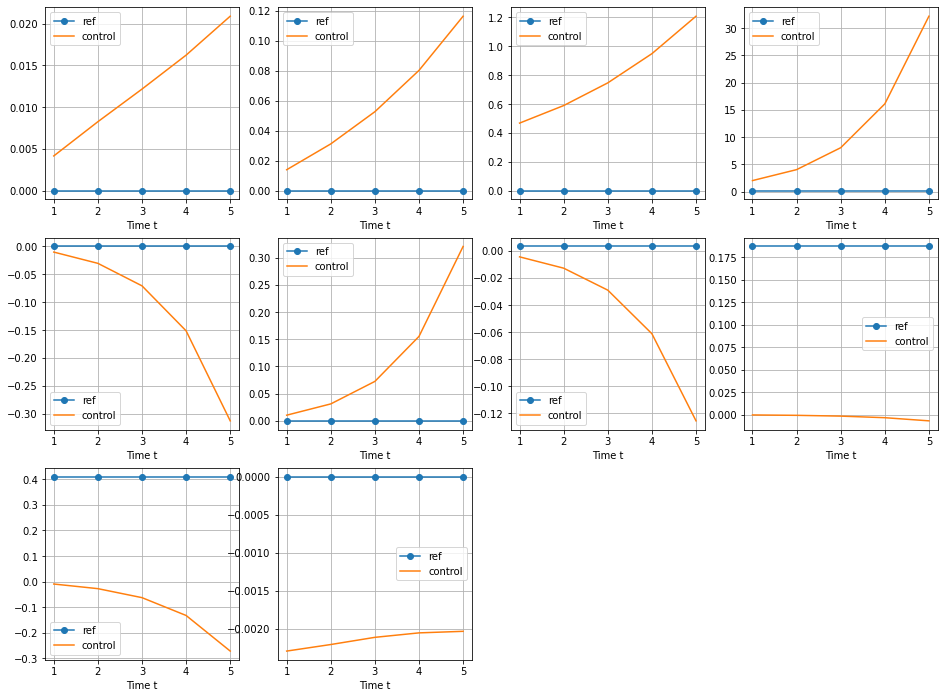

10.192125802810555 [-7.6745995  -6.34706162  5.60730008] [0.89596666 0.5       ]
Point 13 ,Step 3 - MSE error in lifted space,state x, input u:


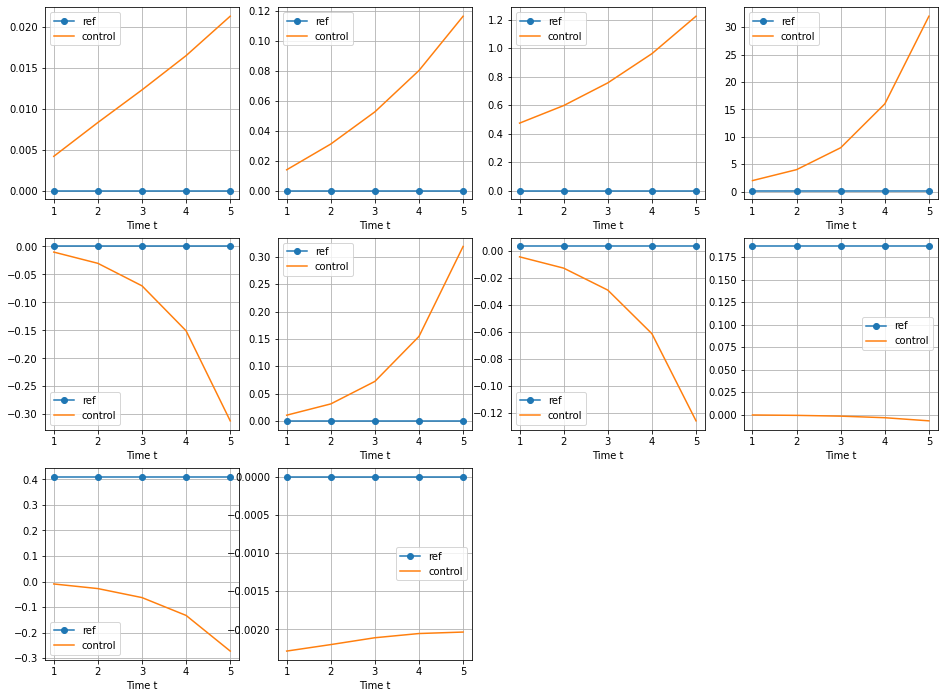

10.172804639751632 [-7.60502887 -6.4028488   5.65730008] [0.89175562 0.5       ]
Point 13 ,Step 4 - MSE error in lifted space,state x, input u:


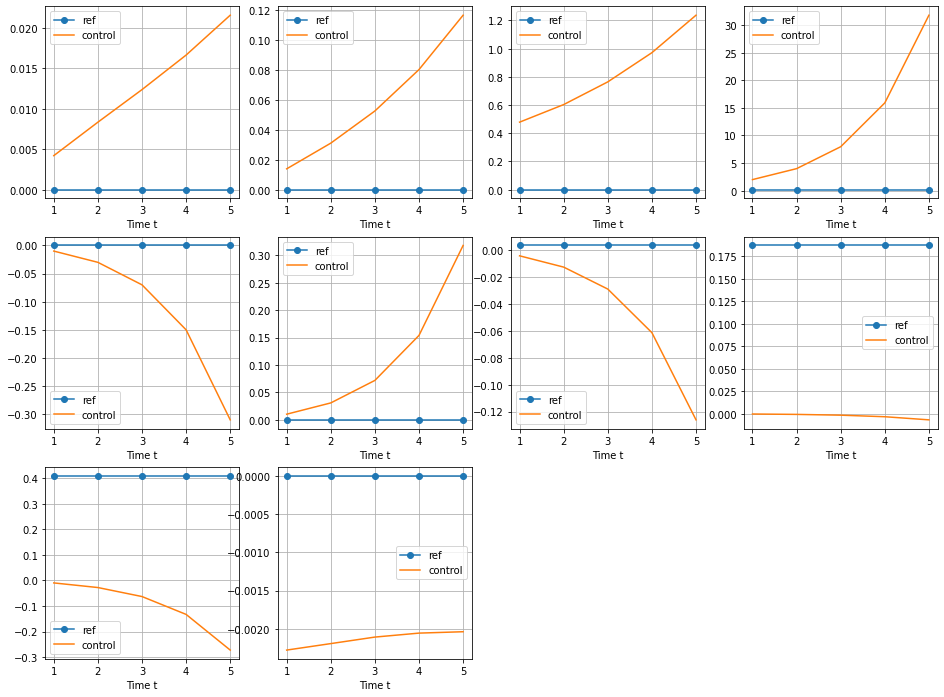

10.150004430106497 [-7.53312508 -6.45482312  5.70730008] [0.88721393 0.5       ]
Point 13 ,Step 5 - MSE error in lifted space,state x, input u:
10.123799810353766 [-7.45911973 -6.50287502  5.75730008] [0.88237049 0.5       ]
Point 13 ,Step 6 - MSE error in lifted space,state x, input u:
10.094273590817659 [-7.38324971 -6.54691021  5.80692863] [0.8772319  0.49628553]
Point 13 ,Step 7 - MSE error in lifted space,state x, input u:
10.061545759688261 [-7.30576882 -6.58687967  5.85603095] [0.8718283  0.49102321]
Point 13 ,Step 8 - MSE error in lifted space,state x, input u:
10.025753622028137 [-7.22693398 -6.62276381  5.90453767] [0.86617569 0.48506719]
Point 13 ,Step 9 - MSE error in lifted space,state x, input u:
9.987043109934861 [-7.14699826 -6.65456588  5.95240535] [0.86029595 0.47867678]
Point 13 ,Step 10 - MSE error in lifted space,state x, input u:
9.945565437168906 [-7.06620784 -6.68230903  5.99959975] [0.85421163 0.47194405]
Point 13 ,Step 11 - MSE error in lifted space,state x, i

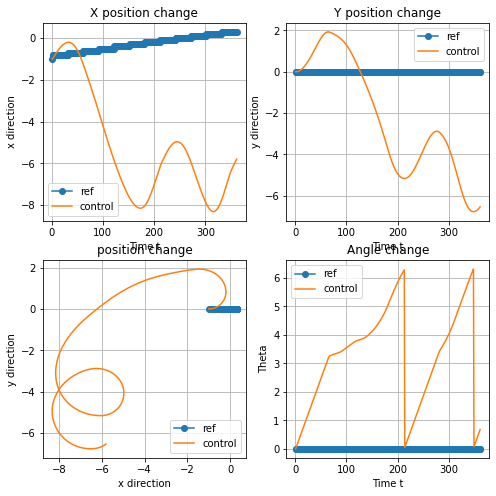

Point 14 ,Step 1 - MSE error in lifted space,state x, input u:


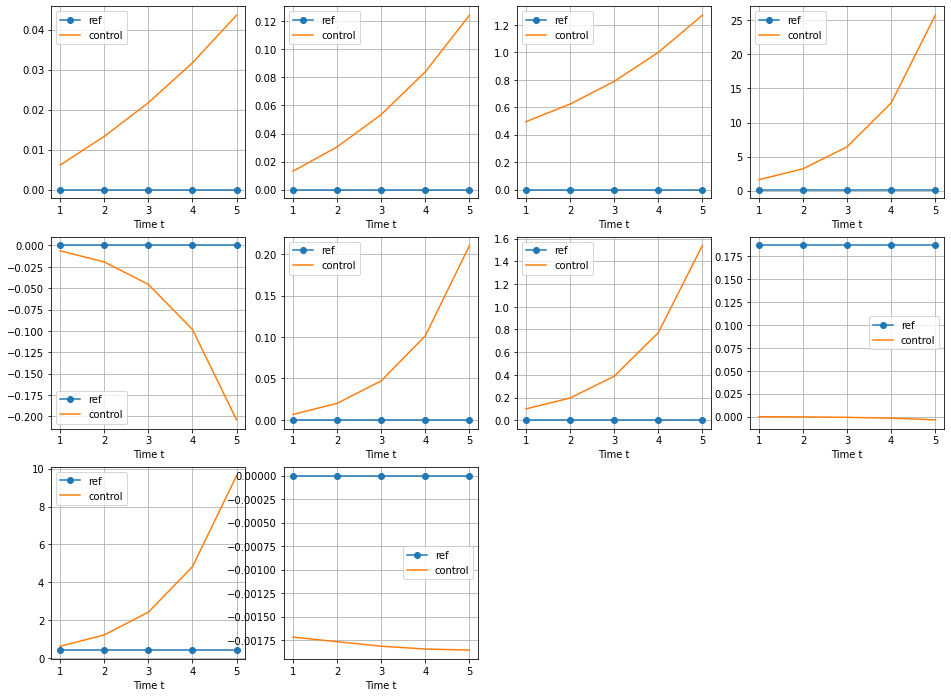

8.95816657257894 [-5.76225509 -6.50195052  0.72628975] [0.56461598 0.5       ]
Point 14 ,Step 2 - MSE error in lifted space,state x, input u:


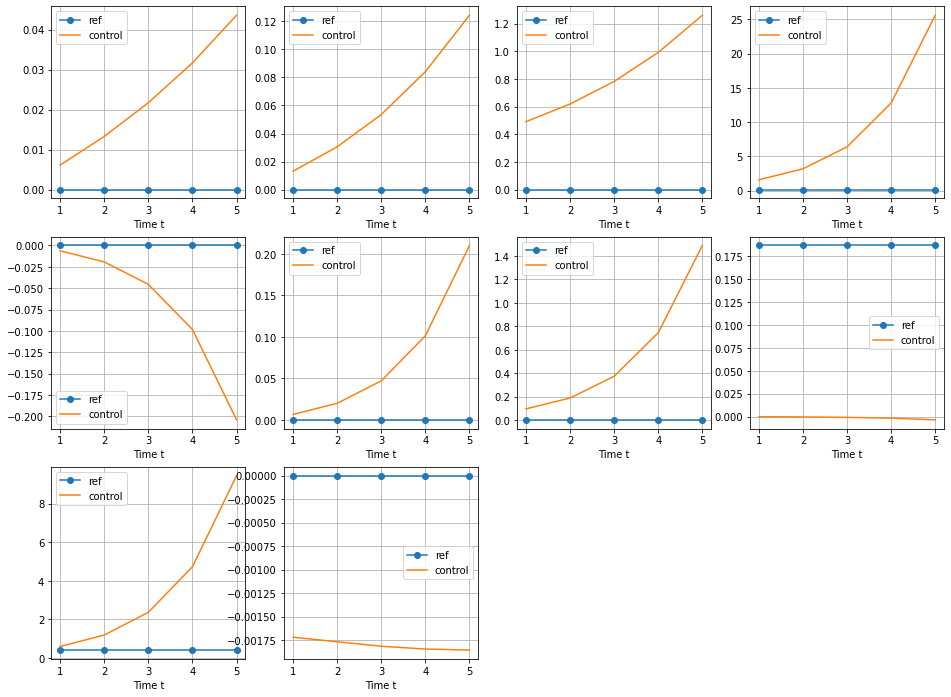

8.901926692135156 [-5.72005102 -6.46446242  0.77628975] [0.56449458 0.5       ]
Point 14 ,Step 3 - MSE error in lifted space,state x, input u:


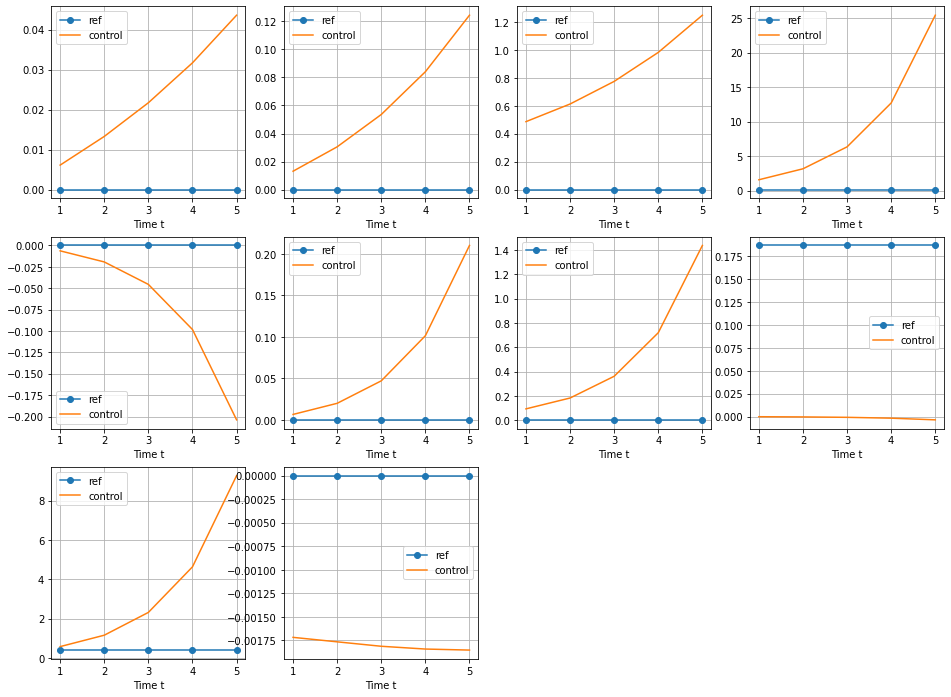

8.845521155087262 [-5.6797777  -6.42491616  0.82628975] [0.56443308 0.5       ]
Point 14 ,Step 4 - MSE error in lifted space,state x, input u:


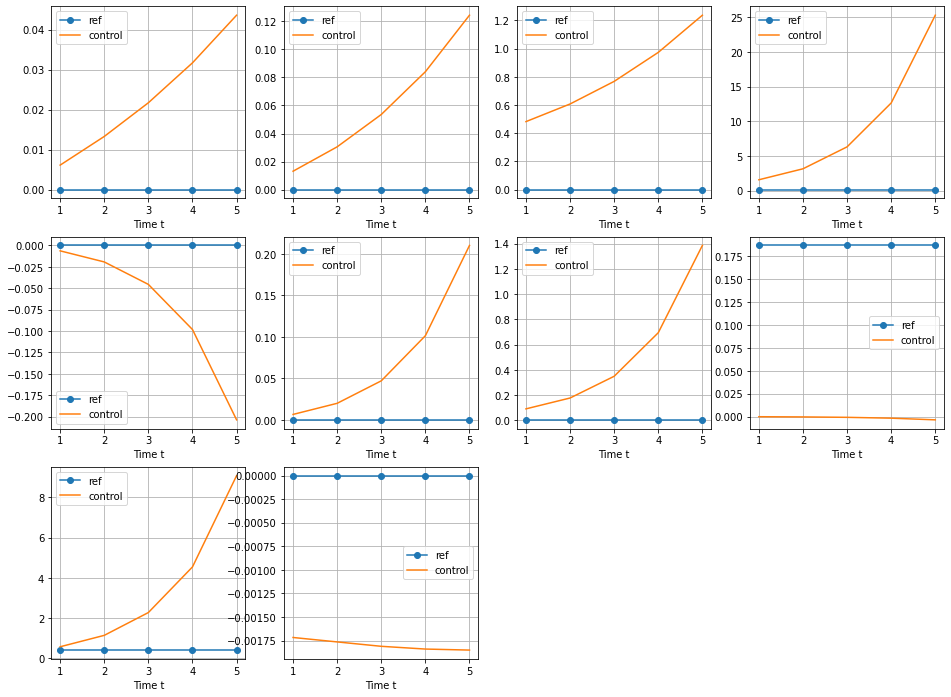

8.789078516169221 [-5.64152826 -6.38340328  0.87628975] [0.56447662 0.5       ]
Point 14 ,Step 5 - MSE error in lifted space,state x, input u:
8.732728126002044 [-5.60539061 -6.34001767  0.92628975] [0.56464506 0.5       ]
Point 14 ,Step 6 - MSE error in lifted space,state x, input u:
8.676600983422855 [-5.57144825 -6.29485587  0.97628975] [0.5649489 0.5      ]
Point 14 ,Step 7 - MSE error in lifted space,state x, input u:
8.620830010953451 [-5.53978047 -6.24801713  1.02628975] [0.56539507 0.5       ]
Point 14 ,Step 8 - MSE error in lifted space,state x, input u:
8.565551490157551 [-5.51046319 -6.1996046   1.07628975] [0.5659749 0.5      ]
Point 14 ,Step 9 - MSE error in lifted space,state x, input u:
8.510905578378509 [-5.48356906 -6.14972591  1.12628975] [0.5666725 0.5      ]
Point 14 ,Step 10 - MSE error in lifted space,state x, input u:
8.457022631122507 [-5.45916099 -6.09848049  1.17628975] [0.56761322 0.5       ]
Point 14 ,Step 11 - MSE error in lifted space,state x, input u:
8.4

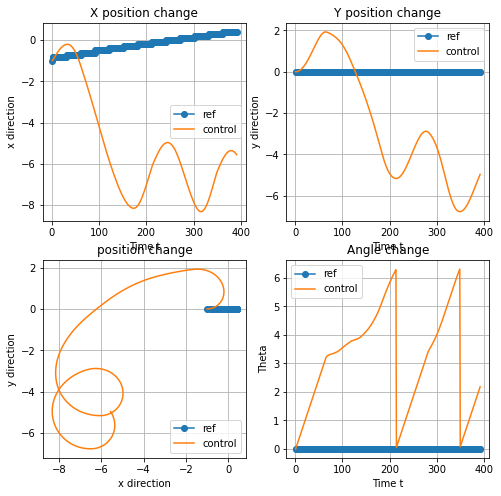

Point 15 ,Step 1 - MSE error in lifted space,state x, input u:


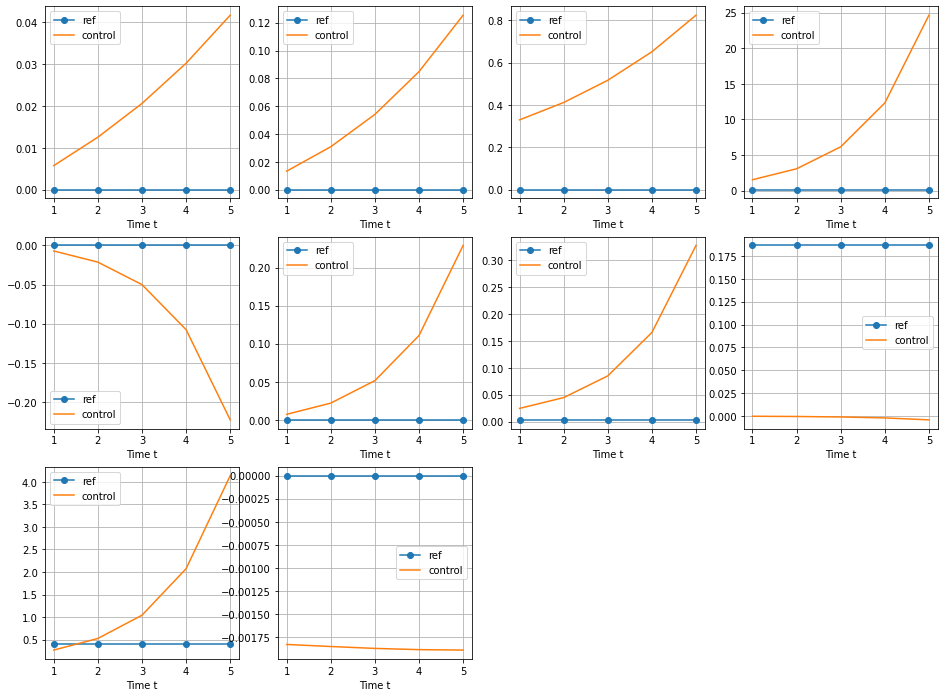

7.831002046428132 [-5.59554643 -4.91618823  2.22628975] [0.628473 0.5     ]
Point 15 ,Step 2 - MSE error in lifted space,state x, input u:


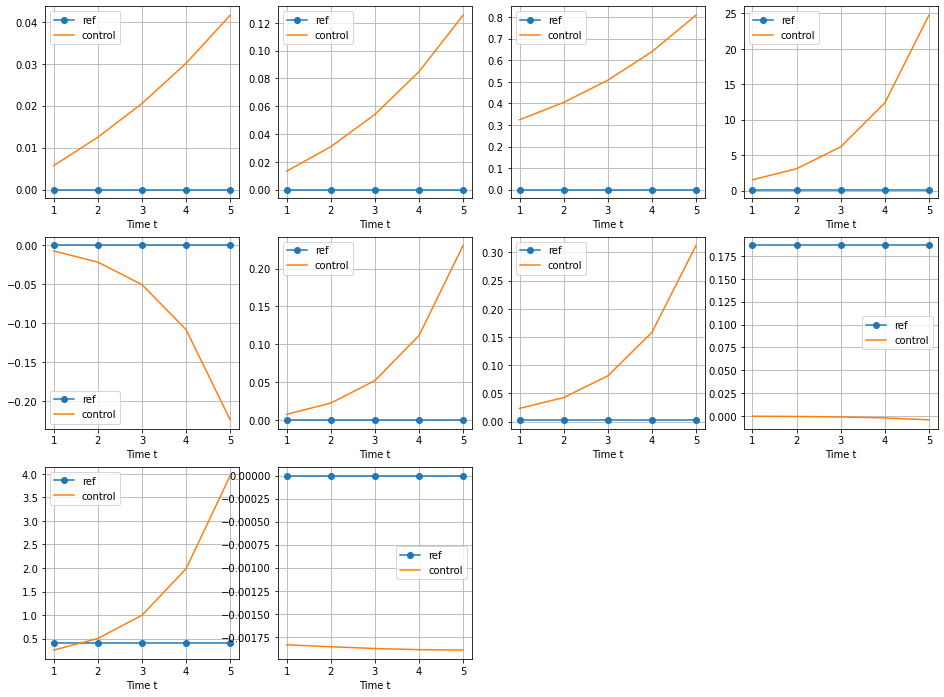

7.829788498676325 [-5.63413682 -4.86599973  2.27628975] [0.63309585 0.5       ]
Point 15 ,Step 3 - MSE error in lifted space,state x, input u:


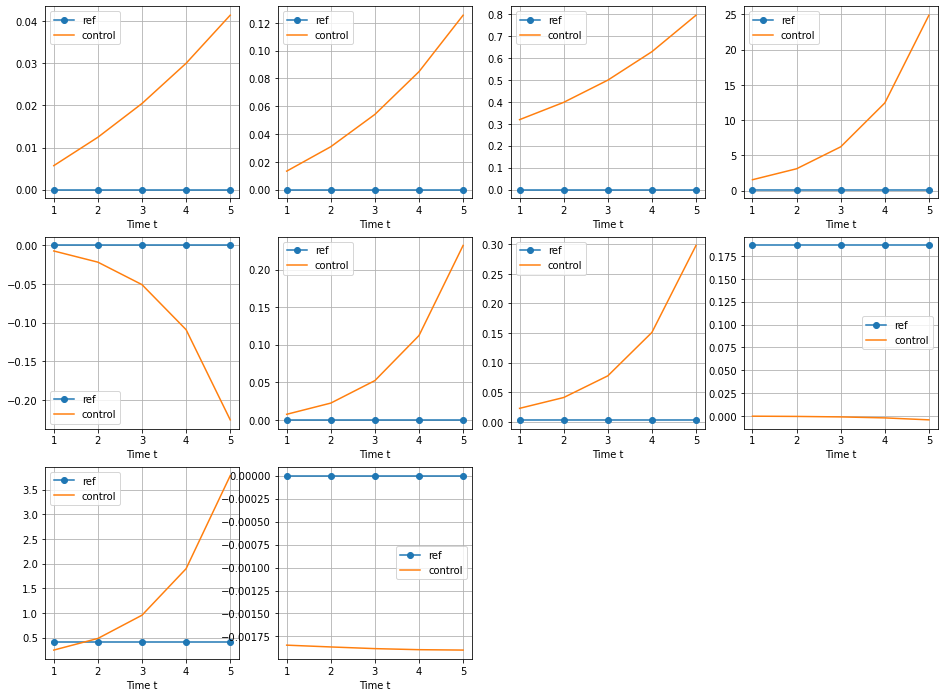

7.83227164609627 [-5.67549335 -4.81744341  2.32628975] [0.63781495 0.5       ]
Point 15 ,Step 4 - MSE error in lifted space,state x, input u:


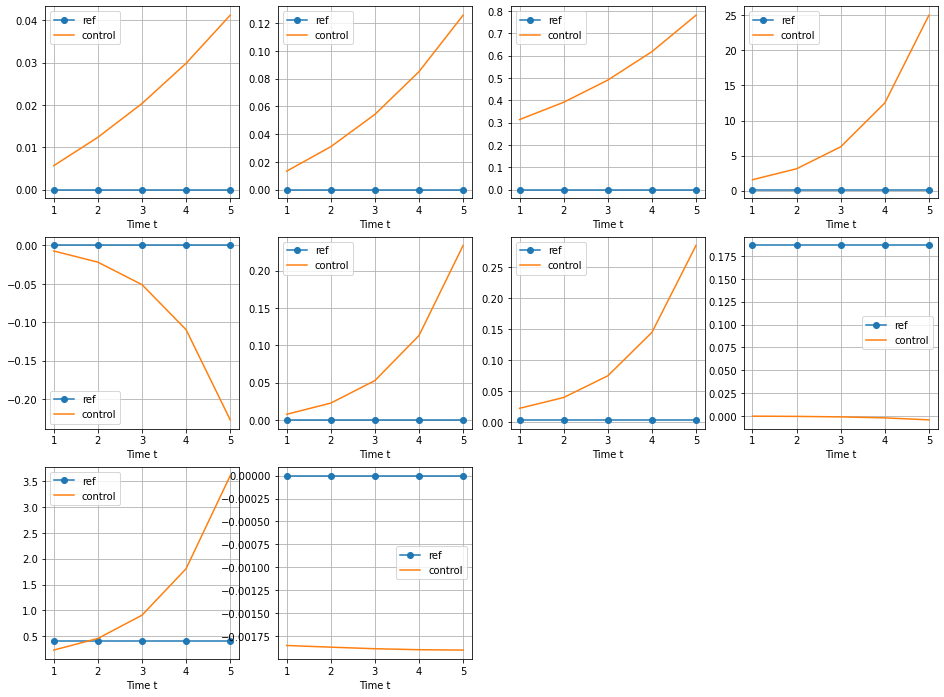

7.838501805816056 [-5.71955825 -4.77066094  2.37628975] [0.64267521 0.5       ]
Point 15 ,Step 5 - MSE error in lifted space,state x, input u:
7.848524362591681 [-5.76630058 -4.72576044  2.42628975] [0.6481435 0.5      ]
Point 15 ,Step 6 - MSE error in lifted space,state x, input u:
7.862374883215383 [-5.81566821 -4.68287025  2.47628975] [0.65396729 0.5       ]
Point 15 ,Step 7 - MSE error in lifted space,state x, input u:
7.880076181868282 [-5.86759417 -4.64212722  2.52628975] [0.66002269 0.5       ]
Point 15 ,Step 8 - MSE error in lifted space,state x, input u:
7.9016376160559885 [-5.92200112 -4.60367012  2.57628975] [0.66626309 0.5       ]
Point 15 ,Step 9 - MSE error in lifted space,state x, input u:
7.927055440574525 [-5.97880441 -4.5676363   2.62628975] [0.67268488 0.5       ]
Point 15 ,Step 10 - MSE error in lifted space,state x, input u:
7.956342950702268 [-6.03797269 -4.53412684  2.67628975] [0.67998305 0.5       ]
Point 15 ,Step 11 - MSE error in lifted space,state x, input u

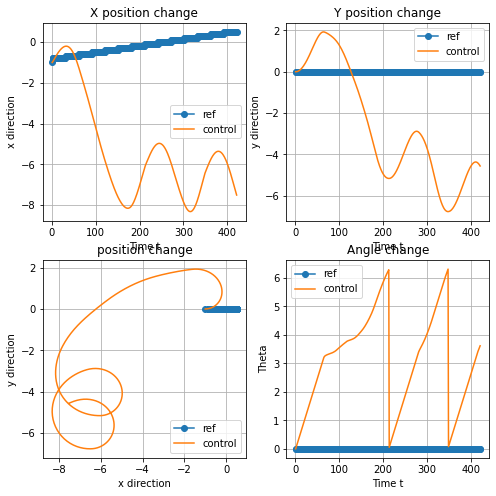

Point 16 ,Step 1 - MSE error in lifted space,state x, input u:


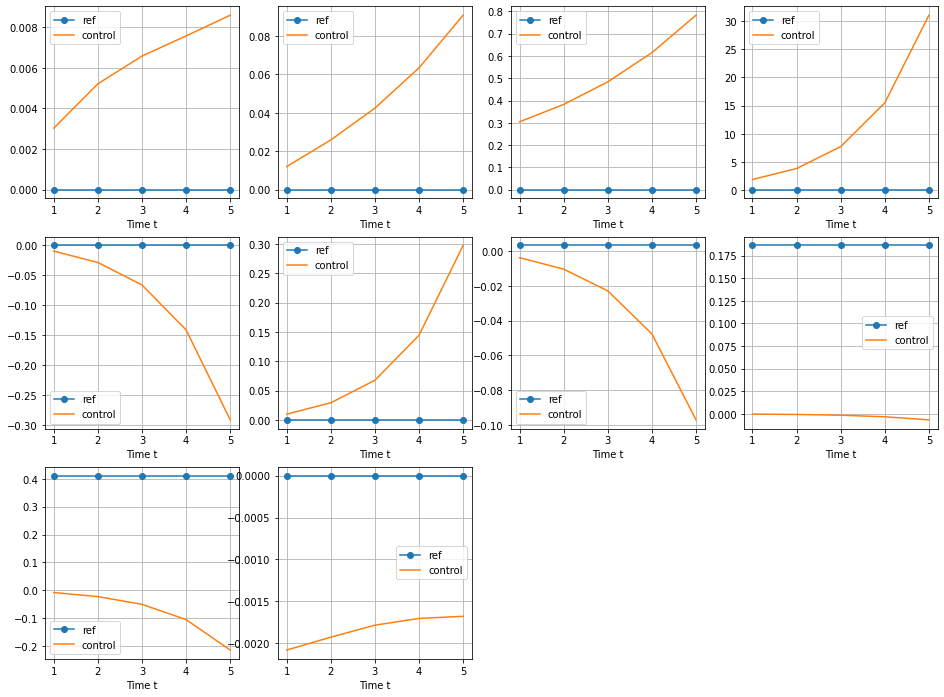

9.386445837109754 [-7.5820329  -4.59996773  3.65861911] [0.84068985 0.42333833]
Point 16 ,Step 2 - MSE error in lifted space,state x, input u:


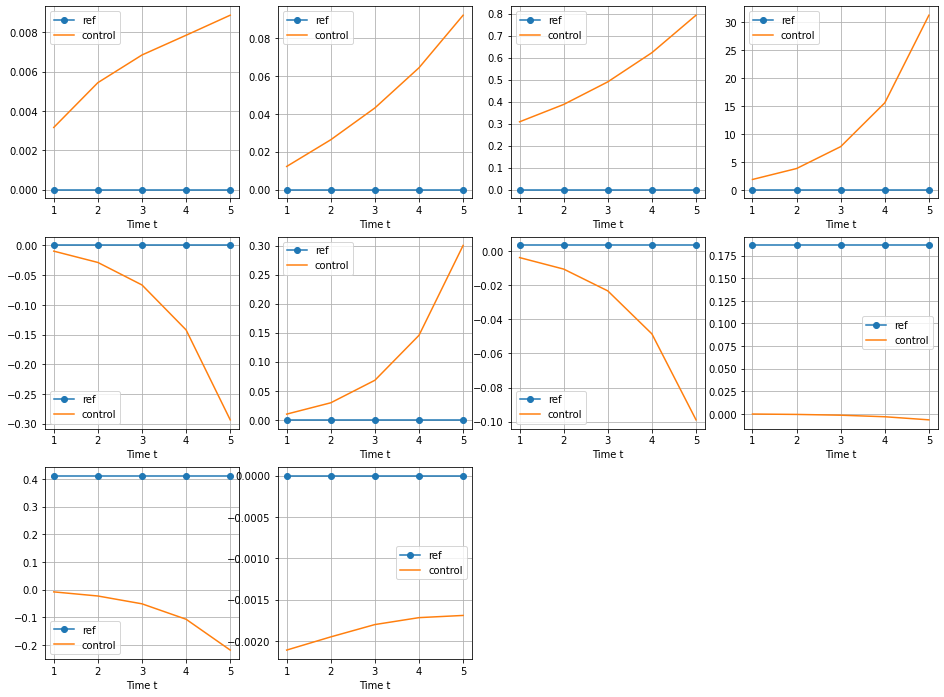

9.47125624097983 [-7.65575884 -4.64188979  3.70189345] [0.84811397 0.43274334]
Point 16 ,Step 3 - MSE error in lifted space,state x, input u:


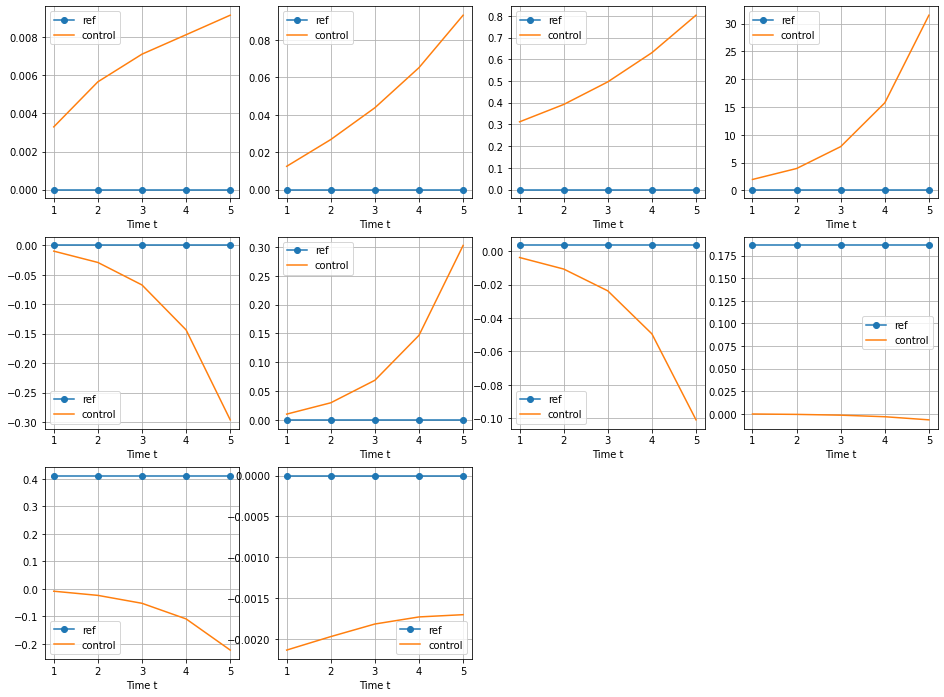

9.556700891113136 [-7.72822163 -4.68735067  3.74610709] [0.85542674 0.44213647]
Point 16 ,Step 4 - MSE error in lifted space,state x, input u:


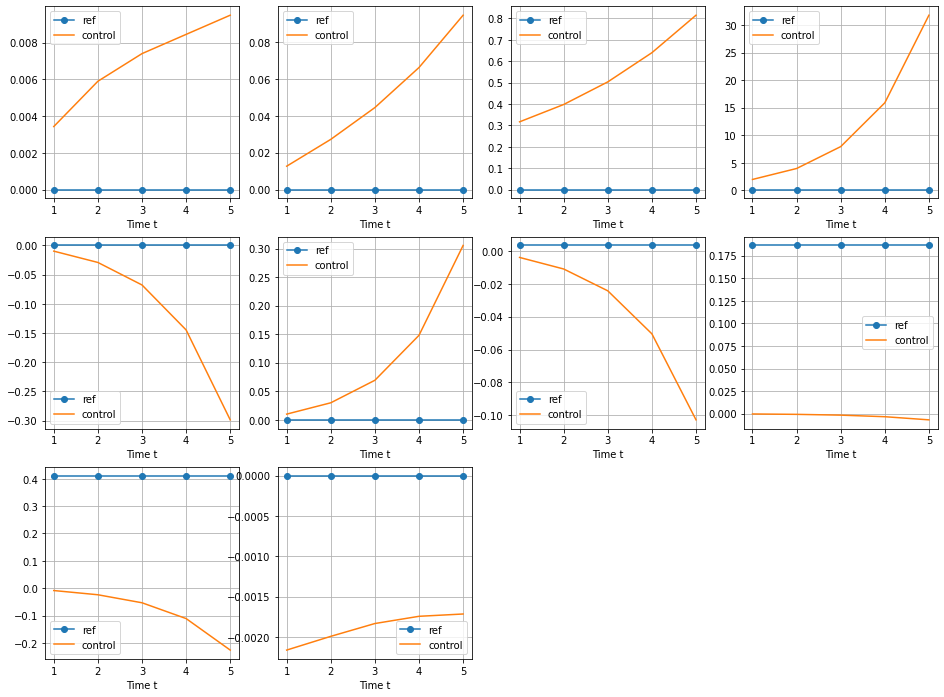

9.64260466655896 [-7.79919807 -4.73638011  3.7912566 ] [0.86264362 0.45149509]
Point 16 ,Step 5 - MSE error in lifted space,state x, input u:
9.728781993191173 [-7.86845569 -4.78899335  3.83733614] [0.86975691 0.46079532]
Point 16 ,Step 6 - MSE error in lifted space,state x, input u:
9.815035217272724 [-7.93575217 -4.84518847  3.88435035] [0.87673867 0.47014219]
Point 16 ,Step 7 - MSE error in lifted space,state x, input u:
9.901151395009085 [-8.00083317 -4.90494319  3.93235068] [0.883525   0.48000327]
Point 16 ,Step 8 - MSE error in lifted space,state x, input u:
9.986913472609922 [-8.06343966 -4.96822443  3.98128928] [0.89017343 0.48938599]
Point 16 ,Step 9 - MSE error in lifted space,state x, input u:
10.072097455979968 [-8.12331059 -5.03497761  4.03108502] [0.89668923 0.49795743]
Point 16 ,Step 10 - MSE error in lifted space,state x, input u:
10.156466476386425 [-8.18018145 -5.10511752  4.08108502] [0.90298962 0.5       ]
Point 16 ,Step 11 - MSE error in lifted space,state x, input

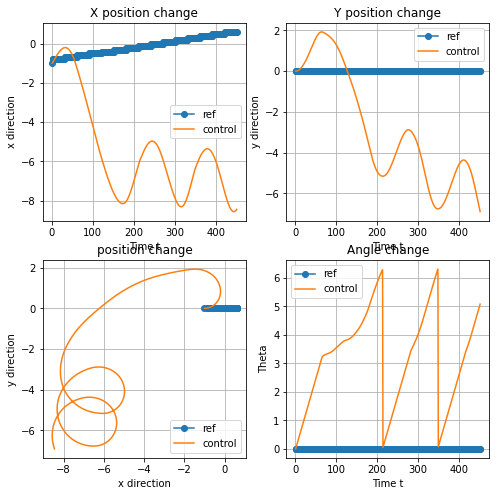

Point 17 ,Step 1 - MSE error in lifted space,state x, input u:


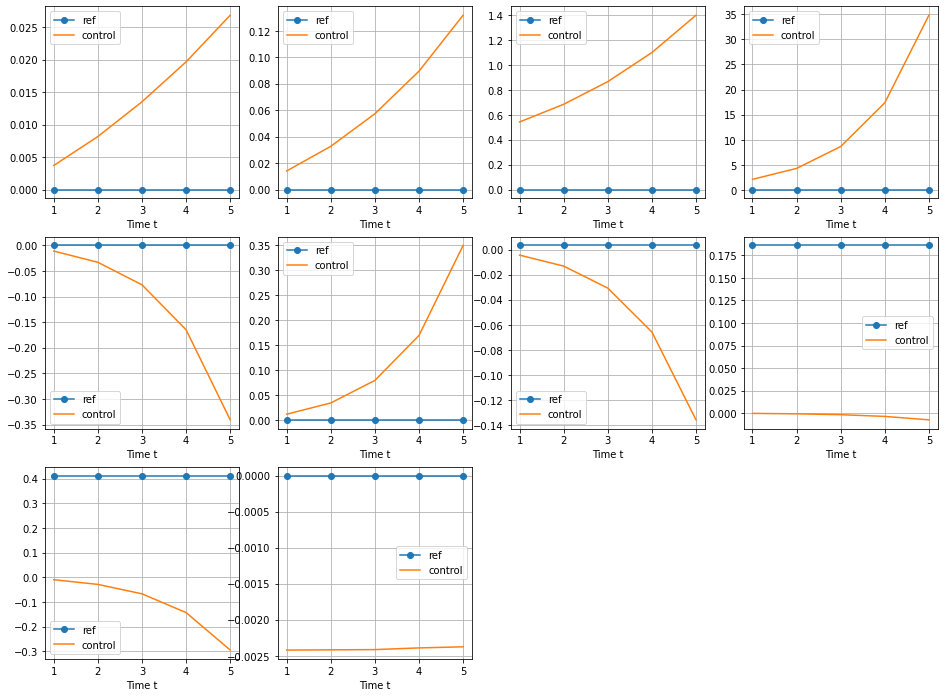

11.490597319614224 [-8.41759728 -6.99308563  5.13108502] [0.97016045 0.5       ]
Point 17 ,Step 2 - MSE error in lifted space,state x, input u:


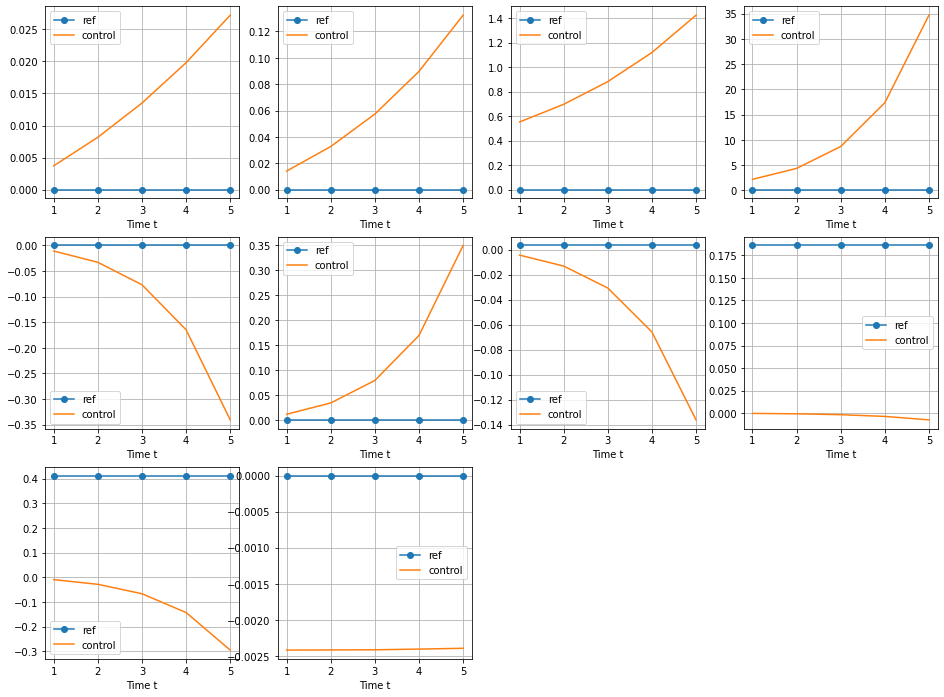

11.513611827040458 [-8.3781822  -7.08165695  5.18108502] [0.96945488 0.5       ]
Point 17 ,Step 3 - MSE error in lifted space,state x, input u:


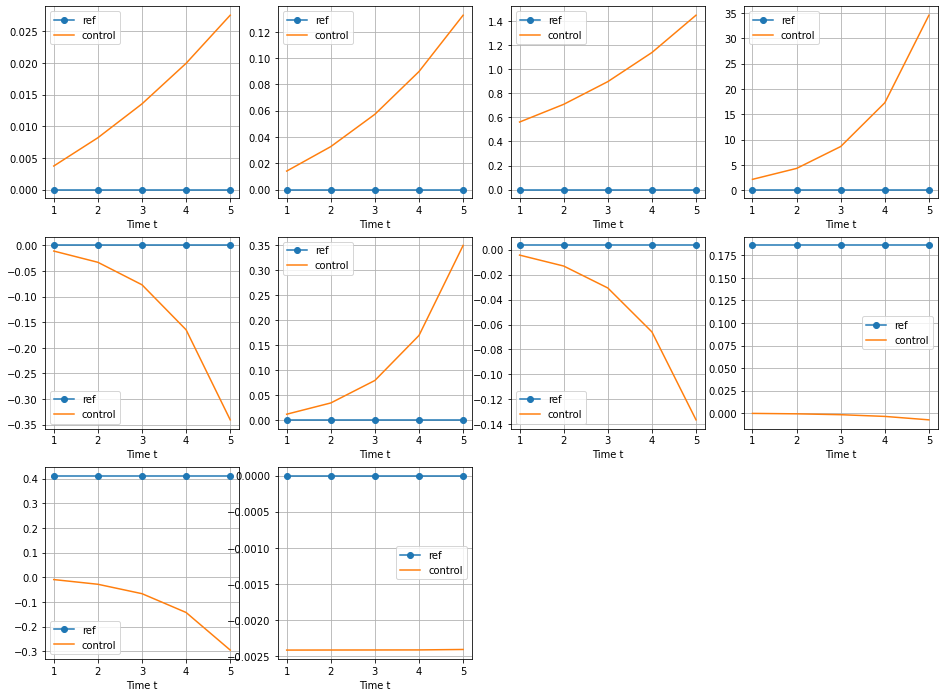

11.532648580211163 [-8.33444375 -7.16804084  5.23108502] [0.96825763 0.5       ]
Point 17 ,Step 4 - MSE error in lifted space,state x, input u:


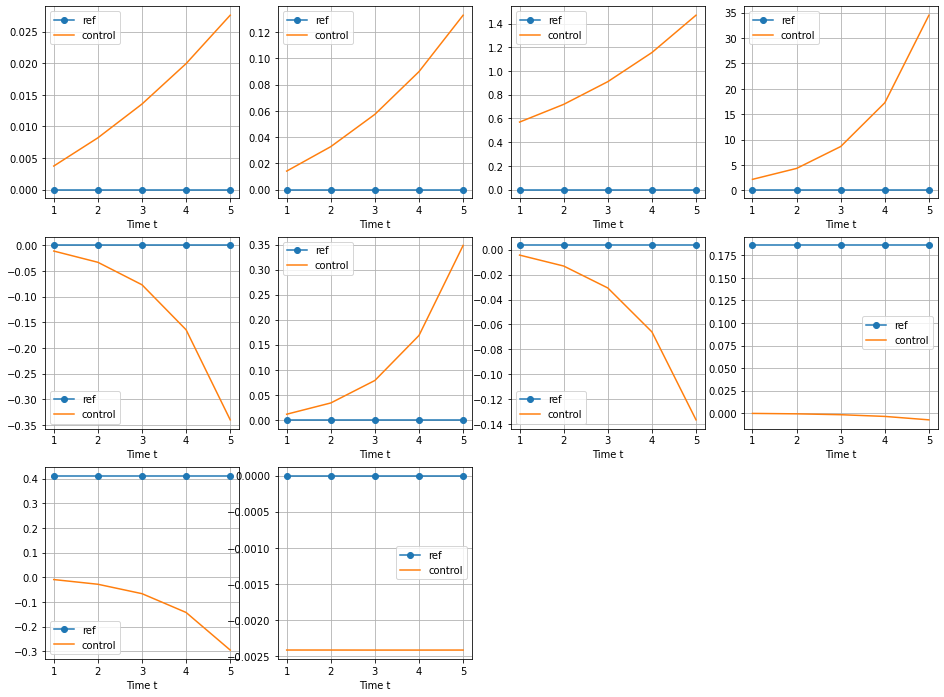

11.547681124155107 [-8.28652473 -7.25198681  5.28108502] [0.96660018 0.5       ]
Point 17 ,Step 5 - MSE error in lifted space,state x, input u:
11.558694718688853 [-8.23458221 -7.33325741  5.33108502] [0.9645173 0.5      ]
Point 17 ,Step 6 - MSE error in lifted space,state x, input u:
11.565685685607598 [-8.17878708 -7.41162771  5.38108502] [0.96202906 0.5       ]
Point 17 ,Step 7 - MSE error in lifted space,state x, input u:
11.568661144036058 [-8.11932193 -7.4868873   5.43108502] [0.95917205 0.5       ]
Point 17 ,Step 8 - MSE error in lifted space,state x, input u:
11.56763843512724 [-8.05638188 -7.55883823  5.48108502] [0.9559491 0.5      ]
Point 17 ,Step 9 - MSE error in lifted space,state x, input u:
11.562645048173996 [-7.99017373 -7.62729579  5.53108502] [0.9523632 0.5      ]
Point 17 ,Step 10 - MSE error in lifted space,state x, input u:
11.553718475955677 [-7.92091453 -7.69208965  5.58108502] [0.94842398 0.5       ]
Point 17 ,Step 11 - MSE error in lifted space,state x, input 

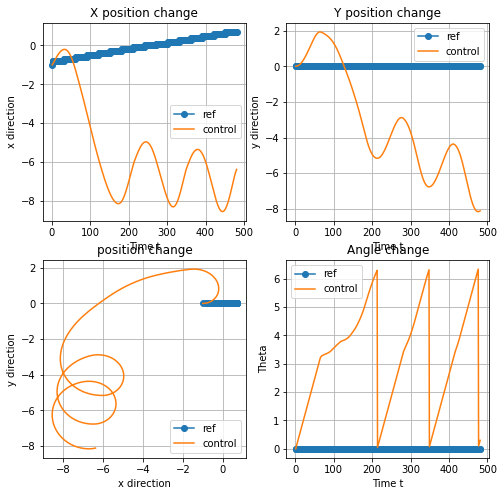

Point 18 ,Step 1 - MSE error in lifted space,state x, input u:


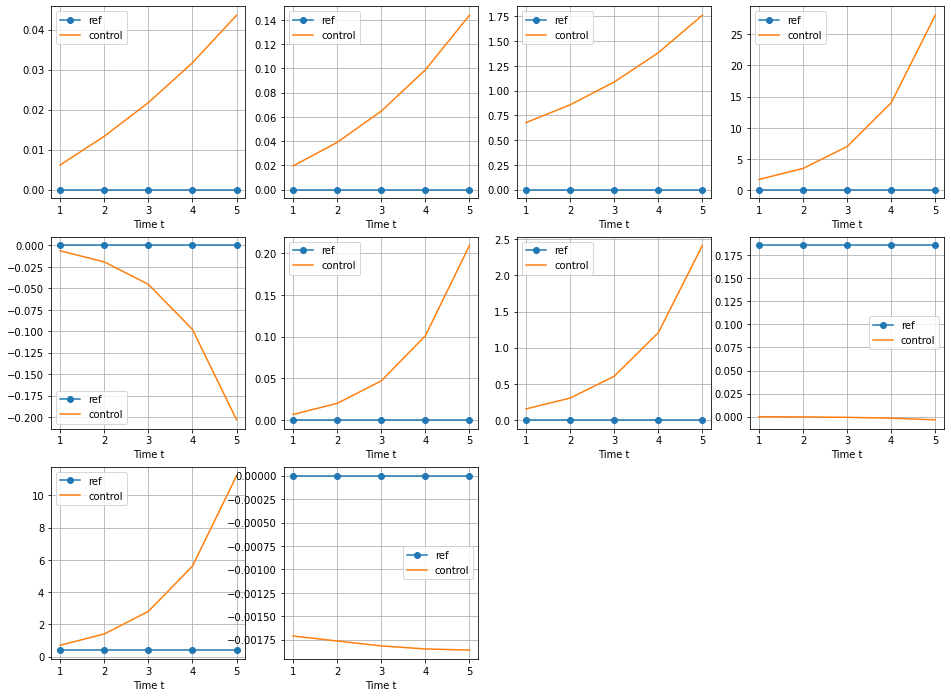

10.794470046175613 [-6.33668169 -8.09866397  0.34789972] [0.56001218 0.5       ]
Point 18 ,Step 2 - MSE error in lifted space,state x, input u:


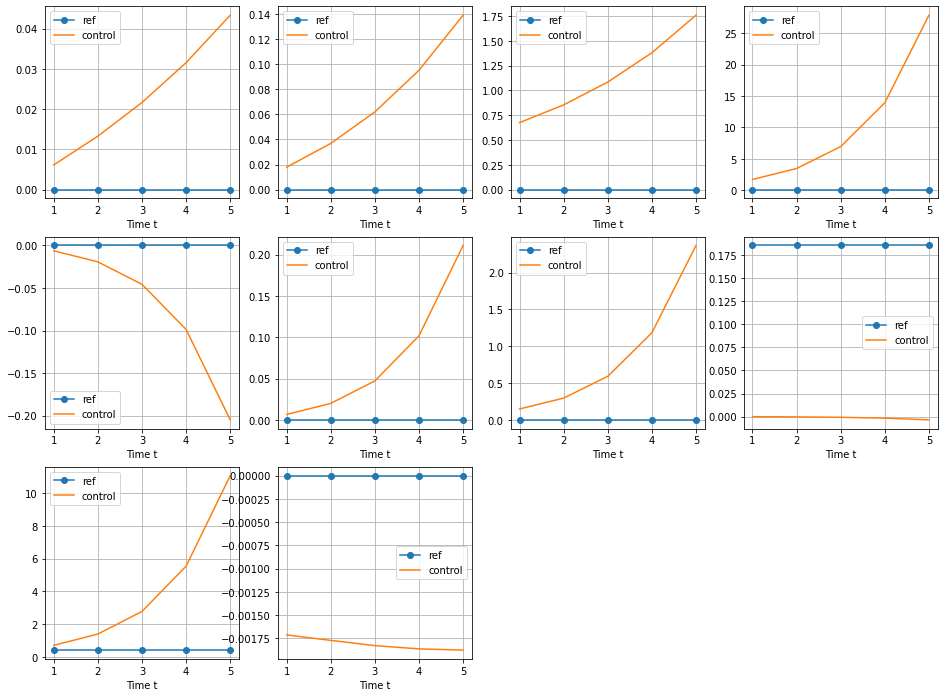

10.745155243772903 [-6.2838019  -8.07948711  0.39789972] [0.56249659 0.5       ]
Point 18 ,Step 3 - MSE error in lifted space,state x, input u:


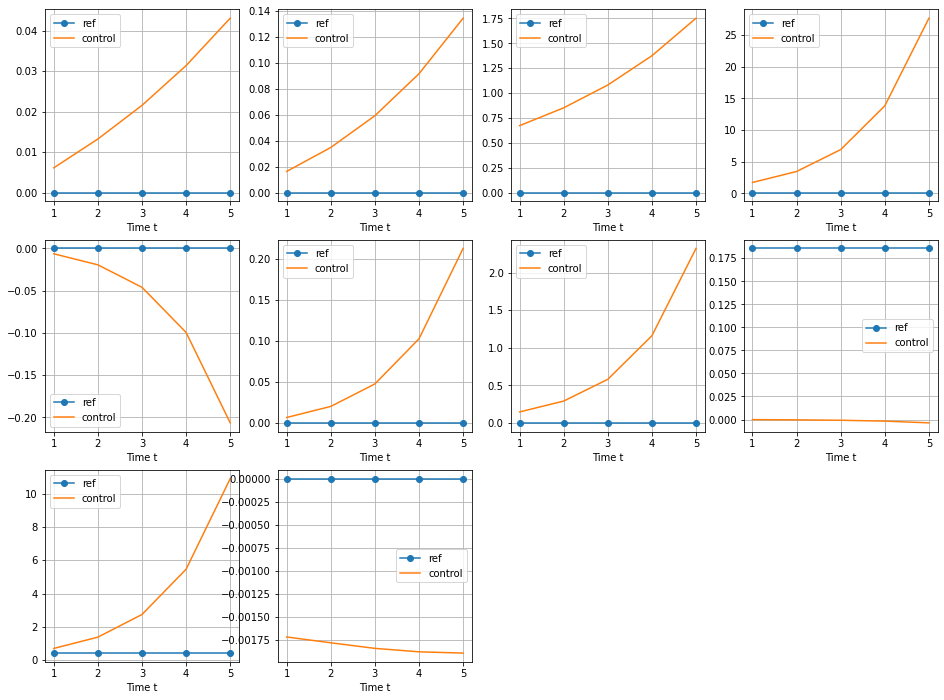

10.694359981367716 [-6.23169097 -8.05758385  0.44789972] [0.56526999 0.5       ]
Point 18 ,Step 4 - MSE error in lifted space,state x, input u:


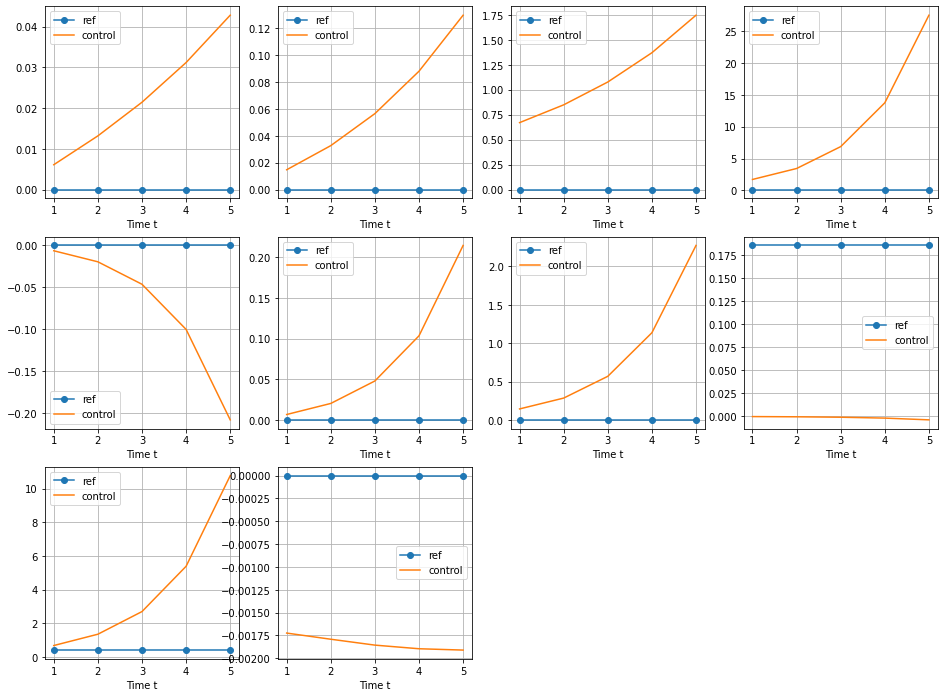

10.64216991319615 [-6.18047692 -8.03297718  0.49789972] [0.56818717 0.5       ]
Point 18 ,Step 5 - MSE error in lifted space,state x, input u:
10.588680066050738 [-6.13029209 -8.00569779  0.54789972] [0.57119896 0.5       ]
Point 18 ,Step 6 - MSE error in lifted space,state x, input u:
10.534198305541196 [-6.08145444 -7.97589611  0.59789972] [0.57212381 0.5       ]
Point 18 ,Step 7 - MSE error in lifted space,state x, input u:
10.478928229206046 [-6.03416199 -7.94368722  0.64789972] [0.5721877 0.5      ]
Point 18 ,Step 8 - MSE error in lifted space,state x, input u:
10.423012154361551 [-5.98854612 -7.90916076  0.69789972] [0.5720913 0.5      ]
Point 18 ,Step 9 - MSE error in lifted space,state x, input u:
10.366564406084567 [-5.94470768 -7.87239327  0.74789972] [0.57215878 0.5       ]
Point 18 ,Step 10 - MSE error in lifted space,state x, input u:
10.309706256863373 [-5.90274765 -7.83346775  0.79789972] [0.57234958 0.5       ]
Point 18 ,Step 11 - MSE error in lifted space,state x, inpu

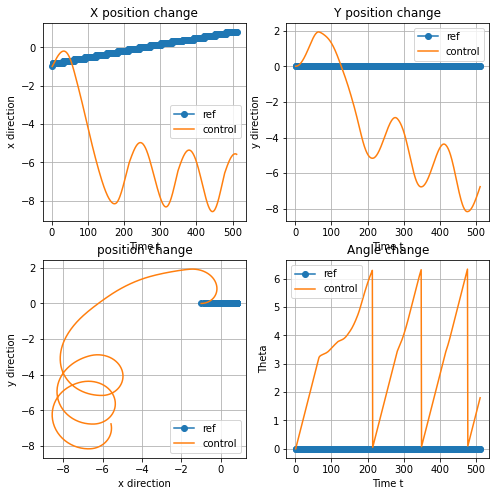

Point 19 ,Step 1 - MSE error in lifted space,state x, input u:


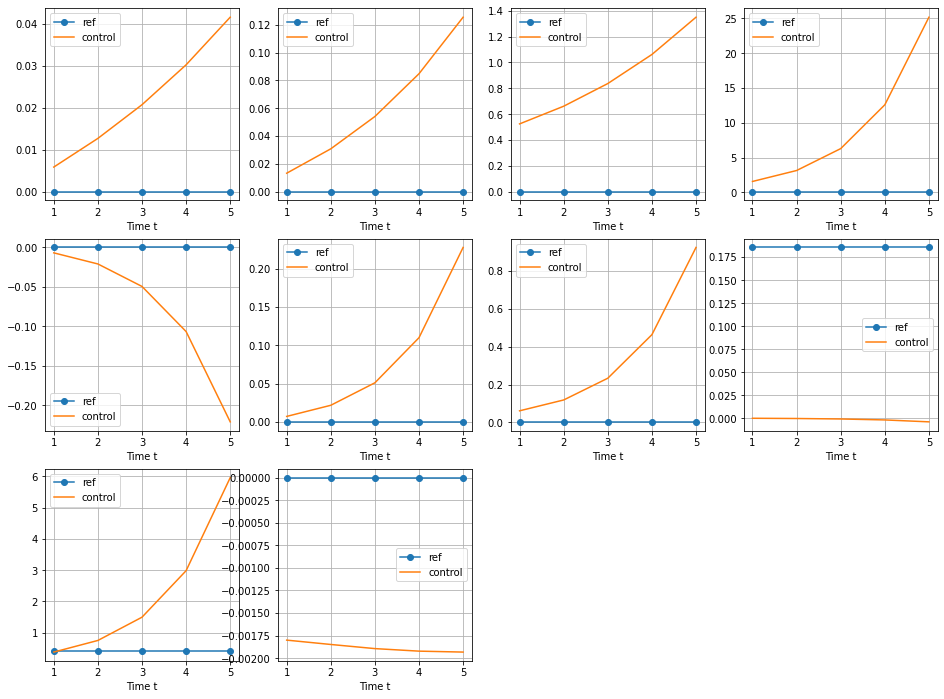

9.328309480978048 [-5.5926828  -6.69794206  1.84789972] [0.61240203 0.5       ]
Point 19 ,Step 2 - MSE error in lifted space,state x, input u:


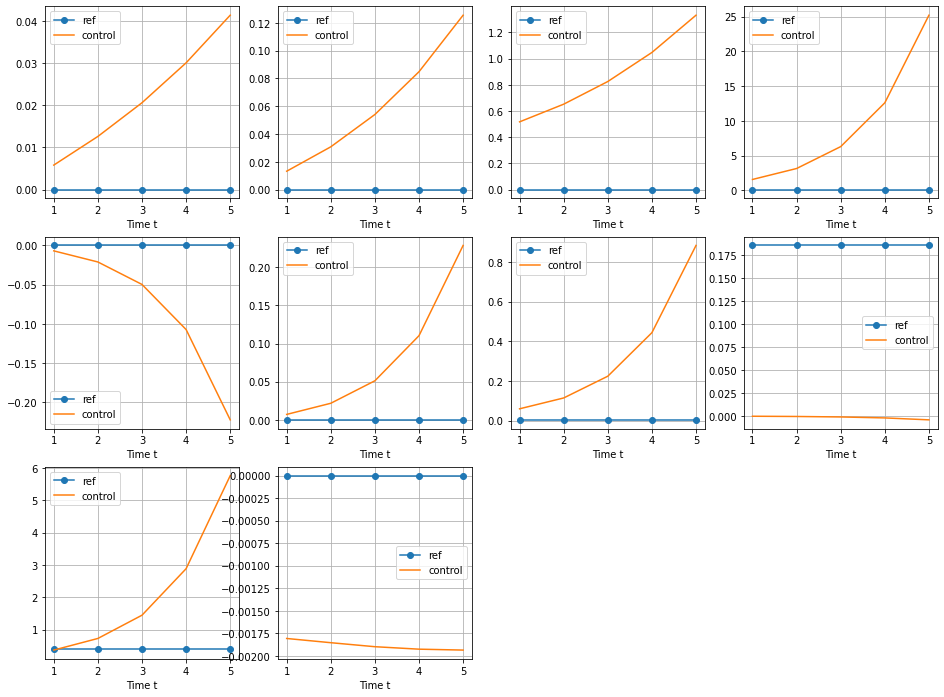

9.297639632589556 [-5.60953984 -6.6386741   1.89789972] [0.61618592 0.5       ]
Point 19 ,Step 3 - MSE error in lifted space,state x, input u:


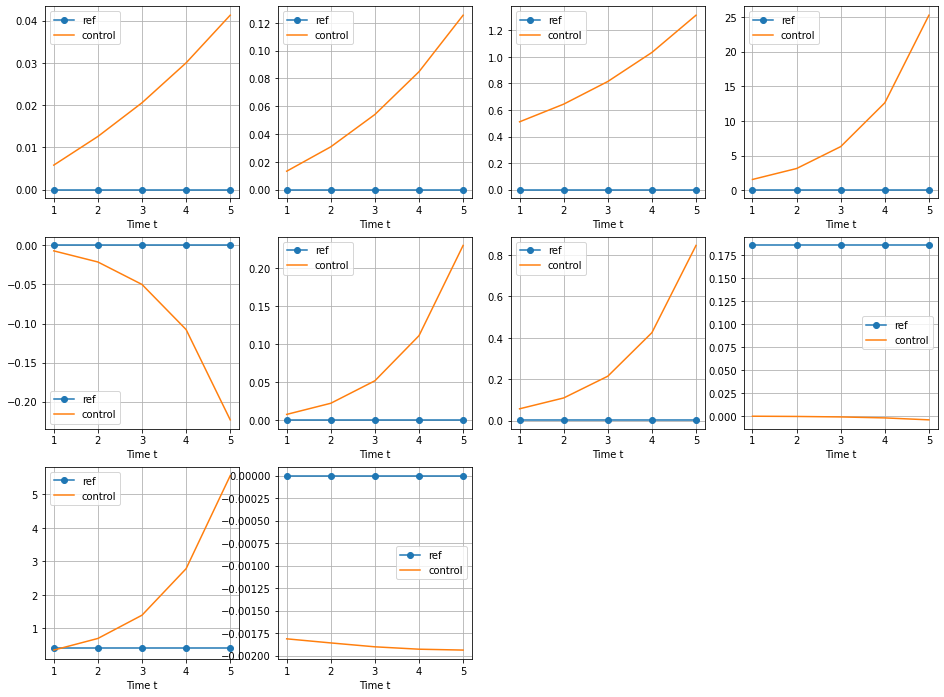

9.269826089164914 [-5.62946335 -6.5799532   1.94789972] [0.62008795 0.5       ]
Point 19 ,Step 4 - MSE error in lifted space,state x, input u:


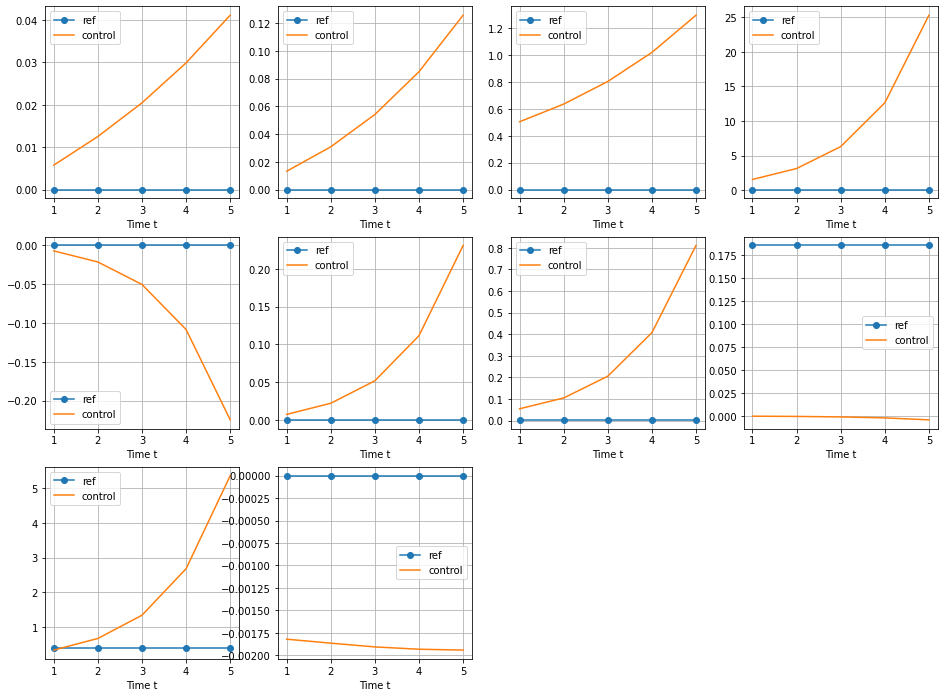

9.245001175191728 [-5.65244618 -6.52192424  1.99789972] [0.62414497 0.5       ]
Point 19 ,Step 5 - MSE error in lifted space,state x, input u:
9.223291119474183 [-5.67847554 -6.46473191  2.04789972] [0.6283702 0.5      ]
Point 19 ,Step 6 - MSE error in lifted space,state x, input u:
9.204815822214869 [-5.70753275 -6.4085213   2.09789972] [0.63276807 0.5       ]
Point 19 ,Step 7 - MSE error in lifted space,state x, input u:
9.189688265998806 [-5.73959298 -6.35343809  2.14789972] [0.63733964 0.5       ]
Point 19 ,Step 8 - MSE error in lifted space,state x, input u:
9.178013806216816 [-5.77462503 -6.29962842  2.19789972] [0.64208451 0.5       ]
Point 19 ,Step 9 - MSE error in lifted space,state x, input u:
9.169885798725632 [-5.81260863 -6.24721466  2.24789972] [0.64729868 0.5       ]
Point 19 ,Step 10 - MSE error in lifted space,state x, input u:
9.165393205320687 [-5.85352567 -6.19631532  2.29789972] [0.65306562 0.5       ]
Point 19 ,Step 11 - MSE error in lifted space,state x, input u:

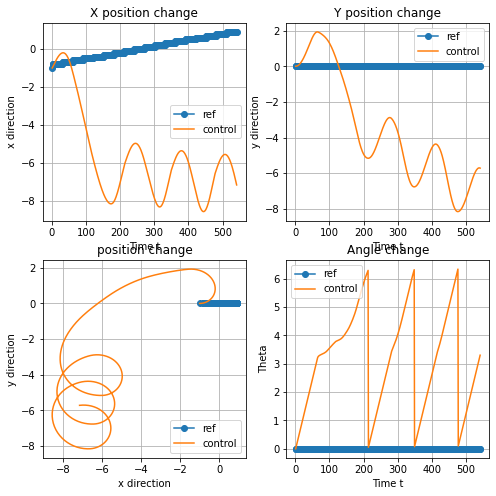

Point 20 ,Step 1 - MSE error in lifted space,state x, input u:


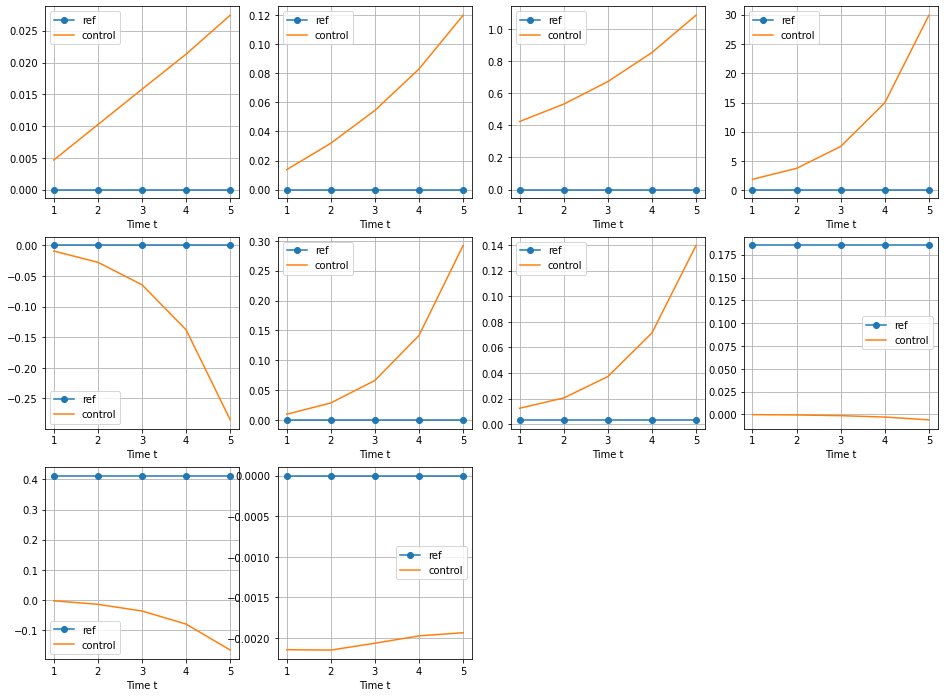

10.036591215072082 [-7.24025207 -5.7298699   3.34789972] [0.81062688 0.5       ]
Point 20 ,Step 2 - MSE error in lifted space,state x, input u:


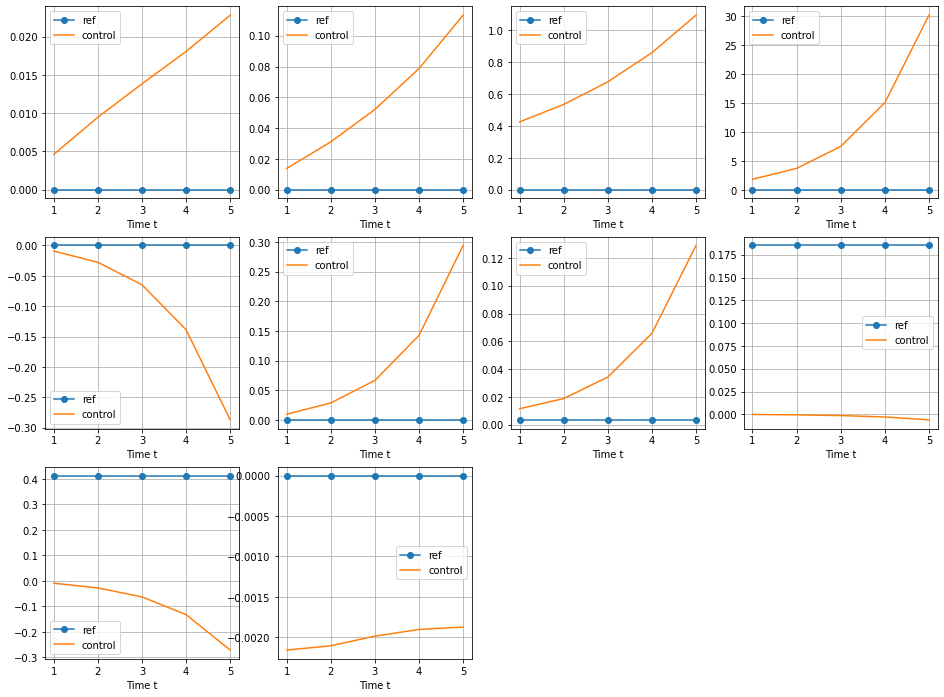

10.112014751871609 [-7.32039333 -5.74664225  3.39789972] [0.81877556 0.5       ]
Point 20 ,Step 3 - MSE error in lifted space,state x, input u:


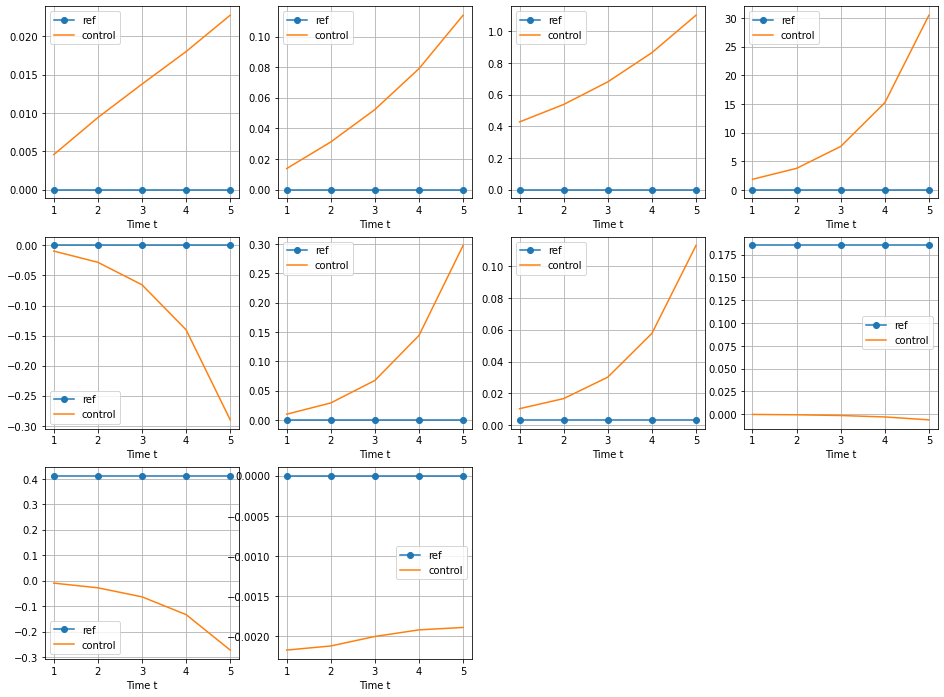

10.189792454648877 [-7.40039135 -5.76760742  3.44789972] [0.82699589 0.5       ]
Point 20 ,Step 4 - MSE error in lifted space,state x, input u:


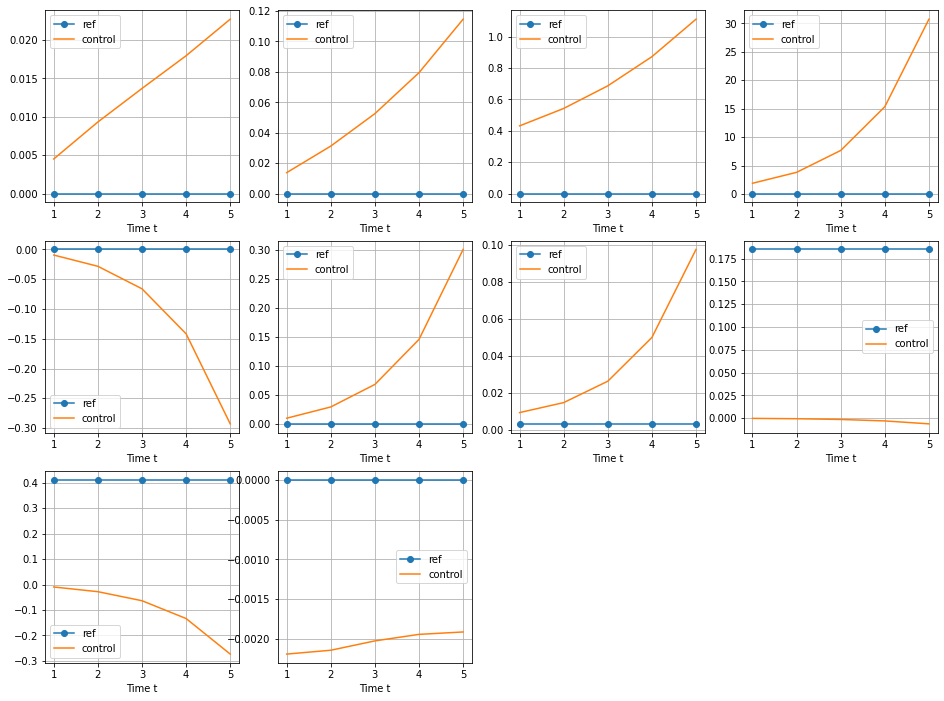

10.269730118653086 [-7.48002932 -5.79279376  3.49789972] [0.83525783 0.5       ]
Point 20 ,Step 5 - MSE error in lifted space,state x, input u:
10.351626622718053 [-7.55908588 -5.82221802  3.54789972] [0.8435477 0.5      ]
Point 20 ,Step 6 - MSE error in lifted space,state x, input u:
10.435232006216333 [-7.6372959  -5.8558677   3.59789972] [0.85141699 0.5       ]
Point 20 ,Step 7 - MSE error in lifted space,state x, input u:
10.52030183006181 [-7.71440468 -5.89371714  3.64789972] [0.85897283 0.5       ]
Point 20 ,Step 8 - MSE error in lifted space,state x, input u:
10.606606090936449 [-7.79017443 -5.935733    3.69789972] [0.86639414 0.5       ]
Point 20 ,Step 9 - MSE error in lifted space,state x, input u:
10.693916558281769 [-7.86437153 -5.98187001  3.74789972] [0.87371806 0.5       ]
Point 20 ,Step 10 - MSE error in lifted space,state x, input u:
10.782000865713064 [-7.93676128 -6.03206768  3.79789972] [0.88091331 0.5       ]
Point 20 ,Step 11 - MSE error in lifted space,state x, in

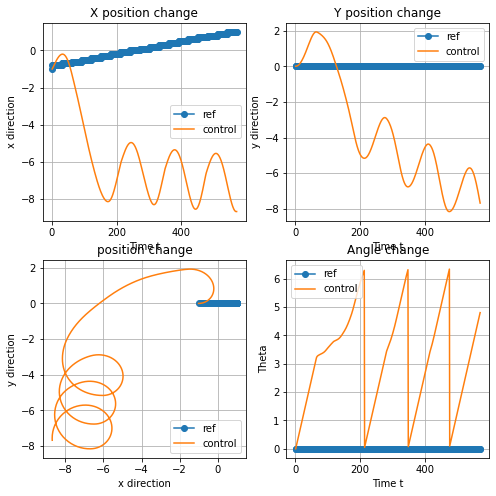

Point 21 ,Step 1 - MSE error in lifted space,state x, input u:


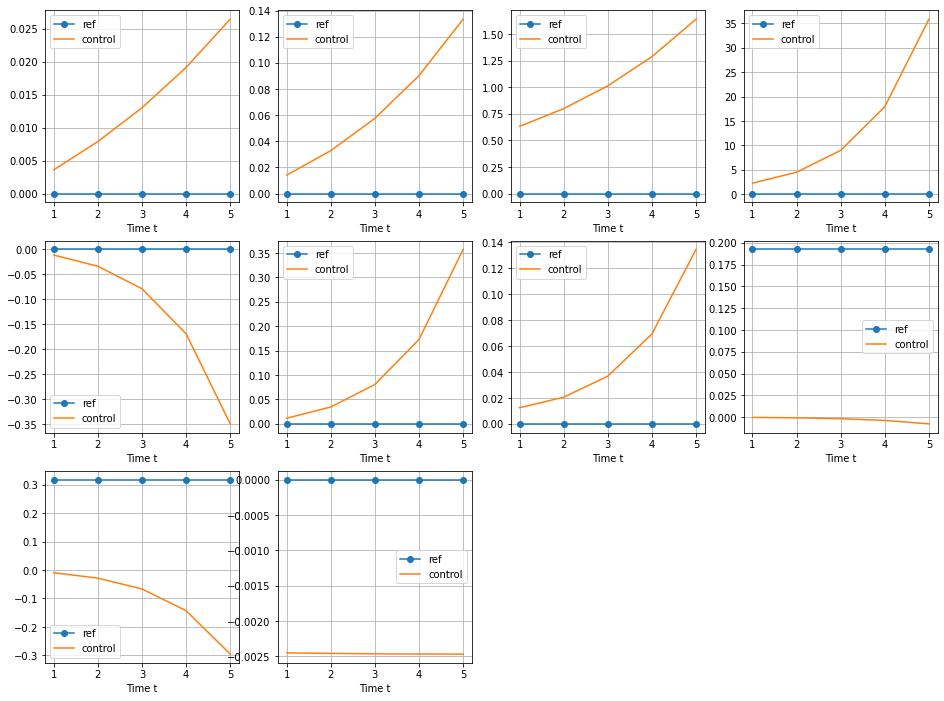

12.559790585395834 [-8.68330474 -7.77624834  4.84789972] [0.98844618 0.5       ]
Point 21 ,Step 2 - MSE error in lifted space,state x, input u:


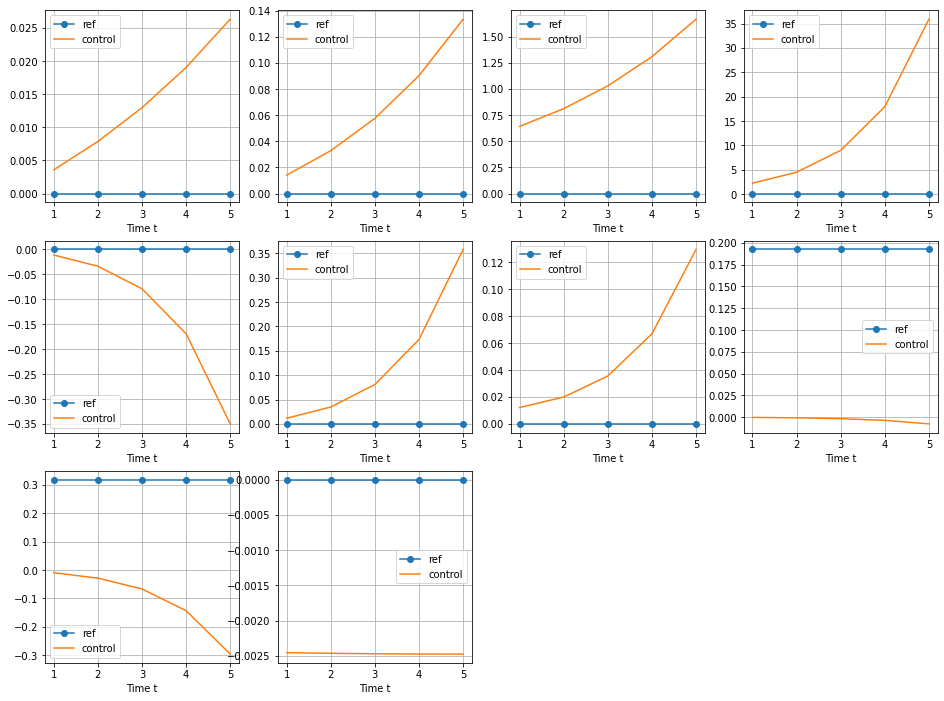

12.611179699964417 [-8.66992808 -7.87435632  4.89789972] [0.99015718 0.5       ]
Point 21 ,Step 3 - MSE error in lifted space,state x, input u:


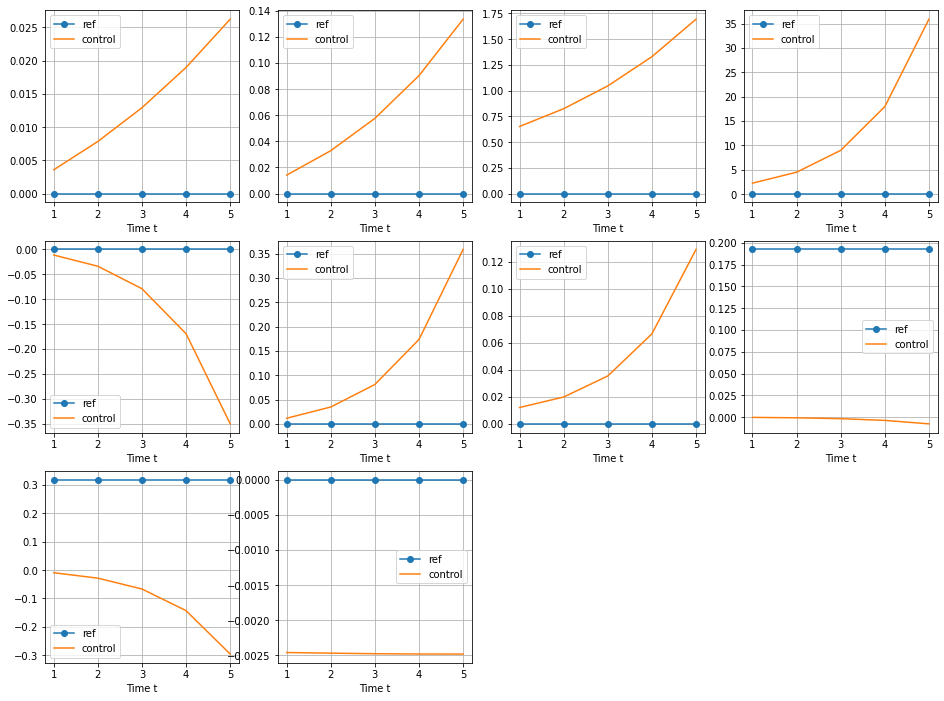

12.658924100364876 [-8.65164243 -7.9717922   4.94789972] [0.99136844 0.5       ]
Point 21 ,Step 4 - MSE error in lifted space,state x, input u:


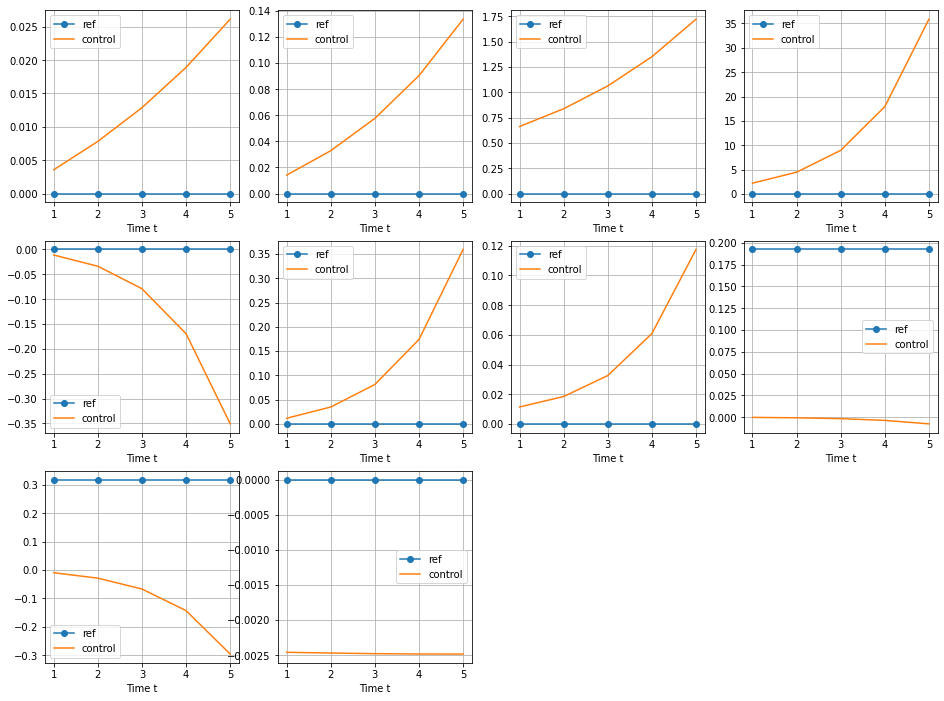

12.702938175830337 [-8.62848176 -8.06830955  4.99789972] [0.99257322 0.5       ]
Point 21 ,Step 5 - MSE error in lifted space,state x, input u:
12.743134515662863 [-8.60049823 -8.16364395  5.04789972] [0.99356562 0.5       ]
Point 21 ,Step 6 - MSE error in lifted space,state x, input u:
12.77943278855125 [-8.56776085 -8.25752969  5.09789972] [0.99429713 0.5       ]
Point 21 ,Step 7 - MSE error in lifted space,state x, input u:
12.811761614991317 [-8.53035492 -8.34970412  5.14789972] [0.99475269 0.5       ]
Point 21 ,Step 8 - MSE error in lifted space,state x, input u:
12.840059204297862 [-8.48838147 -8.43990991  5.19789972] [0.99492992 0.5       ]
Point 21 ,Step 9 - MSE error in lifted space,state x, input u:
12.864273552699421 [-8.44195664 -8.52789647  5.24789972] [0.99483165 0.5       ]
Point 21 ,Step 10 - MSE error in lifted space,state x, input u:
12.884362474163714 [-8.39121114 -8.61342111  5.29789972] [0.99446318 0.5       ]
Point 21 ,Step 11 - MSE error in lifted space,state x, 

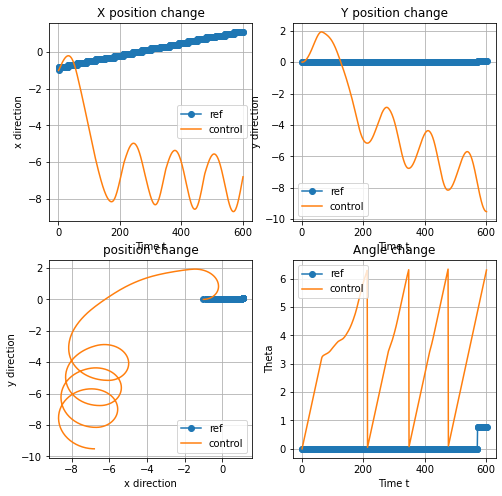

Point 22 ,Step 1 - MSE error in lifted space,state x, input u:


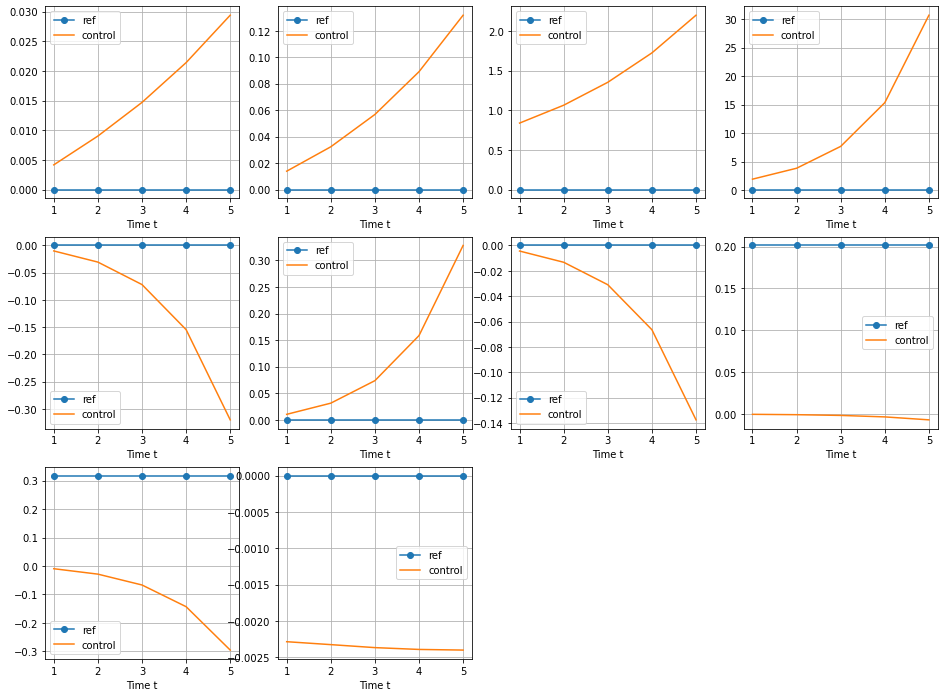

12.533541778023297 [-6.70847662 -9.52345962  6.34789972] [0.89289206 0.5       ]
Point 22 ,Step 2 - MSE error in lifted space,state x, input u:


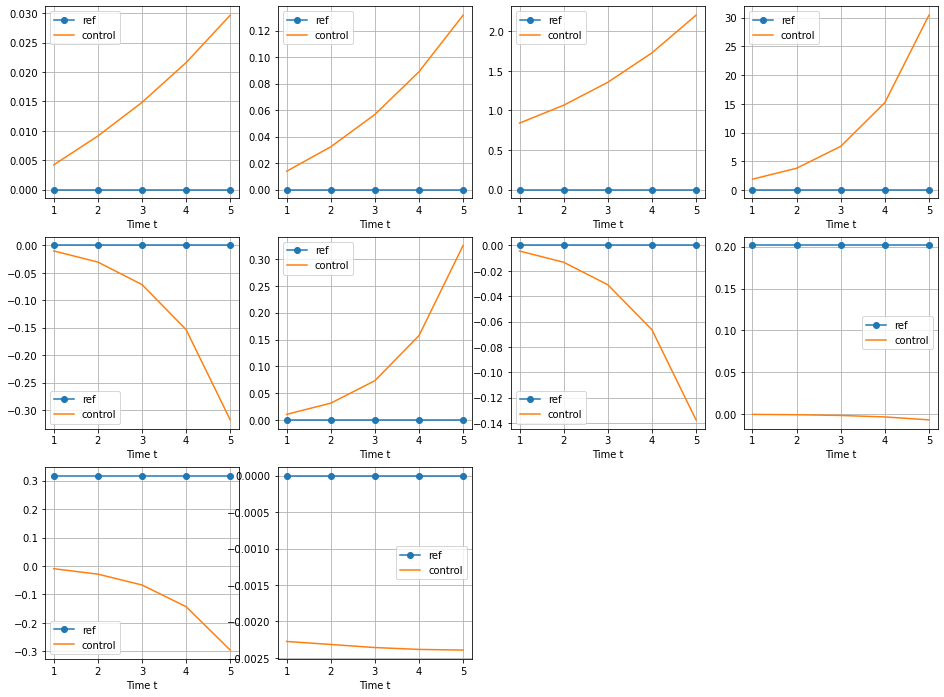

12.473498456227244 [-6.62009272 -9.51773191  6.39789972] [0.88569295 0.5       ]
Point 22 ,Step 3 - MSE error in lifted space,state x, input u:


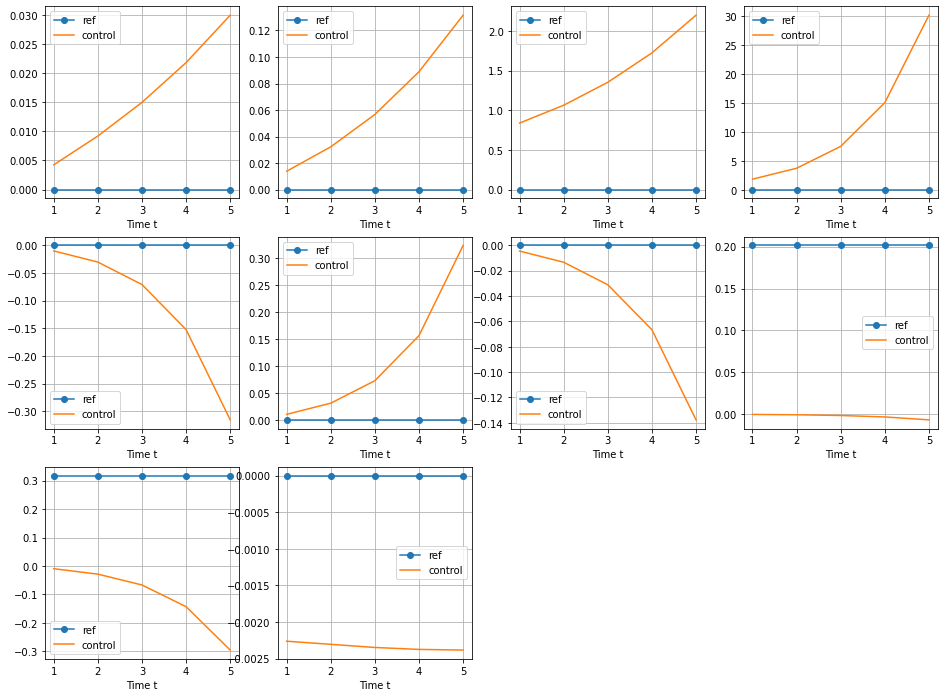

12.411078525633334 [-6.53278528 -9.50767233  6.44789972] [0.87885068 0.5       ]
Point 22 ,Step 4 - MSE error in lifted space,state x, input u:


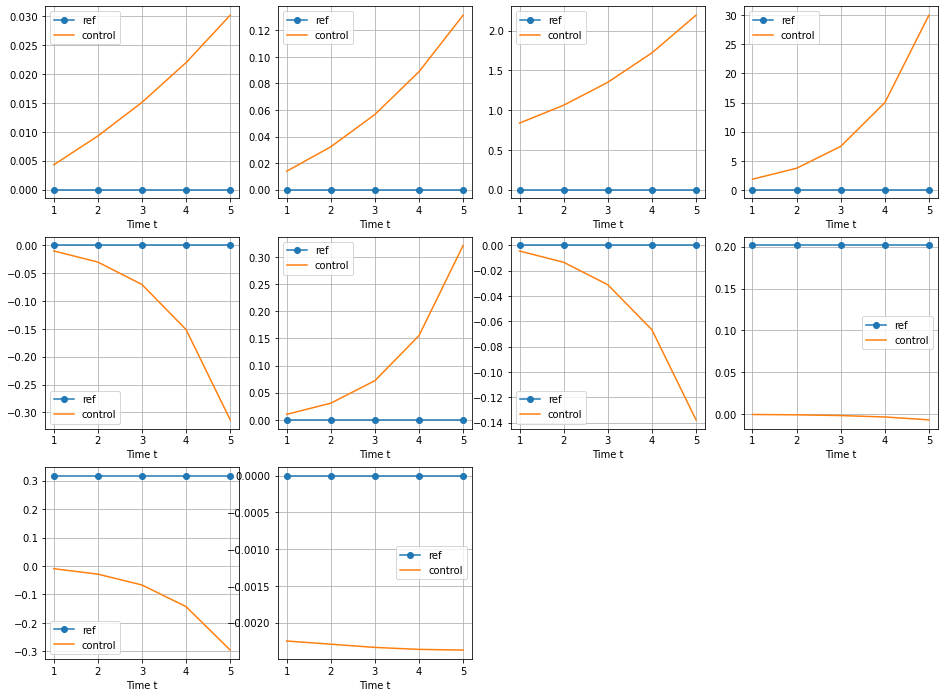

12.346409601026865 [-6.44672803 -9.49336786  6.49789972] [0.87237994 0.5       ]
Point 22 ,Step 5 - MSE error in lifted space,state x, input u:
12.27963929950157 [-6.36211307 -9.47491536  6.54789972] [0.8660362 0.5      ]
Point 22 ,Step 6 - MSE error in lifted space,state x, input u:
12.210924754203296 [-6.27913363 -9.45242164  6.59789972] [0.85974147 0.5       ]
Point 22 ,Step 7 - MSE error in lifted space,state x, input u:
12.14042836356807 [-6.19797768 -9.42600265  6.64789972] [0.85347823 0.5       ]
Point 22 ,Step 8 - MSE error in lifted space,state x, input u:
12.068315959312889 [-6.11882535 -9.3957827   6.69789972] [0.84725072 0.5       ]
Point 22 ,Step 9 - MSE error in lifted space,state x, input u:
11.994798274291673 [-6.04189227 -9.36191309  6.74789972] [0.840586 0.5     ]
Point 22 ,Step 10 - MSE error in lifted space,state x, input u:
11.920141951177243 [-5.96743241 -9.32458381  6.79789972] [0.83293135 0.5       ]
Point 22 ,Step 11 - MSE error in lifted space,state x, input u

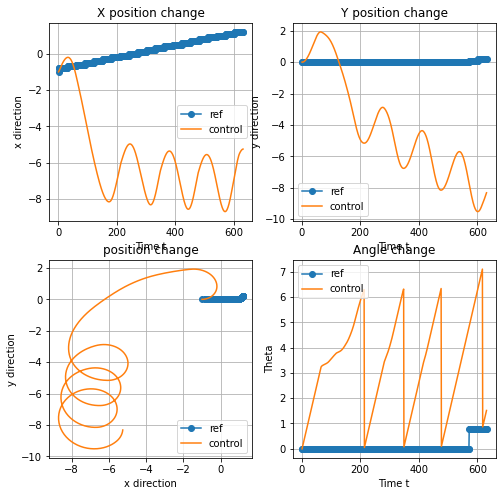

Point 23 ,Step 1 - MSE error in lifted space,state x, input u:


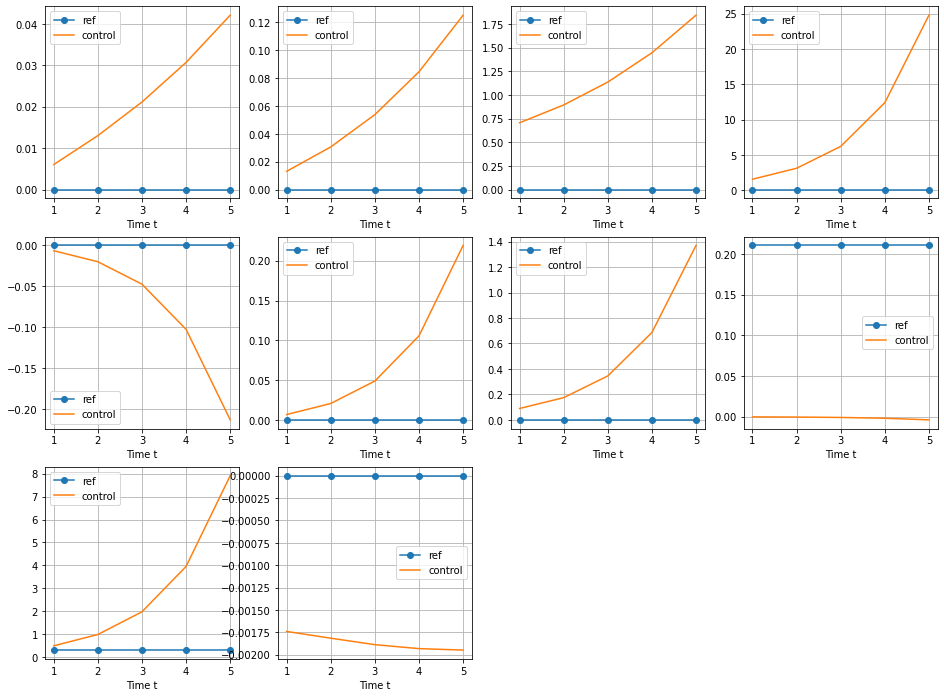

10.78350847150972 [-5.24757926 -8.26815387  1.56471441] [0.57726686 0.5       ]
Point 23 ,Step 2 - MSE error in lifted space,state x, input u:


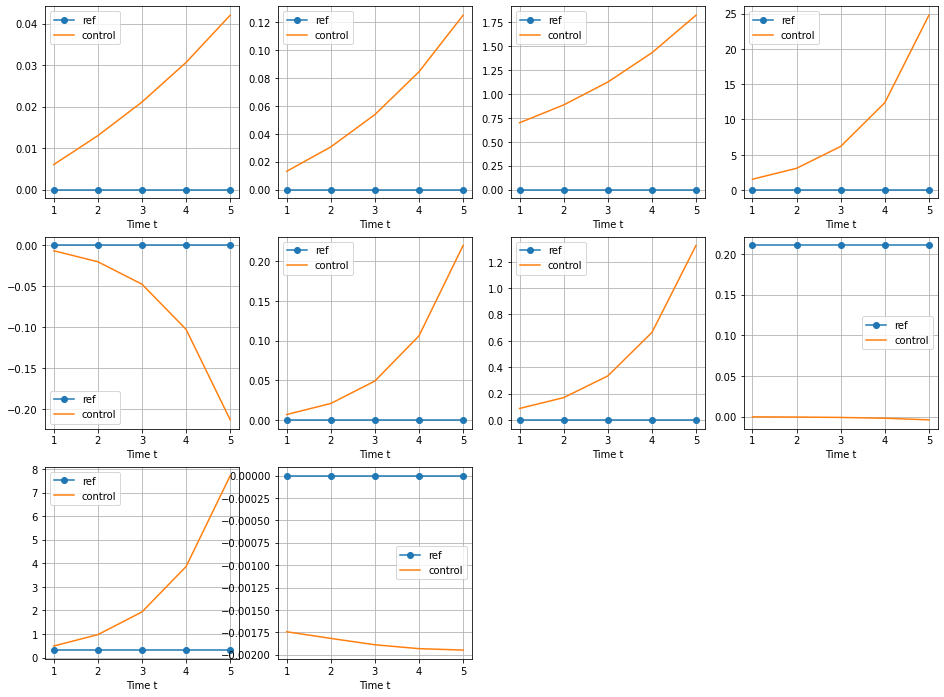

10.737265907789126 [-5.2472265  -8.21015302  1.61471441] [0.5800193 0.5      ]
Point 23 ,Step 3 - MSE error in lifted space,state x, input u:


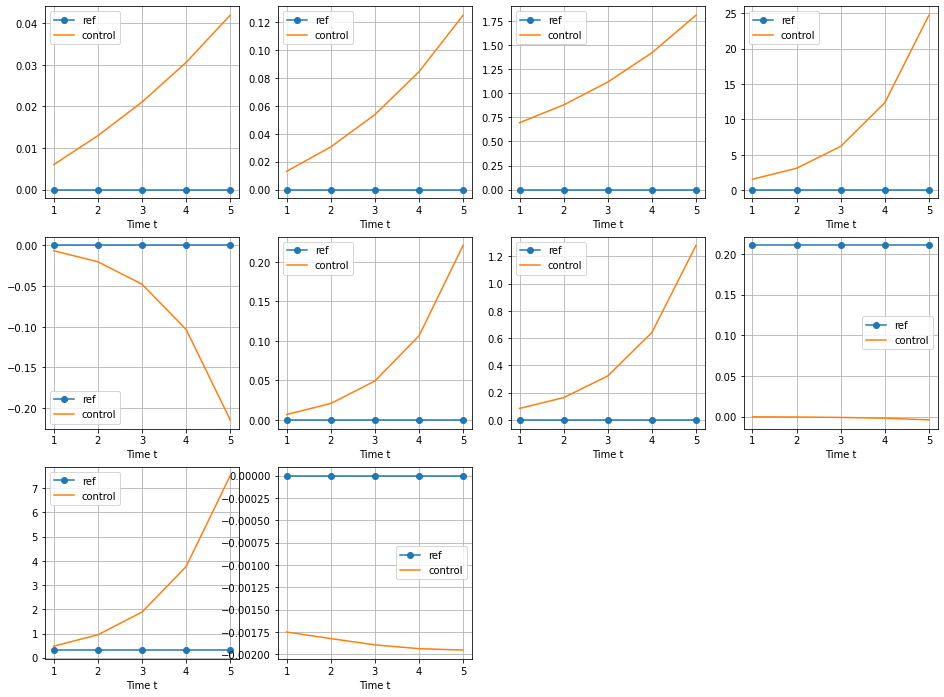

10.692734988602153 [-5.24978579 -8.15191621  1.66471441] [0.58293016 0.5       ]
Point 23 ,Step 4 - MSE error in lifted space,state x, input u:


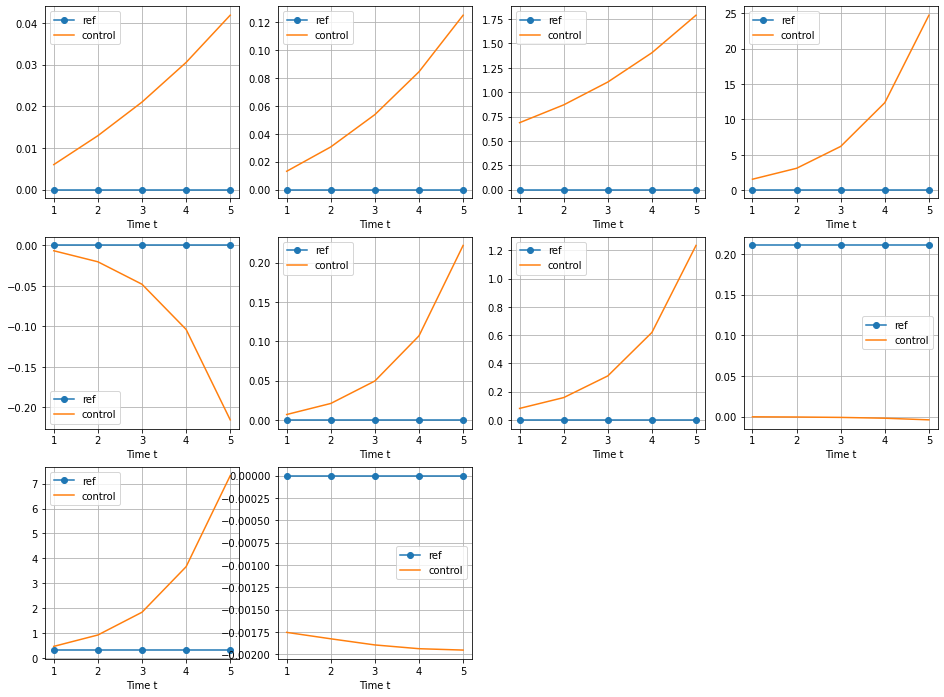

10.650059296412271 [-5.25528156 -8.09357175  1.71471441] [0.58602728 0.5       ]
Point 23 ,Step 5 - MSE error in lifted space,state x, input u:
10.609381398307505 [-5.26373372 -8.03524885  1.76471441] [0.5893216 0.5      ]
Point 23 ,Step 6 - MSE error in lifted space,state x, input u:
10.570842978346779 [-5.27515761 -7.97707821  1.81471441] [0.59281774 0.5       ]
Point 23 ,Step 7 - MSE error in lifted space,state x, input u:
10.534584586410276 [-5.28956391 -7.91919217  1.86471441] [0.59651781 0.5       ]
Point 23 ,Step 8 - MSE error in lifted space,state x, input u:
10.500747989329618 [-5.306957   -7.86172944  1.91471441] [0.60037358 0.5       ]
Point 23 ,Step 9 - MSE error in lifted space,state x, input u:
10.4694726691023 [-5.32733526 -7.80483098  1.96471441] [0.60437639 0.5       ]
Point 23 ,Step 10 - MSE error in lifted space,state x, input u:
10.440893871315069 [-5.35069167 -7.74863747  2.01471441] [0.60854194 0.5       ]
Point 23 ,Step 11 - MSE error in lifted space,state x, inp

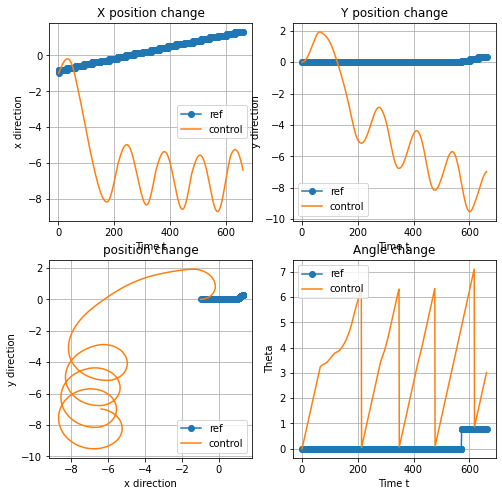

Point 24 ,Step 1 - MSE error in lifted space,state x, input u:


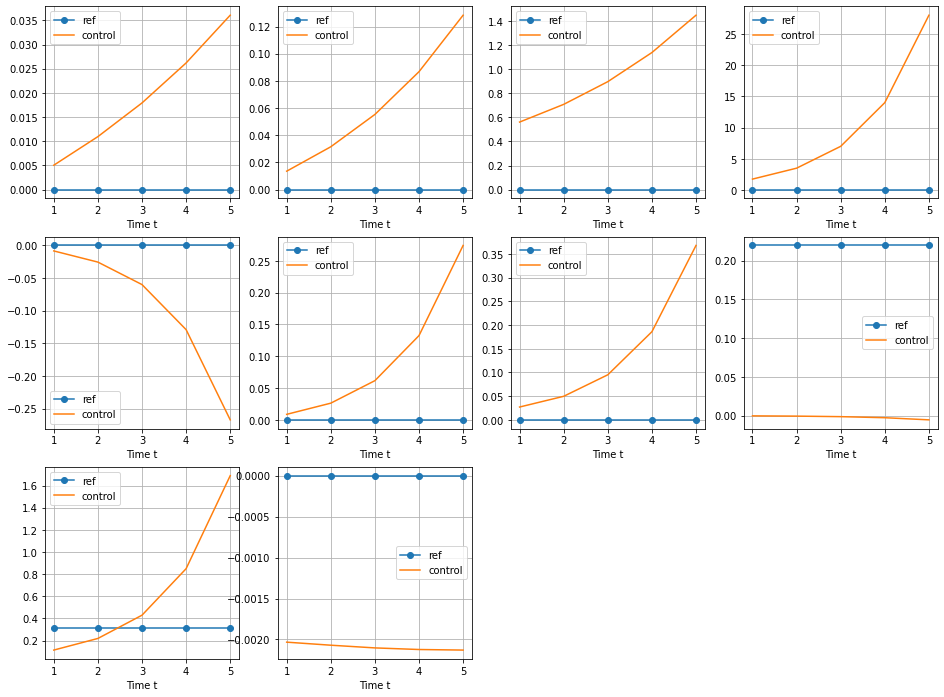

10.779210103177359 [-6.46099269 -6.97537554  3.06471441] [0.74622696 0.5       ]
Point 24 ,Step 2 - MSE error in lifted space,state x, input u:


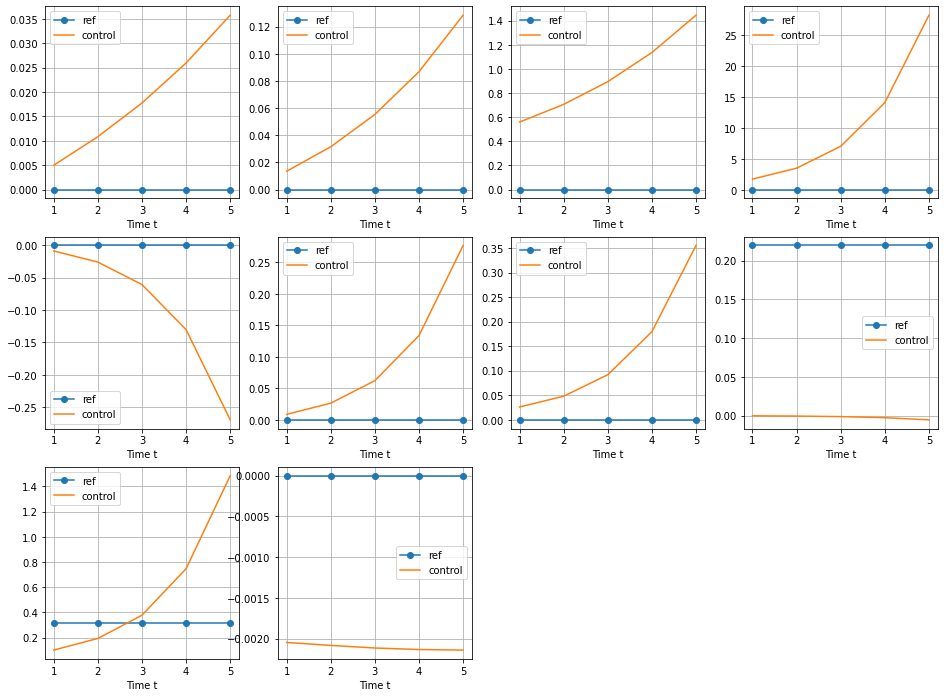

10.830232633060588 [-6.5361949  -6.96958271  3.11471441] [0.75424996 0.5       ]
Point 24 ,Step 3 - MSE error in lifted space,state x, input u:


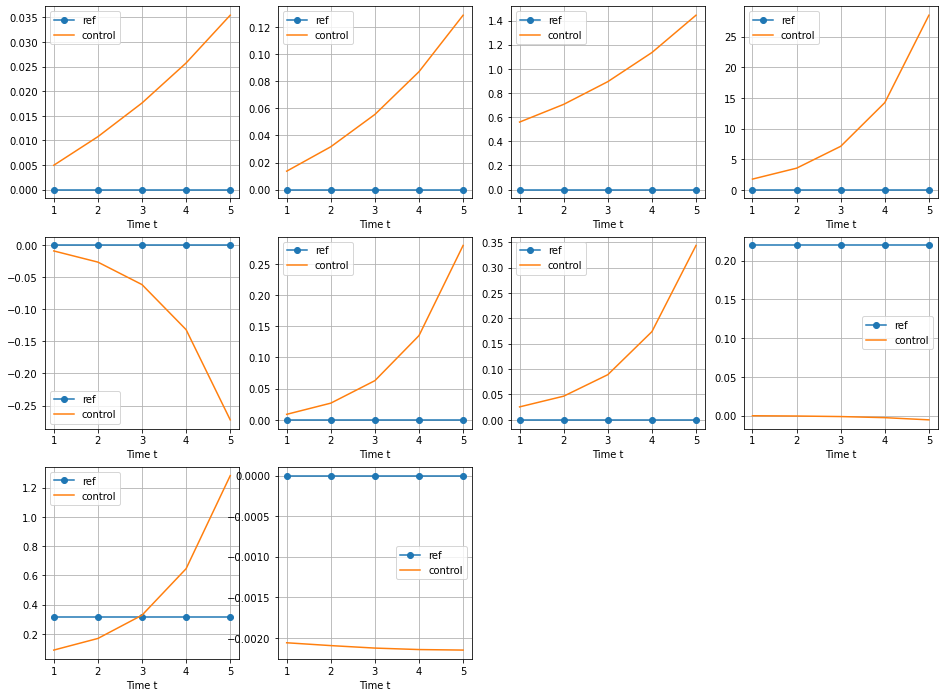

10.884814585100854 [-6.612405   -6.96753382  3.16471441] [0.76237634 0.5       ]
Point 24 ,Step 4 - MSE error in lifted space,state x, input u:


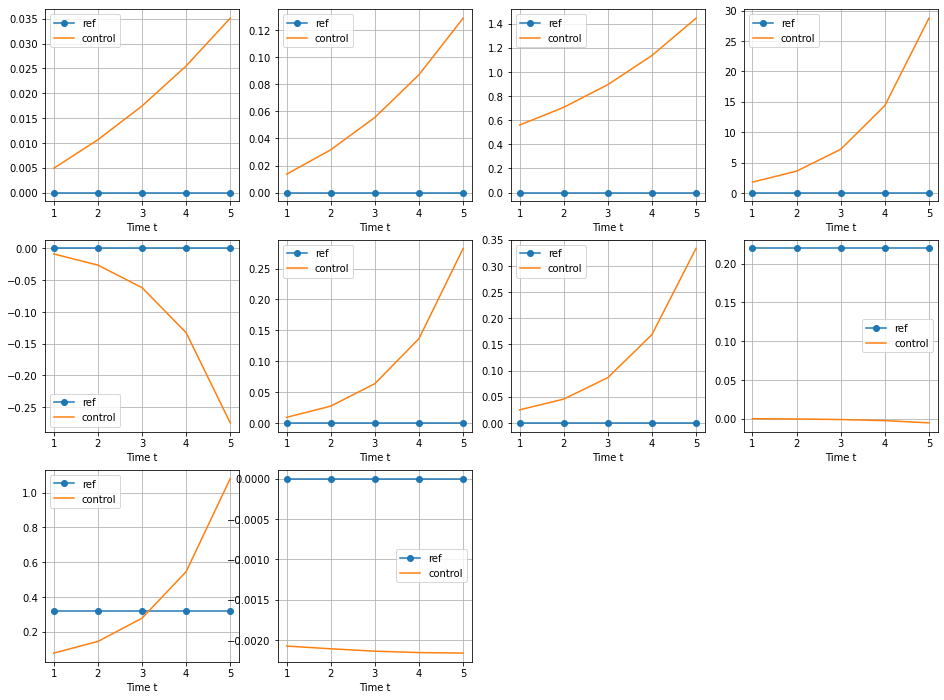

10.942846713824263 [-6.6894428  -6.96931539  3.21471441] [0.770584 0.5     ]
Point 24 ,Step 5 - MSE error in lifted space,state x, input u:
11.00420419572212 [-6.76711746 -6.97500524  3.26471441] [0.77882778 0.5       ]
Point 24 ,Step 6 - MSE error in lifted space,state x, input u:
11.068739915052985 [-6.84521977 -6.98467022  3.31471441] [0.78698042 0.5       ]
Point 24 ,Step 7 - MSE error in lifted space,state x, input u:
11.136297674711221 [-6.92353919 -6.99836612  3.36471441] [0.79507922 0.5       ]
Point 24 ,Step 8 - MSE error in lifted space,state x, input u:
11.206715941008925 [-7.00186702 -7.01613867  3.41471441] [0.80318816 0.5       ]
Point 24 ,Step 9 - MSE error in lifted space,state x, input u:
11.279837319789152 [-7.0800051  -7.03802686  3.46471441] [0.81145867 0.5       ]
Point 24 ,Step 10 - MSE error in lifted space,state x, input u:
11.355487276997518 [-7.15774139 -7.06405745  3.51471441] [0.81978798 0.5       ]
Point 24 ,Step 11 - MSE error in lifted space,state x, inpu

KeyboardInterrupt: 

In [3]:
# get augmented matrices
model_file = 'unordered_encoder_[3, 32, 64, 10]_decoder_[10, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
Q = 10*np.diag(np.array([1.,1.,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1]))
R = 0.1*np.diag(np.array([1.,1.]))
rho = 0.01
# Np = 6
Nc = 5
thre = 0.1
ref = np.load(path+".npy",allow_pickle=True).item()
path_ref = ref['path']
x_init = ref['init state']
u_init = np.array([0.,0.])#1.5*10*np.pi/SimLength,-10*np.pi/SimLength])
t1 = time.perf_counter()
file_name = MPC_control_process_closed(model_file,path_ref,u_init,x_init,Q,R,rho,Nc,thre)
t2 = time.perf_counter()
print("Total time needed is "+str(1000*(t2-t1))+" ms.")

In [1]:
control_files = [file_name]
ref_file = 'SimLenth_200_Ts_0.1'
MPC_result_plot(ref_file,control_files,Nc)

NameError: name 'file_name' is not defined

Init state:[0.1        0.         3.14159265]
Target state:[-0.87622743  0.21336671 -0.09914262]
Step 1: [-0.73661508 -0.29631704  0.32786901], [-10.34086965 -30.6216042 ], 0.4010555556094147
Step 2: [-0.88572739  0.02209212  0.03072034], [-4.00289828 -3.1367992 ], 0.15571147372703414
Step 3: [-0.90859154  0.06224659  0.00121687], [-1.49910931 -0.31861735], 0.16137498028010588
Step 4: [-0.88837041  0.06462974 -0.00214399], [-0.56206496 -0.04945194], 0.1710685945285632
Step 5: [-0.89575526  0.06947952 -0.00455963], [-0.20662397 -0.00259079], 0.17544328618908214
Step 6: [-0.89263809  0.06800581 -0.00377966], [-0.07757328 -0.00216315], 0.1770357794751264
Step 7: [-0.89231451  0.06895362 -0.00450008], [-0.02676516  0.00046692], 0.1776877349419027
Step 8: [-0.89357217  0.06874902 -0.0041351 ], [-0.00952973  0.00022789], 0.17782130073908425
Step 9: [-0.89225666  0.06904245 -0.00451445], [-0.0019643   0.00049145], 0.1778999534610738
Step 10: [-0.89328697  0.06900504 -0.00433301], [0.00012103 

Step 320: [-0.89188078  0.0746417  -0.00823843], [0.00155348 0.00047307], 0.16226666110677399
Step 321: [-0.89187794  0.07465851 -0.0082499 ], [0.00155266 0.00047293], 0.1622203713938142
Step 322: [-0.89187511  0.07467531 -0.00826137], [0.00155184 0.00047278], 0.1621741064906493
Step 323: [-0.89187227  0.07469211 -0.00827284], [0.00155101 0.00047263], 0.162127866384186
Step 324: [-0.89186944  0.0747089  -0.00828429], [0.00155019 0.00047249], 0.16208165106133693
Step 325: [-0.89186661  0.07472568 -0.00829575], [0.00154937 0.00047234], 0.16203546050902098
Step 326: [-0.89186379  0.07474246 -0.0083072 ], [0.00154855 0.0004722 ], 0.16198929471416315
Step 327: [-0.89186096  0.07475923 -0.00831864], [0.00154773 0.00047205], 0.16194315366369447
Step 328: [-0.89185813  0.07477599 -0.00833008], [0.00154691 0.0004719 ], 0.16189703734455213
Step 329: [-0.89185531  0.07479275 -0.00834152], [0.00154609 0.00047176], 0.16185094574367948
Step 330: [-0.89185248  0.0748095  -0.00835295], [0.00154527 0.0

Step 674: [-0.89095229  0.08019877 -0.01202982], [0.00128653 0.00042543], 0.14733807431446913
Step 675: [-0.89094987  0.08021341 -0.01203981], [0.00128584 0.00042531], 0.14729979238087823
Step 676: [-0.89094745  0.08022805 -0.01204979], [0.00128515 0.00042518], 0.1472615309855785
Step 677: [-0.89094503  0.08024268 -0.01205977], [0.00128446 0.00042506], 0.14722329011748514
Step 678: [-0.89094261  0.0802573  -0.01206974], [0.00128378 0.00042494], 0.14718506976551848
Step 679: [-0.89094019  0.08027192 -0.01207972], [0.00128309 0.00042481], 0.14714686991860418
Step 680: [-0.89093777  0.08028654 -0.01208968], [0.0012824  0.00042469], 0.14710869056567308
Step 681: [-0.89093536  0.08030115 -0.01209965], [0.00128172 0.00042457], 0.1470705316956613
Step 682: [-0.89093294  0.08031575 -0.01210961], [0.00128103 0.00042444], 0.1470323932975103
Step 683: [-0.89093053  0.08033035 -0.01211956], [0.00128034 0.00042432], 0.14699427536016665
Step 684: [-0.89092812  0.08034494 -0.01212952], [0.00127966 0.

Step 978: [-0.88835181  0.08423627 -0.01590505], [0.00109236 0.00039047], 0.1365966736840026
Step 979: [-0.88834189  0.08424864 -0.01591806], [0.00109177 0.00039037], 0.13656414848644483
Step 980: [-0.88833197  0.08426101 -0.01593108], [0.00109118 0.00039026], 0.1365316406896132
Step 981: [-0.88832205  0.08427338 -0.01594408], [0.00109059 0.00039015], 0.13649915028392454
Step 982: [-0.88831214  0.08428574 -0.01595708], [0.00109    0.00039005], 0.13646667725980036
Step 983: [-0.88830224  0.08429809 -0.01597008], [0.00108941 0.00038994], 0.1364342216076668
Step 984: [-0.88829234  0.08431044 -0.01598307], [0.00108882 0.00038983], 0.13640178331795455
Step 985: [-0.88828244  0.08432279 -0.01599605], [0.00108824 0.00038973], 0.13636936238109895
Step 986: [-0.88827255  0.08433513 -0.01600903], [0.00108765 0.00038962], 0.1363369587875401
Step 987: [-0.88826267  0.08434747 -0.01602201], [0.00108706 0.00038951], 0.1363045725277226
Step 988: [-0.88825279  0.0843598  -0.01603497], [0.00108647 0.00

Step 1271: [-0.88565264  0.08767987 -0.0194937 ], [0.00093138 0.00036123], 0.1277727582983174
Step 1272: [-0.88564411  0.08769103 -0.01950521], [0.00093087 0.00036113], 0.12774494027376562
Step 1273: [-0.88563559  0.08770218 -0.01951672], [0.00093036 0.00036104], 0.12771713703310117
Step 1274: [-0.88562707  0.08771333 -0.01952822], [0.00092985 0.00036095], 0.12768934856802436
Step 1275: [-0.88561855  0.08772447 -0.01953971], [0.00092935 0.00036085], 0.12766157487023955
Step 1276: [-0.88561004  0.08773561 -0.0195512 ], [0.00092884 0.00036076], 0.1276338159314553
Step 1277: [-0.88560154  0.08774675 -0.01956269], [0.00092833 0.00036067], 0.1276060717433843
Step 1278: [-0.88559303  0.08775789 -0.01957417], [0.00092782 0.00036058], 0.12757834229774329
Step 1279: [-0.88558454  0.08776902 -0.01958564], [0.00092731 0.00036048], 0.12755062758625324
Step 1280: [-0.88557604  0.08778014 -0.01959712], [0.0009268  0.00036039], 0.12752292760063916
Step 1281: [-0.88556755  0.08779127 -0.01960858], [0.

Step 1626: [-0.88288732  0.09141132 -0.023296  ], [0.00076568 0.00033078], 0.11876755484753279
Step 1627: [-0.88288023  0.09142121 -0.02330596], [0.00076525 0.0003307 ], 0.11874449309350689
Step 1628: [-0.88287314  0.09143111 -0.02331591], [0.00076483 0.00033062], 0.11872144342481815
Step 1629: [-0.88286606  0.091441   -0.02332585], [0.0007644  0.00033054], 0.11869840583453496
Step 1630: [-0.88285898  0.09145089 -0.02333579], [0.00076398 0.00033046], 0.11867538031572923
Step 1631: [-0.88285191  0.09146077 -0.02334573], [0.00076355 0.00033039], 0.11865236686147648
Step 1632: [-0.88284483  0.09147065 -0.02335566], [0.00076313 0.00033031], 0.11862936546485583
Step 1633: [-0.88283777  0.09148053 -0.02336559], [0.0007627  0.00033023], 0.11860637611894995
Step 1634: [-0.8828307   0.09149041 -0.02337551], [0.00076228 0.00033015], 0.11858339881684511
Step 1635: [-0.88282364  0.09150028 -0.02338543], [0.00076185 0.00033007], 0.11856043355163116
Step 1636: [-0.88281659  0.09151015 -0.02339535], 

Step 1926: [-0.88091844  0.09424162 -0.02611043], [0.00064704 0.00030869], 0.11236133343245724
Step 1927: [-0.88091238  0.09425061 -0.02611926], [0.00064667 0.00030862], 0.11234160190530956
Step 1928: [-0.88090632  0.0942596  -0.02612809], [0.00064631 0.00030855], 0.11232188053857822
Step 1929: [-0.88090027  0.09426858 -0.02613692], [0.00064594 0.00030848], 0.11230216932634463
Step 1930: [-0.88089422  0.09427756 -0.02614574], [0.00064558 0.00030842], 0.11228246826269345
Step 1931: [-0.88088817  0.09428654 -0.02615456], [0.00064521 0.00030835], 0.11226277734171249
Step 1932: [-0.88088213  0.09429552 -0.02616338], [0.00064484 0.00030828], 0.1122430965574927
Step 1933: [-0.88087609  0.09430449 -0.02617219], [0.00064448 0.00030821], 0.11222342590412827
Step 1934: [-0.88087006  0.09431346 -0.026181  ], [0.00064411 0.00030814], 0.11220376537571645
Step 1935: [-0.88086402  0.09432243 -0.02618981], [0.00064375 0.00030807], 0.11218411496635773
Step 1936: [-0.88085799  0.09433139 -0.02619861], [

Step 2252: [-0.87910308  0.09703078 -0.02881633], [0.00053696 0.0002879 ], 0.10643466803368609
Step 2253: [-0.87909798  0.09703892 -0.02882412], [0.00053665 0.00028784], 0.10641795280738515
Step 2254: [-0.87909288  0.09704706 -0.02883191], [0.00053634 0.00028778], 0.10640124597259867
Step 2255: [-0.87908778  0.09705519 -0.02883969], [0.00053603 0.00028772], 0.10638454752437322
Step 2256: [-0.87908269  0.09706333 -0.02884747], [0.00053572 0.00028766], 0.10636785745775827
Step 2257: [-0.8790776   0.09707146 -0.02885525], [0.00053541 0.0002876 ], 0.10635117576780595
Step 2258: [-0.87907251  0.09707959 -0.02886303], [0.0005351  0.00028754], 0.1063345024495712
Step 2259: [-0.87906742  0.09708772 -0.0288708 ], [0.00053479 0.00028749], 0.10631783749811169
Step 2260: [-0.87906234  0.09709584 -0.02887857], [0.00053448 0.00028743], 0.1063011809084878
Step 2261: [-0.87905726  0.09710396 -0.02888634], [0.00053418 0.00028737], 0.10628453267576277
Step 2262: [-0.87905218  0.09711208 -0.02889411], [0

Step 2591: [-0.87751996  0.09965993 -0.03129765], [0.00044022 0.0002693 ], 0.10121853123441785
Step 2592: [-0.8775157   0.09966732 -0.03130452], [0.00043996 0.00026925], 0.10120439401877603
Step 2593: [-0.87751145  0.0996747  -0.03131139], [0.0004397 0.0002692], 0.1011902636654812
Step 2594: [-0.87750719  0.09968209 -0.03131825], [0.00043944 0.00026915], 0.10117614017044502
Step 2595: [-0.87750294  0.09968947 -0.03132512], [0.00043918 0.0002691 ], 0.10116202352958141
Step 2596: [-0.87749869  0.09969685 -0.03133198], [0.00043892 0.00026905], 0.10114791373880672
Step 2597: [-0.87749444  0.09970423 -0.03133883], [0.00043865 0.000269  ], 0.10113381079403962
Step 2598: [-0.87749019  0.0997116  -0.03134569], [0.00043839 0.00026895], 0.10111971469120108
Step 2599: [-0.87748595  0.09971898 -0.03135254], [0.00043813 0.00026889], 0.10110562542621451
Step 2600: [-0.87748171  0.09972635 -0.03135939], [0.00043787 0.00026884], 0.1010915429950056
Step 2601: [-0.87747747  0.09973372 -0.03136624], [0.0

Step 2912: [-0.87626352  0.10193153 -0.03338123], [0.00036274 0.0002541 ], 0.09701159834807697
Step 2913: [-0.87625994  0.10193831 -0.03338736], [0.00036251 0.00025406], 0.0969994663352892
Step 2914: [-0.87625636  0.10194509 -0.03339349], [0.00036229 0.00025401], 0.09698733998729378
Step 2915: [-0.87625278  0.10195187 -0.03339961], [0.00036207 0.00025397], 0.09697521930070133
Step 2916: [-0.8762492   0.10195864 -0.03340574], [0.00036185 0.00025393], 0.0969631042721244
Step 2917: [-0.87624562  0.10196541 -0.03341186], [0.00036163 0.00025388], 0.09695099489817757
Step 2918: [-0.87624204  0.10197218 -0.03341797], [0.00036141 0.00025384], 0.09693889117547748
Step 2919: [-0.87623847  0.10197895 -0.03342409], [0.00036118 0.00025379], 0.09692679310064269
Step 2920: [-0.8762349   0.10198571 -0.0334302 ], [0.00036096 0.00025375], 0.09691470067029379
Step 2921: [-0.87623133  0.10199248 -0.03343631], [0.00036074 0.00025371], 0.09690261388105337
Step 2922: [-0.87622776  0.10199924 -0.03344242], [0

Step 3243: [-0.87517717  0.10408399 -0.03529913], [0.00029502 0.00024051], 0.0932859366038207
Step 3244: [-0.87517418  0.10409023 -0.03530461], [0.00029484 0.00024048], 0.09327550604232124
Step 3245: [-0.87517118  0.10409646 -0.03531008], [0.00029465 0.00024044], 0.09326508012725357
Step 3246: [-0.87516819  0.1041027  -0.03531556], [0.00029446 0.0002404 ], 0.09325465885583789
Step 3247: [-0.8751652   0.10410893 -0.03532103], [0.00029427 0.00024036], 0.09324424222529612
Step 3248: [-0.87516222  0.10411517 -0.03532649], [0.00029408 0.00024032], 0.09323383023285177
Step 3249: [-0.87515923  0.1041214  -0.03533196], [0.0002939  0.00024028], 0.09322342287573014
Step 3250: [-0.87515625  0.10412763 -0.03533742], [0.00029371 0.00024025], 0.09321302015115811
Step 3251: [-0.87515326  0.10413386 -0.03534289], [0.00029352 0.00024021], 0.0932026220563643
Step 3252: [-0.87515028  0.10414009 -0.03534835], [0.00029334 0.00024017], 0.09319222858857902
Step 3253: [-0.8751473   0.10414631 -0.03535381], [0

Step 3577: [-0.87426343  0.10608833 -0.03703209], [0.00023733 0.00022862], 0.09004424084555405
Step 3578: [-0.87426094  0.10609411 -0.03703701], [0.00023717 0.00022859], 0.0900352175047997
Step 3579: [-0.87425846  0.10609988 -0.03704192], [0.00023701 0.00022856], 0.09002619797012551
Step 3580: [-0.87425597  0.10610565 -0.03704683], [0.00023685 0.00022853], 0.09001718223926473
Step 3581: [-0.87425348  0.10611142 -0.03705174], [0.0002367  0.00022849], 0.09000817030995202
Step 3582: [-0.874251    0.10611719 -0.03705665], [0.00023654 0.00022846], 0.08999916217992344
Step 3583: [-0.87424851  0.10612295 -0.03706156], [0.00023638 0.00022843], 0.08999015784691647
Step 3584: [-0.87424603  0.10612872 -0.03706646], [0.00023622 0.00022839], 0.08998115730866993
Step 3585: [-0.87424355  0.10613448 -0.03707137], [0.00023606 0.00022836], 0.08997216056292405
Step 3586: [-0.87424107  0.10614025 -0.03707627], [0.00023591 0.00022833], 0.08996316760742046
Step 3587: [-0.8742386   0.10614601 -0.03708117], [

Step 3902: [-0.87352326  0.10789994 -0.03855202], [0.00018988 0.00021855], 0.08729980956907264
Step 3903: [-0.87352119  0.10790533 -0.03855647], [0.00018974 0.00021852], 0.08729191141329051
Step 3904: [-0.87351911  0.10791071 -0.03856091], [0.00018961 0.00021849], 0.08728401639596248
Step 3905: [-0.87351704  0.10791609 -0.03856536], [0.00018948 0.00021846], 0.0872761245152349
Step 3906: [-0.87351497  0.10792147 -0.03856981], [0.00018934 0.00021843], 0.08726823576925537
Step 3907: [-0.8735129   0.10792685 -0.03857425], [0.00018921 0.0002184 ], 0.08726035015617253
Step 3908: [-0.87351083  0.10793223 -0.03857869], [0.00018907 0.00021838], 0.08725246767413627
Step 3909: [-0.87350876  0.10793761 -0.03858313], [0.00018894 0.00021835], 0.08724458832129758
Step 3910: [-0.87350669  0.10794298 -0.03858757], [0.00018881 0.00021832], 0.08723671209580862
Step 3911: [-0.87350463  0.10794836 -0.03859201], [0.00018867 0.00021829], 0.08722883899582268
Step 3912: [-0.87350256  0.10795373 -0.03859645], [

Step 4232: [-0.87289895  0.109619   -0.03995204], [0.00014913 0.0002096 ], 0.08485332566286746
Step 4233: [-0.87289723  0.10962404 -0.03995609], [0.00014901 0.00020957], 0.08484636909037292
Step 4234: [-0.87289551  0.10962908 -0.03996013], [0.0001489  0.00020955], 0.08483941510327589
Step 4235: [-0.8728938   0.10963413 -0.03996417], [0.00014879 0.00020952], 0.08483246370006764
Step 4236: [-0.87289208  0.10963916 -0.03996822], [0.00014867 0.0002095 ], 0.08482551487924035
Step 4237: [-0.87289037  0.1096442  -0.03997226], [0.00014856 0.00020947], 0.0848185686392872
Step 4238: [-0.87288866  0.10964924 -0.0399763 ], [0.00014845 0.00020945], 0.08481162497870226
Step 4239: [-0.87288695  0.10965428 -0.03998033], [0.00014833 0.00020942], 0.08480468389598052
Step 4240: [-0.87288523  0.10965931 -0.03998437], [0.00014822 0.00020939], 0.08479774538961797
Step 4241: [-0.87288352  0.10966435 -0.03998841], [0.00014811 0.00020937], 0.08479080945811153
Step 4242: [-0.87288182  0.10966938 -0.03999244], [

Step 4557: [-0.87239033  0.11120963 -0.0412101 ], [0.0001152  0.00020185], 0.0827204218937337
Step 4558: [-0.87238891  0.11121439 -0.0412138 ], [0.0001151  0.00020183], 0.08271423122786761
Step 4559: [-0.87238749  0.11121914 -0.04121751], [0.00011501 0.00020181], 0.08270804270353611
Step 4560: [-0.87238607  0.11122389 -0.04122121], [0.00011491 0.00020179], 0.08270185631950792
Step 4561: [-0.87238465  0.11122864 -0.04122491], [0.00011482 0.00020176], 0.08269567207455261
Step 4562: [-0.87238324  0.11123339 -0.04122861], [0.00011472 0.00020174], 0.08268948996744044
Step 4563: [-0.87238182  0.11123813 -0.04123231], [0.00011463 0.00020172], 0.08268330999694246
Step 4564: [-0.87238041  0.11124288 -0.04123601], [0.00011453 0.0002017 ], 0.0826771321618305
Step 4565: [-0.87237899  0.11124763 -0.04123971], [0.00011443 0.00020168], 0.08267095646087716
Step 4566: [-0.87237758  0.11125237 -0.0412434 ], [0.00011434 0.00020165], 0.0826647828928558
Step 4567: [-0.87237617  0.11125712 -0.0412471 ], [0.

Step 4872: [-0.87198276  0.11266731 -0.04233131], [8.73170894e-05 1.95215308e-04], 0.08087021664948013
Step 4873: [-0.87198158  0.11267182 -0.04233473], [8.72355979e-05 1.95195453e-04], 0.08086464345775693
Step 4874: [-0.87198041  0.11267633 -0.04233815], [8.71541486e-05 1.95175606e-04], 0.08085907205538766
Step 4875: [-0.87197924  0.11268084 -0.04234157], [8.70727413e-05 1.95155766e-04], 0.08085350244136089
Step 4876: [-0.87197806  0.11268534 -0.04234499], [8.69913762e-05 1.95135933e-04], 0.08084793461466576
Step 4877: [-0.87197689  0.11268985 -0.04234841], [8.69100531e-05 1.95116108e-04], 0.08084236857429211
Step 4878: [-0.87197572  0.11269435 -0.04235182], [8.68287721e-05 1.95096290e-04], 0.08083680431923038
Step 4879: [-0.87197455  0.11269885 -0.04235524], [8.67475331e-05 1.95076479e-04], 0.08083124184847161
Step 4880: [-0.87197338  0.11270336 -0.04235865], [8.66663362e-05 1.95056676e-04], 0.08082568116100754
Step 4881: [-0.87197222  0.11270786 -0.04236207], [8.65851812e-05 1.95036

Step 5187: [-0.87164671  0.11405299 -0.04336932], [6.36262410e-05 1.89305877e-04], 0.07919817860076178
Step 5188: [-0.87164574  0.11405728 -0.0433725 ], [6.35570294e-05 1.89288164e-04], 0.0791931221281897
Step 5189: [-0.87164478  0.11406158 -0.04337567], [6.34878538e-05 1.89270456e-04], 0.07918806715553281
Step 5190: [-0.87164381  0.11406587 -0.04337885], [6.34187141e-05 1.89252755e-04], 0.0791830136819594
Step 5191: [-0.87164285  0.11407016 -0.04338202], [6.33496103e-05 1.89235060e-04], 0.07917796170663827
Step 5192: [-0.87164189  0.11407445 -0.04338519], [6.32805425e-05 1.89217372e-04], 0.07917291122873865
Step 5193: [-0.87164093  0.11407875 -0.04338836], [6.32115106e-05 1.89199690e-04], 0.07916786224743037
Step 5194: [-0.87163997  0.11408304 -0.04339154], [6.31425145e-05 1.89182014e-04], 0.07916281476188376
Step 5195: [-0.87163901  0.11408733 -0.04339471], [6.30735543e-05 1.89164344e-04], 0.07915776877126962
Step 5196: [-0.87163805  0.11409162 -0.04339788], [6.30046300e-05 1.8914668

Step 5512: [-0.87136376  0.11541675 -0.04436505], [4.29277453e-05 1.83863215e-04], 0.07762930608898506
Step 5513: [-0.87136298  0.11542085 -0.04436801], [4.28693209e-05 1.83847392e-04], 0.07762469606889624
Step 5514: [-0.8713622   0.11542495 -0.04437096], [4.28109272e-05 1.83831573e-04], 0.07762008730370831
Step 5515: [-0.87136142  0.11542905 -0.04437392], [4.27525639e-05 1.83815760e-04], 0.07761547979274044
Step 5516: [-0.87136064  0.11543315 -0.04437687], [4.26942312e-05 1.83799953e-04], 0.0776108735353122
Step 5517: [-0.87135986  0.11543725 -0.04437983], [4.26359290e-05 1.83784151e-04], 0.07760626853074355
Step 5518: [-0.87135908  0.11544135 -0.04438278], [4.25776572e-05 1.83768354e-04], 0.07760166477835491
Step 5519: [-0.8713583   0.11544545 -0.04438573], [4.25194159e-05 1.83752562e-04], 0.07759706227746711
Step 5520: [-0.87135752  0.11544955 -0.04438869], [4.24612051e-05 1.83736776e-04], 0.07759246102740136
Step 5521: [-0.87135675  0.11545364 -0.04439164], [4.24030247e-05 1.837209

Step 5832: [-0.87113893  0.11670227 -0.04528098], [2.57110623e-05 1.79059987e-04], 0.07621463806143827
Step 5833: [-0.8711383   0.1167062  -0.04528375], [2.56616683e-05 1.79045754e-04], 0.07621039700522668
Step 5834: [-0.87113767  0.11671014 -0.04528652], [2.56123004e-05 1.79031526e-04], 0.07620615700595142
Step 5835: [-0.87113705  0.11671407 -0.04528929], [2.55629584e-05 1.79017303e-04], 0.07620191806305233
Step 5836: [-0.87113642  0.11671801 -0.04529206], [2.55136424e-05 1.79003084e-04], 0.07619768017596952
Step 5837: [-0.87113579  0.11672194 -0.04529483], [2.54643524e-05 1.78988870e-04], 0.07619344334414349
Step 5838: [-0.87113517  0.11672588 -0.0452976 ], [2.54150883e-05 1.78974660e-04], 0.07618920756701505
Step 5839: [-0.87113454  0.11672981 -0.04530037], [2.53658502e-05 1.78960455e-04], 0.07618497284402533
Step 5840: [-0.87113392  0.11673374 -0.04530313], [2.53166380e-05 1.78946255e-04], 0.07618073917461585
Step 5841: [-0.87113329  0.11673767 -0.0453059 ], [2.52674517e-05 1.78932

Step 6155: [-0.87095787  0.11794928 -0.04614942], [1.10390415e-05 1.74689982e-04], 0.07489676866985998
Step 6156: [-0.87095738  0.11795307 -0.04615203], [1.09974010e-05 1.74677124e-04], 0.07489284166664886
Step 6157: [-0.87095688  0.11795686 -0.04615464], [1.09557826e-05 1.74664271e-04], 0.0748889155559202
Step 6158: [-0.87095638  0.11796065 -0.04615725], [1.09141863e-05 1.74651421e-04], 0.07488499033721281
Step 6159: [-0.87095589  0.11796443 -0.04615985], [1.08726121e-05 1.74638575e-04], 0.07488106601006572
Step 6160: [-0.87095539  0.11796822 -0.04616246], [1.08310599e-05 1.74625733e-04], 0.07487714257401834
Step 6161: [-0.8709549   0.11797201 -0.04616507], [1.07895298e-05 1.74612895e-04], 0.07487322002861024
Step 6162: [-0.87095441  0.11797579 -0.04616768], [1.07480217e-05 1.74600061e-04], 0.07486929837338135
Step 6163: [-0.87095391  0.11797958 -0.04617028], [1.07065357e-05 1.74587231e-04], 0.07486537760787182
Step 6164: [-0.87095342  0.11798336 -0.04617289], [1.06650717e-05 1.745744

Step 6456: [-0.87082446  0.11907096 -0.04691463], [-5.45174224e-07  1.70989255e-04], 0.07375304994459832
Step 6457: [-0.87082407  0.11907463 -0.04691711], [-5.80640697e-07  1.70977500e-04], 0.07374937193932235
Step 6458: [-0.87082368  0.11907829 -0.04691959], [-6.16088178e-07  1.70965749e-04], 0.07374569469940105
Step 6459: [-0.87082329  0.11908196 -0.04692206], [-6.51516677e-07  1.70954001e-04], 0.07374201822444879
Step 6460: [-0.8708229   0.11908562 -0.04692454], [-6.86926205e-07  1.70942257e-04], 0.07373834251408008
Step 6461: [-0.87082251  0.11908929 -0.04692702], [-7.22316769e-07  1.70930515e-04], 0.07373466756790976
Step 6462: [-0.87082212  0.11909295 -0.04692949], [-7.57688381e-07  1.70918778e-04], 0.07373099338555279
Step 6463: [-0.87082172  0.11909662 -0.04693197], [-7.93041050e-07  1.70907043e-04], 0.07372731996662447
Step 6464: [-0.87082133  0.11910028 -0.04693444], [-8.28374784e-07  1.70895313e-04], 0.07372364731074024
Step 6465: [-0.87082095  0.11910394 -0.04693692], [-8.6

Step 6754: [-0.87072104  0.12014729 -0.0476356 ], [-1.03140321e-05  1.67630227e-04], 0.07268926032757438
Step 6755: [-0.87072074  0.12015085 -0.04763797], [-1.03442423e-05  1.67619418e-04], 0.0726857942801849
Step 6756: [-0.87072043  0.12015441 -0.04764033], [-1.03744362e-05  1.67608613e-04], 0.07268232889269315
Step 6757: [-0.87072013  0.12015797 -0.04764269], [-1.04046137e-05  1.67597811e-04], 0.07267886416477527
Step 6758: [-0.87071983  0.12016153 -0.04764505], [-1.04347749e-05  1.67587011e-04], 0.07267540009610765
Step 6759: [-0.87071952  0.12016509 -0.04764741], [-1.04649198e-05  1.67576215e-04], 0.07267193668636684
Step 6760: [-0.87071922  0.12016864 -0.04764978], [-1.04950484e-05  1.67565421e-04], 0.07266847393522953
Step 6761: [-0.87071892  0.1201722  -0.04765214], [-1.05251607e-05  1.67554631e-04], 0.07266501184237267
Step 6762: [-0.87071862  0.12017576 -0.0476545 ], [-1.05552567e-05  1.67543843e-04], 0.07266155040747338
Step 6763: [-0.87071832  0.12017931 -0.04765686], [-1.05

Step 7056: [-0.87064114  0.12120702 -0.04833357], [-1.87307932e-05  1.64494359e-04], 0.07167109692428468
Step 7057: [-0.87064092  0.12121048 -0.04833583], [-1.87564241e-05  1.64484383e-04], 0.07166781626589562
Step 7058: [-0.87064069  0.12121394 -0.04833809], [-1.87820411e-05  1.64474409e-04], 0.071664536177665
Step 7059: [-0.87064046  0.1212174  -0.04834035], [-1.88076440e-05  1.64464438e-04], 0.07166125665932091
Step 7060: [-0.87064024  0.12122086 -0.04834262], [-1.88332328e-05  1.64454470e-04], 0.07165797771059157
Step 7061: [-0.87064001  0.12122432 -0.04834487], [-1.88588077e-05  1.64444504e-04], 0.07165469933120537
Step 7062: [-0.87063979  0.12122778 -0.04834713], [-1.88843686e-05  1.64434541e-04], 0.07165142152089087
Step 7063: [-0.87063956  0.12123124 -0.04834939], [-1.89099154e-05  1.64424580e-04], 0.07164814427937671
Step 7064: [-0.87063933  0.1212347  -0.04835165], [-1.89354483e-05  1.64414622e-04], 0.0716448676063918
Step 7065: [-0.87063911  0.12123815 -0.04835391], [-1.8960

Step 7375: [-0.87058     0.12229592 -0.04903942], [-2.62317313e-05  1.61435810e-04], 0.0706520921202348
Step 7376: [-0.87057984  0.12229929 -0.04904158], [-2.62532261e-05  1.61426594e-04], 0.07064898034746774
Step 7377: [-0.87057968  0.12230265 -0.04904375], [-2.6274709e-05  1.6141738e-04], 0.07064586906554103
Step 7378: [-0.87057952  0.12230602 -0.04904592], [-2.62961800e-05  1.61408168e-04], 0.07064275827422804
Step 7379: [-0.87057937  0.12230939 -0.04904808], [-2.63176390e-05  1.61398958e-04], 0.07063964797330216
Step 7380: [-0.87057921  0.12231275 -0.04905025], [-2.63390861e-05  1.61389751e-04], 0.07063653816253693
Step 7381: [-0.87057905  0.12231612 -0.04905241], [-2.63605213e-05  1.61380545e-04], 0.07063342884170606
Step 7382: [-0.8705789   0.12231949 -0.04905458], [-2.63819445e-05  1.61371342e-04], 0.07063032001058334
Step 7383: [-0.87057874  0.12232285 -0.04905674], [-2.64033559e-05  1.61362141e-04], 0.0706272116689427
Step 7384: [-0.87057858  0.12232622 -0.0490589 ], [-2.64247

Step 7690: [-0.87053954  0.12334351 -0.04970854], [-3.24417137e-05  1.58636811e-04], 0.06969503818962634
Step 7691: [-0.87053944  0.12334679 -0.04971063], [-3.24597285e-05  1.58628242e-04], 0.06969207045148695
Step 7692: [-0.87053934  0.12335008 -0.04971271], [-3.24777332e-05  1.58619676e-04], 0.06968910313873511
Step 7693: [-0.87053924  0.12335336 -0.04971479], [-3.24957276e-05  1.58611111e-04], 0.06968613625118085
Step 7694: [-0.87053914  0.12335665 -0.04971688], [-3.25137119e-05  1.58602547e-04], 0.06968316978863438
Step 7695: [-0.87053904  0.12335993 -0.04971896], [-3.25316860e-05  1.58593986e-04], 0.06968020375090597
Step 7696: [-0.87053894  0.12336321 -0.04972104], [-3.25496500e-05  1.58585427e-04], 0.069677238137806
Step 7697: [-0.87053884  0.1233665  -0.04972312], [-3.25676037e-05  1.58576870e-04], 0.06967427294914501
Step 7698: [-0.87053875  0.12336978 -0.0497252 ], [-3.25855474e-05  1.58568314e-04], 0.06967130818473356
Step 7699: [-0.87053865  0.12337306 -0.04972729], [-3.260

Step 7982: [-0.87051708  0.12429239 -0.05030694], [-3.72895524e-05  1.56212357e-04], 0.06884578201786475
Step 7983: [-0.87051703  0.12429561 -0.05030895], [-3.73048005e-05  1.56204310e-04], 0.06884293084045857
Step 7984: [-0.87051698  0.12429882 -0.05031097], [-3.73200398e-05  1.56196265e-04], 0.06884008003723142
Step 7985: [-0.87051692  0.12430203 -0.05031299], [-3.73352704e-05  1.56188221e-04], 0.06883722960802177
Step 7986: [-0.87051687  0.12430525 -0.050315  ], [-3.73504922e-05  1.56180180e-04], 0.06883437955266816
Step 7987: [-0.87051681  0.12430846 -0.05031702], [-3.73657052e-05  1.56172139e-04], 0.06883152987100923
Step 7988: [-0.87051676  0.12431168 -0.05031903], [-3.73809094e-05  1.56164101e-04], 0.06882868056288365
Step 7989: [-0.87051671  0.12431489 -0.05032105], [-3.73961049e-05  1.56156064e-04], 0.06882583162813026
Step 7990: [-0.87051665  0.1243181  -0.05032306], [-3.74112916e-05  1.56148029e-04], 0.06882298306658798
Step 7991: [-0.8705166   0.12432132 -0.05032507], [-3.7

Step 8253: [-0.87050734  0.12515555 -0.05084549], [-4.11143209e-05  1.54090377e-04], 0.06808629127392053
Step 8254: [-0.87050732  0.1251587  -0.05084745], [-4.11273425e-05  1.54082756e-04], 0.06808353586930387
Step 8255: [-0.8705073   0.12516186 -0.05084941], [-4.11403565e-05  1.54075137e-04], 0.06808078079817391
Step 8256: [-0.87050728  0.12516501 -0.05085137], [-4.11533628e-05  1.54067519e-04], 0.0680780260603914
Step 8257: [-0.87050727  0.12516817 -0.05085333], [-4.11663614e-05  1.54059903e-04], 0.0680752716558171
Step 8258: [-0.87050725  0.12517132 -0.05085529], [-4.11793524e-05  1.54052288e-04], 0.06807251758431193
Step 8259: [-0.87050723  0.12517448 -0.05085725], [-4.11923358e-05  1.54044675e-04], 0.06806976384573679
Step 8260: [-0.87050721  0.12517763 -0.0508592 ], [-4.12053115e-05  1.54037063e-04], 0.06806701043995274
Step 8261: [-0.8705072   0.12518079 -0.05086116], [-4.12182795e-05  1.54029453e-04], 0.06806425736682087
Step 8262: [-0.87050718  0.12518394 -0.05086312], [-4.123

Step 8523: [-0.87050679  0.12600008 -0.05136756], [-4.43640561e-05  1.52084417e-04], 0.06735400666665227
Step 8524: [-0.8705068   0.12600318 -0.05136947], [-4.43751436e-05  1.52077173e-04], 0.0673513364820154
Step 8525: [-0.87050682  0.12600628 -0.05137137], [-4.43862243e-05  1.52069929e-04], 0.06734866659587281
Step 8526: [-0.87050683  0.12600938 -0.05137328], [-4.43972984e-05  1.52062688e-04], 0.06734599700810416
Step 8527: [-0.87050685  0.12601248 -0.05137519], [-4.44083658e-05  1.52055447e-04], 0.06734332771858917
Step 8528: [-0.87050686  0.12601558 -0.0513771 ], [-4.44194266e-05  1.52048208e-04], 0.06734065872720758
Step 8529: [-0.87050687  0.12601868 -0.05137901], [-4.44304806e-05  1.52040970e-04], 0.06733799003383928
Step 8530: [-0.87050689  0.12602178 -0.05138091], [-4.44415280e-05  1.52033733e-04], 0.06733532163836417
Step 8531: [-0.8705069   0.12602488 -0.05138282], [-4.44525687e-05  1.52026498e-04], 0.06733265354066219
Step 8532: [-0.87050692  0.12602798 -0.05138473], [-4.44

Step 8801: [-0.87051449  0.1268547  -0.05189139], [-4.72006633e-05  1.50118945e-04], 0.06662277721187035
Step 8802: [-0.87051453  0.12685775 -0.05189326], [-4.72100177e-05  1.50112044e-04], 0.06662018559507459
Step 8803: [-0.87051457  0.1268608  -0.05189512], [-4.72193662e-05  1.50105144e-04], 0.06661759424567897
Step 8804: [-0.87051461  0.12686384 -0.05189698], [-4.72287089e-05  1.50098245e-04], 0.06661500316357973
Step 8805: [-0.87051465  0.12686689 -0.05189884], [-4.72380458e-05  1.50091347e-04], 0.06661241234867318
Step 8806: [-0.8705147   0.12686994 -0.0519007 ], [-4.7247377e-05  1.5008445e-04], 0.06660982180085573
Step 8807: [-0.87051474  0.12687299 -0.05190256], [-4.72567023e-05  1.50077555e-04], 0.0666072315200238
Step 8808: [-0.87051478  0.12687603 -0.05190442], [-4.72660219e-05  1.50070660e-04], 0.0666046415060739
Step 8809: [-0.87051482  0.12687908 -0.05190628], [-4.72753356e-05  1.50063767e-04], 0.06660205175890255
Step 8810: [-0.87051486  0.12688213 -0.05190814], [-4.72846

Step 9018: [-0.87052557  0.12751195 -0.05229146], [-4.90993746e-05  1.48647726e-04], 0.06606649376625903
Step 9019: [-0.87052563  0.12751496 -0.05229328], [-4.91075363e-05  1.48641065e-04], 0.06606395783405838
Step 9020: [-0.87052569  0.12751797 -0.05229511], [-4.91156928e-05  1.48634405e-04], 0.06606142214798864
Step 9021: [-0.87052575  0.12752098 -0.05229694], [-4.91238442e-05  1.48627746e-04], 0.06605888670795727
Step 9022: [-0.87052581  0.12752399 -0.05229876], [-4.91319904e-05  1.48621088e-04], 0.0660563515138719
Step 9023: [-0.87052587  0.12752699 -0.05230059], [-4.91401313e-05  1.48614431e-04], 0.0660538165656401
Step 9024: [-0.87052594  0.12753    -0.05230241], [-4.91482671e-05  1.48607776e-04], 0.06605128186316957
Step 9025: [-0.870526    0.12753301 -0.05230424], [-4.91563977e-05  1.48601121e-04], 0.066048747406368
Step 9026: [-0.87052606  0.12753602 -0.05230607], [-4.91645232e-05  1.48594468e-04], 0.06604621319514316
Step 9027: [-0.87052612  0.12753903 -0.05230789], [-4.91726

Step 9200: [-0.8705379   0.12805689 -0.05262146], [-5.05017712e-05  1.47452402e-04], 0.06560891884484794
Step 9201: [-0.87053797  0.12805987 -0.05262326], [-5.05090294e-05  1.47445926e-04], 0.06560642623217208
Step 9202: [-0.87053805  0.12806285 -0.05262506], [-5.05162828e-05  1.47439451e-04], 0.06560393384957143
Step 9203: [-0.87053812  0.12806583 -0.05262686], [-5.05235315e-05  1.47432977e-04], 0.06560144169696189
Step 9204: [-0.8705382   0.12806881 -0.05262866], [-5.05307755e-05  1.47426504e-04], 0.06559894977425945
Step 9205: [-0.87053827  0.12807179 -0.05263046], [-5.05380148e-05  1.47420032e-04], 0.06559645808138016
Step 9206: [-0.87053835  0.12807476 -0.05263226], [-5.05452493e-05  1.47413561e-04], 0.06559396661824012
Step 9207: [-0.87053842  0.12807774 -0.05263406], [-5.05524791e-05  1.47407091e-04], 0.06559147538475539
Step 9208: [-0.8705385   0.12808072 -0.05263586], [-5.05597042e-05  1.47400622e-04], 0.06558898438084217
Step 9209: [-0.87053857  0.1280837  -0.05263766], [-5.0

Step 9374: [-0.87055201  0.12857275 -0.05293253], [-5.16954409e-05  1.46339967e-04], 0.06517859615758578
Step 9375: [-0.8705521   0.1285757  -0.05293431], [-5.17019102e-05  1.46333656e-04], 0.06517614234989084
Step 9376: [-0.87055219  0.12857865 -0.05293608], [-5.17083751e-05  1.46327345e-04], 0.0651736887582859
Step 9377: [-0.87055227  0.1285816  -0.05293786], [-5.17148358e-05  1.46321035e-04], 0.06517123538269415
Step 9378: [-0.87055236  0.12858455 -0.05293964], [-5.17212920e-05  1.46314726e-04], 0.06516878222303887
Step 9379: [-0.87055245  0.1285875  -0.05294141], [-5.17277440e-05  1.46308418e-04], 0.06516632927924339
Step 9380: [-0.87055254  0.12859045 -0.05294319], [-5.17341916e-05  1.46302110e-04], 0.06516387655123101
Step 9381: [-0.87055262  0.1285934  -0.05294496], [-5.17406349e-05  1.46295804e-04], 0.06516142403892518
Step 9382: [-0.87055271  0.12859635 -0.05294674], [-5.17470739e-05  1.46289498e-04], 0.06515897174224927
Step 9383: [-0.8705528   0.1285993  -0.05294851], [-5.17

Step 9595: [-0.87057289  0.12922103 -0.05332175], [-5.30235915e-05  1.44966496e-04], 0.06464142532627802
Step 9596: [-0.87057299  0.12922395 -0.0533235 ], [-5.30291546e-05  1.44960376e-04], 0.06463901747677257
Step 9597: [-0.87057309  0.12922686 -0.05332525], [-5.30347138e-05  1.44954257e-04], 0.06463660982732103
Step 9598: [-0.87057319  0.12922978 -0.05332699], [-5.30402692e-05  1.44948139e-04], 0.0646342023778549
Step 9599: [-0.87057329  0.1292327  -0.05332874], [-5.30458207e-05  1.44942022e-04], 0.06463179512830572
Step 9600: [-0.87057339  0.12923561 -0.05333049], [-5.30513684e-05  1.44935905e-04], 0.06462938807860509
Step 9601: [-0.87057349  0.12923853 -0.05333223], [-5.30569122e-05  1.44929789e-04], 0.06462698122868464
Step 9602: [-0.8705736   0.12924144 -0.05333398], [-5.30624521e-05  1.44923674e-04], 0.064624574578476
Step 9603: [-0.8705737   0.12924436 -0.05333573], [-5.30679882e-05  1.44917560e-04], 0.06462216812791087
Step 9604: [-0.8705738   0.12924727 -0.05333747], [-5.3073

Step 9775: [-0.87059208  0.12974355 -0.05363419], [-5.39644231e-05  1.43877959e-04], 0.0642111712832192
Step 9776: [-0.87059219  0.12974644 -0.05363591], [-5.39693202e-05  1.43871983e-04], 0.0642087983729902
Step 9777: [-0.8705923   0.12974933 -0.05363764], [-5.39742137e-05  1.43866008e-04], 0.0642064256510372
Step 9778: [-0.87059241  0.12975222 -0.05363936], [-5.39791037e-05  1.43860034e-04], 0.0642040531172977
Step 9779: [-0.87059252  0.12975511 -0.05364109], [-5.39839902e-05  1.43854060e-04], 0.06420168077170935
Step 9780: [-0.87059264  0.129758   -0.05364281], [-5.39888732e-05  1.43848087e-04], 0.06419930861420971
Step 9781: [-0.87059275  0.12976088 -0.05364453], [-5.39937526e-05  1.43842115e-04], 0.06419693664473644
Step 9782: [-0.87059286  0.12976377 -0.05364626], [-5.39986286e-05  1.43836144e-04], 0.06419456486322724
Step 9783: [-0.87059297  0.12976666 -0.05364798], [-5.40035009e-05  1.43830173e-04], 0.0641921932696198
Step 9784: [-0.87059309  0.12976955 -0.05364971], [-5.400836

Step 9947: [-0.87061207  0.13023842 -0.05392911], [-5.47562601e-05  1.42861174e-04], 0.06380574857242234
Step 9948: [-0.87061219  0.13024128 -0.05393081], [-5.47605756e-05  1.42855326e-04], 0.06380340715327207
Step 9949: [-0.87061231  0.13024415 -0.05393252], [-5.47648878e-05  1.42849479e-04], 0.06380106591211146
Step 9950: [-0.87061243  0.13024701 -0.05393422], [-5.47691968e-05  1.42843632e-04], 0.06379872484888327
Step 9951: [-0.87061255  0.13024987 -0.05393593], [-5.47735026e-05  1.42837786e-04], 0.06379638396353032
Step 9952: [-0.87061267  0.13025274 -0.05393763], [-5.47778052e-05  1.42831941e-04], 0.06379404325599544
Step 9953: [-0.87061279  0.1302556  -0.05393933], [-5.47821045e-05  1.42826097e-04], 0.06379170272622153
Step 9954: [-0.87061291  0.13025847 -0.05394104], [-5.47864006e-05  1.42820254e-04], 0.06378936237415149
Step 9955: [-0.87061303  0.13026133 -0.05394274], [-5.47906935e-05  1.42814411e-04], 0.06378702219972825
Step 9956: [-0.87061315  0.13026419 -0.05394445], [-5.4

Step 10237: [-0.87064899  0.13106339 -0.0544188 ], [-5.58786805e-05  1.41194315e-04], 0.06313397363346086
Step 10238: [-0.87064913  0.13106621 -0.05442048], [-5.58821244e-05  1.41188664e-04], 0.06313168154608191
Step 10239: [-0.87064926  0.13106904 -0.05442215], [-5.58855656e-05  1.41183014e-04], 0.06312938962125536
Step 10240: [-0.87064939  0.13107186 -0.05442382], [-5.58890040e-05  1.41177365e-04], 0.06312709785893178
Step 10241: [-0.87064953  0.13107469 -0.05442549], [-5.58924396e-05  1.41171716e-04], 0.06312480625906175
Step 10242: [-0.87064966  0.13107751 -0.05442717], [-5.58958724e-05  1.41166068e-04], 0.06312251482159591
Step 10243: [-0.8706498   0.13108034 -0.05442884], [-5.58993025e-05  1.41160420e-04], 0.06312022354648489
Step 10244: [-0.87064993  0.13108316 -0.05443051], [-5.59027298e-05  1.41154773e-04], 0.06311793243367934
Step 10245: [-0.87065006  0.13108598 -0.05443218], [-5.59061542e-05  1.41149127e-04], 0.06311564148313002
Step 10246: [-0.8706502   0.13108881 -0.054433

Step 10465: [-0.87068052  0.13170405 -0.05479755], [-5.65945207e-05  1.39922078e-04], 0.06261549053299485
Step 10466: [-0.87068066  0.13170684 -0.0547992 ], [-5.65973651e-05  1.39916567e-04], 0.06261323427529304
Step 10467: [-0.8706808   0.13170964 -0.05480085], [-5.66002071e-05  1.39911057e-04], 0.06261097816948949
Step 10468: [-0.87068094  0.13171243 -0.0548025 ], [-5.66030465e-05  1.39905548e-04], 0.06260872221554009
Step 10469: [-0.87068109  0.13171523 -0.05480415], [-5.66058836e-05  1.39900039e-04], 0.0626064664134007
Step 10470: [-0.87068123  0.13171802 -0.0548058 ], [-5.66087181e-05  1.39894531e-04], 0.06260421076302732
Step 10471: [-0.87068137  0.13172082 -0.05480745], [-5.66115502e-05  1.39889023e-04], 0.06260195526437584
Step 10472: [-0.87068151  0.13172361 -0.0548091 ], [-5.66143798e-05  1.39883516e-04], 0.06259969991740227
Step 10473: [-0.87068166  0.1317264  -0.05481075], [-5.66172069e-05  1.39878009e-04], 0.0625974447220626
Step 10474: [-0.8706818  0.1317292 -0.0548124], 

Step 10761: [-0.87072422  0.13252584 -0.05528161], [-5.73335854e-05  1.38315698e-04], 0.06195408803448053
Step 10762: [-0.87072437  0.1325286  -0.05528324], [-5.73357496e-05  1.38310353e-04], 0.06195187490276556
Step 10763: [-0.87072453  0.13253135 -0.05528486], [-5.73379118e-05  1.38305007e-04], 0.061949661910798814
Step 10764: [-0.87072468  0.13253411 -0.05528648], [-5.73400718e-05  1.38299663e-04], 0.061947449058542145
Step 10765: [-0.87072483  0.13253687 -0.0552881 ], [-5.73422297e-05  1.38294319e-04], 0.061945236345957465
Step 10766: [-0.87072498  0.13253962 -0.05528972], [-5.73443855e-05  1.38288975e-04], 0.061943023773006686
Step 10767: [-0.87072514  0.13254238 -0.05529134], [-5.73465392e-05  1.38283632e-04], 0.06194081133965174
Step 10768: [-0.87072529  0.13254514 -0.05529296], [-5.73486907e-05  1.38278289e-04], 0.0619385990458546
Step 10769: [-0.87072544  0.1325479  -0.05529458], [-5.73508402e-05  1.38272947e-04], 0.06193638689157723
Step 10770: [-0.87072559  0.13255065 -0.055

Step 11037: [-0.87076738  0.13328239 -0.05572567], [-5.78539426e-05  1.36859633e-04], 0.06134843929655682
Step 11038: [-0.87076754  0.13328511 -0.05572726], [-5.78555601e-05  1.36854425e-04], 0.0613462633512099
Step 11039: [-0.8707677   0.13328783 -0.05572886], [-5.78571757e-05  1.36849219e-04], 0.0613440875357662
Step 11040: [-0.87076786  0.13329056 -0.05573046], [-5.78587895e-05  1.36844012e-04], 0.061341911850192415
Step 11041: [-0.87076802  0.13329328 -0.05573205], [-5.78604015e-05  1.36838806e-04], 0.061339736294455216
Step 11042: [-0.87076818  0.13329601 -0.05573365], [-5.78620117e-05  1.36833601e-04], 0.061337560868521324
Step 11043: [-0.87076834  0.13329873 -0.05573524], [-5.78636200e-05  1.36828396e-04], 0.06133538557235747
Step 11044: [-0.87076851  0.13330146 -0.05573684], [-5.78652264e-05  1.36823192e-04], 0.06133321040593038
Step 11045: [-0.87076867  0.13330418 -0.05573844], [-5.78668310e-05  1.36817988e-04], 0.06133103536920684
Step 11046: [-0.87076883  0.1333069  -0.05574

Step 11290: [-0.87080866  0.13396801 -0.05612691], [-5.82069298e-05  1.35556991e-04], 0.060801979926820085
Step 11291: [-0.87080883  0.1339707  -0.05612849], [-5.82081105e-05  1.35551900e-04], 0.06079983582641949
Step 11292: [-0.870809    0.1339734  -0.05613006], [-5.82092897e-05  1.35546809e-04], 0.060797691847984156
Step 11293: [-0.87080916  0.13397609 -0.05613164], [-5.82104673e-05  1.35541718e-04], 0.06079554799148458
Step 11294: [-0.87080933  0.13397879 -0.05613321], [-5.82116432e-05  1.35536628e-04], 0.06079340425689129
Step 11295: [-0.87080949  0.13398148 -0.05613479], [-5.82128176e-05  1.35531538e-04], 0.0607912606441748
Step 11296: [-0.87080966  0.13398418 -0.05613636], [-5.82139903e-05  1.35526449e-04], 0.06078911715330565
Step 11297: [-0.87080983  0.13398687 -0.05613794], [-5.82151614e-05  1.35521360e-04], 0.06078697378425442
Step 11298: [-0.87080999  0.13398957 -0.05613951], [-5.82163310e-05  1.35516271e-04], 0.06078483053699166
Step 11299: [-0.87081016  0.13399226 -0.05614

Step 11521: [-0.87084757  0.13458765 -0.05648869], [-5.84384760e-05  1.34392175e-04], 0.06030987451652351
Step 11522: [-0.87084774  0.13459032 -0.05649024], [-5.84393055e-05  1.34387181e-04], 0.06030775783423956
Step 11523: [-0.87084791  0.13459299 -0.0564918 ], [-5.84401336e-05  1.34382187e-04], 0.060305641267466986
Step 11524: [-0.87084808  0.13459566 -0.05649336], [-5.84409602e-05  1.34377194e-04], 0.060303524816179344
Step 11525: [-0.87084825  0.13459833 -0.05649491], [-5.84417854e-05  1.34372201e-04], 0.060301408480350205
Step 11526: [-0.87084842  0.134601   -0.05649647], [-5.84426092e-05  1.34367208e-04], 0.06029929225995318
Step 11527: [-0.87084859  0.13460367 -0.05649803], [-5.84434316e-05  1.34362216e-04], 0.06029717615496186
Step 11528: [-0.87084876  0.13460634 -0.05649958], [-5.84442525e-05  1.34357224e-04], 0.060295060165349884
Step 11529: [-0.87084893  0.13460901 -0.05650114], [-5.84450720e-05  1.34352233e-04], 0.06029294429109088
Step 11530: [-0.87084911  0.13461167 -0.05

Step 11779: [-0.87089218  0.13527278 -0.05688783], [-5.86071359e-05  1.33116726e-04], 0.059767527467228236
Step 11780: [-0.87089235  0.13527542 -0.05688937], [-5.86076204e-05  1.33111832e-04], 0.05976543974495447
Step 11781: [-0.87089253  0.13527806 -0.0568909 ], [-5.86081035e-05  1.33106938e-04], 0.05976335213177049
Step 11782: [-0.8708927   0.13528071 -0.05689244], [-5.86085855e-05  1.33102045e-04], 0.05976126462765286
Step 11783: [-0.87089288  0.13528335 -0.05689398], [-5.86090661e-05  1.33097152e-04], 0.05975917723257819
Step 11784: [-0.87089305  0.13528599 -0.05689551], [-5.86095456e-05  1.33092260e-04], 0.059757089946523095
Step 11785: [-0.87089323  0.13528863 -0.05689705], [-5.86100237e-05  1.33087368e-04], 0.05975500276946422
Step 11786: [-0.8708934   0.13529127 -0.05689859], [-5.86105007e-05  1.33082476e-04], 0.05975291570137819
Step 11787: [-0.87089358  0.13529391 -0.05690013], [-5.86109764e-05  1.33077584e-04], 0.05975082874224164
Step 11788: [-0.87089375  0.13529655 -0.0569

Step 11914: [-0.87091594  0.13562843 -0.0570947 ], [-5.86615027e-05  1.32459371e-04], 0.05948666243334606
Step 11915: [-0.87091612  0.13563106 -0.05709622], [-5.86618244e-05  1.32454527e-04], 0.05948458923077232
Step 11916: [-0.8709163   0.13563369 -0.05709775], [-5.86621450e-05  1.32449682e-04], 0.05948251613422484
Step 11917: [-0.87091647  0.13563631 -0.05709928], [-5.86624644e-05  1.32444838e-04], 0.05948044314368166
Step 11918: [-0.87091665  0.13563894 -0.05710081], [-5.86627827e-05  1.32439995e-04], 0.05947837025912078
Step 11919: [-0.87091683  0.13564157 -0.05710233], [-5.86630998e-05  1.32435152e-04], 0.059476297480520274
Step 11920: [-0.870917    0.13564419 -0.05710386], [-5.86634158e-05  1.32430309e-04], 0.05947422480785817
Step 11921: [-0.87091718  0.13564682 -0.05710539], [-5.86637305e-05  1.32425466e-04], 0.05947215224111252
Step 11922: [-0.87091736  0.13564945 -0.05710691], [-5.86640442e-05  1.32420624e-04], 0.059470079780261406
Step 11923: [-0.87091753  0.13565207 -0.0571

Step 12053: [-0.87094067  0.13599262 -0.05730631], [-5.86953455e-05  1.31789353e-04], 0.05919949469490578
Step 12054: [-0.87094085  0.13599523 -0.05730783], [-5.86955115e-05  1.31784557e-04], 0.059197436023530246
Step 12055: [-0.87094103  0.13599785 -0.05730935], [-5.86956764e-05  1.31779761e-04], 0.059195377455220806
Step 12056: [-0.87094121  0.13600046 -0.05731087], [-5.86958403e-05  1.31774966e-04], 0.059193318989956833
Step 12057: [-0.87094139  0.13600307 -0.05731238], [-5.86960030e-05  1.31770171e-04], 0.05919126062771773
Step 12058: [-0.87094157  0.13600568 -0.0573139 ], [-5.86961647e-05  1.31765376e-04], 0.059189202368482886
Step 12059: [-0.87094175  0.1360083  -0.05731542], [-5.86963253e-05  1.31760582e-04], 0.05918714421223173
Step 12060: [-0.87094192  0.13601091 -0.05731693], [-5.86964849e-05  1.31755788e-04], 0.05918508615894366
Step 12061: [-0.8709421   0.13601352 -0.05731845], [-5.86966433e-05  1.31750995e-04], 0.05918302820859813
Step 12062: [-0.87094228  0.13601613 -0.05

Step 12210: [-0.8709689   0.13640157 -0.05754369], [-5.87085470e-05  1.31040528e-04], 0.05887753261951924
Step 12211: [-0.87096908  0.13640416 -0.0575452 ], [-5.87085504e-05  1.31035785e-04], 0.05887548988293461
Step 12212: [-0.87096926  0.13640676 -0.0575467 ], [-5.87085528e-05  1.31031042e-04], 0.05887344724629238
Step 12213: [-0.87096944  0.13640936 -0.05754821], [-5.87085542e-05  1.31026299e-04], 0.05887140470957337
Step 12214: [-0.87096962  0.13641195 -0.05754972], [-5.87085546e-05  1.31021557e-04], 0.0588693622727584
Step 12215: [-0.8709698   0.13641455 -0.05755122], [-5.87085541e-05  1.31016815e-04], 0.05886731993582831
Step 12216: [-0.87096998  0.13641714 -0.05755273], [-5.87085525e-05  1.31012073e-04], 0.058865277698763936
Step 12217: [-0.87097016  0.13641974 -0.05755424], [-5.87085500e-05  1.31007332e-04], 0.05886323556154613
Step 12218: [-0.87097034  0.13642234 -0.05755574], [-5.87085465e-05  1.31002591e-04], 0.05886119352415574
Step 12219: [-0.87097052  0.13642493 -0.057557

Step 12359: [-0.87099593  0.13678735 -0.0577674 ], [-5.86983934e-05  1.30337335e-04], 0.05857425663748176
Step 12360: [-0.87099612  0.13678993 -0.0577689 ], [-5.86982547e-05  1.30332640e-04], 0.05857222858540528
Step 12361: [-0.8709963   0.13679252 -0.0577704 ], [-5.86981150e-05  1.30327944e-04], 0.05857020063050647
Step 12362: [-0.87099648  0.1367951  -0.05777189], [-5.86979744e-05  1.30323249e-04], 0.0585681727727674
Step 12363: [-0.87099666  0.13679768 -0.05777339], [-5.86978329e-05  1.30318555e-04], 0.05856614501217017
Step 12364: [-0.87099685  0.13680026 -0.05777489], [-5.86976905e-05  1.30313861e-04], 0.05856411734869684
Step 12365: [-0.87099703  0.13680284 -0.05777638], [-5.86975472e-05  1.30309167e-04], 0.0585620897823295
Step 12366: [-0.87099721  0.13680542 -0.05777788], [-5.86974029e-05  1.30304473e-04], 0.058560062313050255
Step 12367: [-0.87099739  0.136808   -0.05777937], [-5.86972578e-05  1.30299780e-04], 0.058558034940841226
Step 12368: [-0.87099757  0.13681058 -0.057780

Step 12509: [-0.87102337  0.13717348 -0.05799111], [-5.86676075e-05  1.29636461e-04], 0.05827112506224686
Step 12510: [-0.87102356  0.13717605 -0.0579926 ], [-5.86673367e-05  1.29631812e-04], 0.058269111390812374
Step 12511: [-0.87102374  0.13717862 -0.05799408], [-5.86670650e-05  1.29627163e-04], 0.058267097813954
Step 12512: [-0.87102392  0.13718118 -0.05799557], [-5.86667925e-05  1.29622514e-04], 0.05826508433165495
Step 12513: [-0.87102411  0.13718375 -0.05799706], [-5.86665192e-05  1.29617865e-04], 0.058263070943898494
Step 12514: [-0.87102429  0.13718631 -0.05799854], [-5.86662450e-05  1.29613217e-04], 0.05826105765066788
Step 12515: [-0.87102447  0.13718888 -0.05800003], [-5.86659699e-05  1.29608569e-04], 0.05825904445194635
Step 12516: [-0.87102466  0.13719145 -0.05800151], [-5.86656940e-05  1.29603921e-04], 0.058257031347717196
Step 12517: [-0.87102484  0.13719401 -0.058003  ], [-5.86654173e-05  1.29599274e-04], 0.05825501833796367
Step 12518: [-0.87102502  0.13719658 -0.05800

Step 12647: [-0.87104879  0.13752676 -0.05819562], [-5.86224386e-05  1.28997646e-04], 0.05799412535562684
Step 12648: [-0.87104897  0.13752931 -0.05819709], [-5.86220553e-05  1.28993038e-04], 0.05799212458039235
Step 12649: [-0.87104916  0.13753186 -0.05819857], [-5.86216713e-05  1.28988429e-04], 0.05799012389748993
Step 12650: [-0.87104934  0.13753442 -0.05820005], [-5.86212866e-05  1.28983821e-04], 0.0579881233069038
Step 12651: [-0.87104953  0.13753697 -0.05820152], [-5.86209010e-05  1.28979213e-04], 0.057986122808618215
Step 12652: [-0.87104971  0.13753952 -0.058203  ], [-5.86205146e-05  1.28974606e-04], 0.05798412240261742
Step 12653: [-0.87104989  0.13754207 -0.05820448], [-5.86201275e-05  1.28969999e-04], 0.057982122088885674
Step 12654: [-0.87105008  0.13754463 -0.05820596], [-5.86197396e-05  1.28965392e-04], 0.05798012186740723
Step 12655: [-0.87105026  0.13754718 -0.05820743], [-5.86193509e-05  1.28960785e-04], 0.05797812173816639
Step 12656: [-0.87105045  0.13754973 -0.05820

Step 12804: [-0.87107787  0.13792642 -0.05842679], [-5.85529361e-05  1.28277583e-04], 0.057681124535735616
Step 12805: [-0.87107806  0.13792895 -0.05842826], [-5.85524348e-05  1.28273019e-04], 0.05767913806792273
Step 12806: [-0.87107824  0.13793149 -0.05842972], [-5.85519329e-05  1.28268455e-04], 0.05767715169005028
Step 12807: [-0.87107843  0.13793403 -0.05843119], [-5.85514302e-05  1.28263892e-04], 0.057675165402103545
Step 12808: [-0.87107862  0.13793657 -0.05843266], [-5.85509268e-05  1.28259328e-04], 0.05767317920406782
Step 12809: [-0.8710788   0.1379391  -0.05843413], [-5.85504227e-05  1.28254765e-04], 0.057671193095928434
Step 12810: [-0.87107899  0.13794164 -0.05843559], [-5.85499179e-05  1.28250203e-04], 0.05766920707767067
Step 12811: [-0.87107917  0.13794418 -0.05843706], [-5.85494123e-05  1.28245640e-04], 0.05766722114927984
Step 12812: [-0.87107936  0.13794672 -0.05843853], [-5.85489061e-05  1.28241078e-04], 0.057665235310741296
Step 12813: [-0.87107955  0.13794925 -0.05

Step 12962: [-0.87110731  0.13832623 -0.05865787], [-5.84650625e-05  1.27559858e-04], 0.05736836882372306
Step 12963: [-0.87110749  0.13832875 -0.05865933], [-5.84644523e-05  1.27555337e-04], 0.05736639638812576
Step 12964: [-0.87110768  0.13833127 -0.05866079], [-5.84638414e-05  1.27550817e-04], 0.05736442404022256
Step 12965: [-0.87110787  0.1383338  -0.05866224], [-5.84632299e-05  1.27546296e-04], 0.05736245177999975
Step 12966: [-0.87110805  0.13833632 -0.0586637 ], [-5.84626177e-05  1.27541776e-04], 0.05736047960744359
Step 12967: [-0.87110824  0.13833884 -0.05866516], [-5.84620049e-05  1.27537256e-04], 0.05735850752254034
Step 12968: [-0.87110843  0.13834136 -0.05866661], [-5.84613914e-05  1.27532736e-04], 0.05735653552527632
Step 12969: [-0.87110861  0.13834389 -0.05866807], [-5.84607772e-05  1.27528217e-04], 0.05735456361563782
Step 12970: [-0.8711088   0.13834641 -0.05866953], [-5.84601624e-05  1.27523698e-04], 0.05735259179361112
Step 12971: [-0.87110899  0.13834893 -0.058670

Step 13120: [-0.87113687  0.13872368 -0.05888742], [-5.83606947e-05  1.26848807e-04], 0.05705780295958443
Step 13121: [-0.87113706  0.13872618 -0.05888886], [-5.83599846e-05  1.26844328e-04], 0.05705584421310736
Step 13122: [-0.87113725  0.13872869 -0.05889031], [-5.83592739e-05  1.26839848e-04], 0.057053885552226694
Step 13123: [-0.87113744  0.1387312  -0.05889176], [-5.83585626e-05  1.26835369e-04], 0.057051926976929596
Step 13124: [-0.87113762  0.13873371 -0.05889321], [-5.83578507e-05  1.26830890e-04], 0.05704996848720325
Step 13125: [-0.87113781  0.13873621 -0.05889466], [-5.83571382e-05  1.26826412e-04], 0.05704801008303483
Step 13126: [-0.871138    0.13873872 -0.0588961 ], [-5.83564251e-05  1.26821933e-04], 0.05704605176441154
Step 13127: [-0.87113819  0.13874123 -0.05889755], [-5.83557114e-05  1.26817455e-04], 0.057044093531320554
Step 13128: [-0.87113837  0.13874374 -0.058899  ], [-5.83549971e-05  1.26812977e-04], 0.05704213538374909
Step 13129: [-0.87113856  0.13874624 -0.058

Step 13264: [-0.87116392  0.13908387 -0.05909531], [-5.82523764e-05  1.26206359e-04], 0.05677661860860965
Step 13265: [-0.87116411  0.13908637 -0.05909675], [-5.82515826e-05  1.26201915e-04], 0.05677467205856192
Step 13266: [-0.8711643   0.13908886 -0.05909819], [-5.82507882e-05  1.26197472e-04], 0.056772725592318475
Step 13267: [-0.87116449  0.13909136 -0.05909963], [-5.82499933e-05  1.26193030e-04], 0.05677077920986727
Step 13268: [-0.87116467  0.13909385 -0.05910107], [-5.82491978e-05  1.26188587e-04], 0.05676883291119625
Step 13269: [-0.87116486  0.13909634 -0.05910251], [-5.82484018e-05  1.26184145e-04], 0.056766886696293345
Step 13270: [-0.87116505  0.13909884 -0.05910395], [-5.82476052e-05  1.26179703e-04], 0.05676494056514651
Step 13271: [-0.87116524  0.13910133 -0.05910539], [-5.82468081e-05  1.26175261e-04], 0.0567629945177437
Step 13272: [-0.87116543  0.13910383 -0.05910683], [-5.82460104e-05  1.26170820e-04], 0.05676104855407287
Step 13273: [-0.87116562  0.13910632 -0.05910

Step 13415: [-0.87119237  0.13945952 -0.059312  ], [-5.81263647e-05  1.25538212e-04], 0.0564836319529265
Step 13416: [-0.87119256  0.139462   -0.05931343], [-5.81254901e-05  1.25533806e-04], 0.05648169792349781
Step 13417: [-0.87119275  0.13946448 -0.05931486], [-5.81246149e-05  1.25529399e-04], 0.056479763976107815
Step 13418: [-0.87119293  0.13946696 -0.05931629], [-5.81237393e-05  1.25524994e-04], 0.05647783011074518
Step 13419: [-0.87119312  0.13946944 -0.05931772], [-5.81228631e-05  1.25520588e-04], 0.05647589632739859
Step 13420: [-0.87119331  0.13947192 -0.05931915], [-5.81219864e-05  1.25516183e-04], 0.05647396262605674
Step 13421: [-0.8711935   0.1394744  -0.05932058], [-5.81211093e-05  1.25511777e-04], 0.0564720290067083
Step 13422: [-0.87119369  0.13947688 -0.05932201], [-5.81202316e-05  1.25507372e-04], 0.05647009546934197
Step 13423: [-0.87119388  0.13947936 -0.05932344], [-5.81193533e-05  1.25502968e-04], 0.05646816201394648
Step 13424: [-0.87119407  0.13948184 -0.0593248

Step 13567: [-0.87122107  0.13983555 -0.05952878], [-5.79877003e-05  1.24871168e-04], 0.05619059455751674
Step 13568: [-0.87122126  0.13983802 -0.0595302 ], [-5.79867510e-05  1.24866797e-04], 0.05618867287067496
Step 13569: [-0.87122145  0.13984049 -0.05953162], [-5.79858012e-05  1.24862427e-04], 0.0561867512642035
Step 13570: [-0.87122164  0.13984295 -0.05953305], [-5.79848509e-05  1.24858057e-04], 0.05618482973809172
Step 13571: [-0.87122183  0.13984542 -0.05953447], [-5.79839002e-05  1.24853687e-04], 0.056182908292329
Step 13572: [-0.87122202  0.13984789 -0.05953589], [-5.79829490e-05  1.24849318e-04], 0.05618098692690471
Step 13573: [-0.87122221  0.13985035 -0.05953731], [-5.79819973e-05  1.24844948e-04], 0.056179065641808246
Step 13574: [-0.8712224   0.13985282 -0.05953873], [-5.79810451e-05  1.24840579e-04], 0.056177144437028974
Step 13575: [-0.87122259  0.13985528 -0.05954015], [-5.79800925e-05  1.24836210e-04], 0.05617522331255632
Step 13576: [-0.87122277  0.13985775 -0.0595415

Step 13709: [-0.87124794  0.14018496 -0.05973011], [-5.78483097e-05  1.24252857e-04], 0.05591851471608848
Step 13710: [-0.87124813  0.14018741 -0.05973152], [-5.78472962e-05  1.24248519e-04], 0.055916604337400776
Step 13711: [-0.87124832  0.14018987 -0.05973294], [-5.78462822e-05  1.24244181e-04], 0.05591469403761638
Step 13712: [-0.87124851  0.14019232 -0.05973435], [-5.78452679e-05  1.24239843e-04], 0.055912783816725306
Step 13713: [-0.87124869  0.14019478 -0.05973576], [-5.78442530e-05  1.24235506e-04], 0.055910873674717476
Step 13714: [-0.87124888  0.14019723 -0.05973718], [-5.78432378e-05  1.24231169e-04], 0.0559089636115829
Step 13715: [-0.87124907  0.14019968 -0.05973859], [-5.78422221e-05  1.24226832e-04], 0.05590705362731156
Step 13716: [-0.87124926  0.14020214 -0.05974001], [-5.78412060e-05  1.24222495e-04], 0.05590514372189343
Step 13717: [-0.87124945  0.14020459 -0.05974142], [-5.78401895e-05  1.24218159e-04], 0.05590323389531849
Step 13718: [-0.87124964  0.14020704 -0.0597

Step 13858: [-0.87127616  0.14054965 -0.05994015], [-5.76926473e-05  1.23608944e-04], 0.05563473293872946
Step 13859: [-0.87127635  0.1405521  -0.05994155], [-5.76915719e-05  1.23604639e-04], 0.05563283420818339
Step 13860: [-0.87127654  0.14055454 -0.05994296], [-5.76904960e-05  1.23600335e-04], 0.055630935555089675
Step 13861: [-0.87127673  0.14055698 -0.05994436], [-5.76894198e-05  1.23596030e-04], 0.05562903697943888
Step 13862: [-0.87127692  0.14055942 -0.05994577], [-5.76883432e-05  1.23591726e-04], 0.05562713848122157
Step 13863: [-0.87127711  0.14056186 -0.05994718], [-5.76872661e-05  1.23587421e-04], 0.055625240060428266
Step 13864: [-0.8712773   0.1405643  -0.05994858], [-5.76861887e-05  1.23583118e-04], 0.055623341717049565
Step 13865: [-0.87127749  0.14056674 -0.05994999], [-5.76851109e-05  1.23578814e-04], 0.055621443451076044
Step 13866: [-0.87127768  0.14056918 -0.05995139], [-5.76840326e-05  1.23574510e-04], 0.05561954526249826
Step 13867: [-0.87127787  0.14057162 -0.05

Step 14007: [-0.87130441  0.14091239 -0.06014896], [-5.75281405e-05  1.22969880e-04], 0.05535267104660309
Step 14008: [-0.8713046   0.14091481 -0.06015036], [-5.75270082e-05  1.22965607e-04], 0.05535078375430179
Step 14009: [-0.87130479  0.14091724 -0.06015175], [-5.75258756e-05  1.22961334e-04], 0.05534889653808593
Step 14010: [-0.87130498  0.14091967 -0.06015315], [-5.75247426e-05  1.22957061e-04], 0.0553470093979466
Step 14011: [-0.87130517  0.1409221  -0.06015455], [-5.75236093e-05  1.22952789e-04], 0.055345122333874924
Step 14012: [-0.87130536  0.14092452 -0.06015595], [-5.75224755e-05  1.22948517e-04], 0.055343235345861976
Step 14013: [-0.87130555  0.14092695 -0.06015734], [-5.75213415e-05  1.22944245e-04], 0.05534134843389887
Step 14014: [-0.87130574  0.14092938 -0.06015874], [-5.75202070e-05  1.22939973e-04], 0.05533946159797672
Step 14015: [-0.87130593  0.14093181 -0.06016014], [-5.75190722e-05  1.22935702e-04], 0.055337574838086635
Step 14016: [-0.87130612  0.14093423 -0.0601

Step 14147: [-0.87133097  0.14125144 -0.06034406], [-5.73661700e-05  1.22373707e-04], 0.055089186503579
Step 14148: [-0.87133116  0.14125385 -0.06034545], [-5.73649887e-05  1.22369463e-04], 0.0550873097781478
Step 14149: [-0.87133135  0.14125627 -0.06034684], [-5.73638071e-05  1.22365219e-04], 0.05508543312758886
Step 14150: [-0.87133154  0.14125868 -0.06034823], [-5.73626251e-05  1.22360976e-04], 0.05508355655189374
Step 14151: [-0.87133173  0.1412611  -0.06034962], [-5.73614429e-05  1.22356733e-04], 0.05508168005105402
Step 14152: [-0.87133192  0.14126351 -0.06035101], [-5.73602602e-05  1.22352490e-04], 0.055079803625061305
Step 14153: [-0.87133211  0.14126593 -0.0603524 ], [-5.73590773e-05  1.22348247e-04], 0.05507792727390713
Step 14154: [-0.8713323   0.14126835 -0.06035379], [-5.73578940e-05  1.22344005e-04], 0.05507605099758311
Step 14155: [-0.87133249  0.14127076 -0.06035517], [-5.73567103e-05  1.22339763e-04], 0.055074174796080816
Step 14156: [-0.87133268  0.14127318 -0.0603565

Step 14296: [-0.87135923  0.14161042 -0.06055054], [-5.71865624e-05  1.21743649e-04], 0.05481037546535717
Step 14297: [-0.87135942  0.14161282 -0.06055193], [-5.71853332e-05  1.21739435e-04], 0.05480850980468778
Step 14298: [-0.87135961  0.14161522 -0.06055331], [-5.71841037e-05  1.21735222e-04], 0.05480664421766991
Step 14299: [-0.8713598   0.14161763 -0.06055469], [-5.71828739e-05  1.21731009e-04], 0.05480477870429558
Step 14300: [-0.87135999  0.14162003 -0.06055607], [-5.71816439e-05  1.21726796e-04], 0.054802913264556864
Step 14301: [-0.87136018  0.14162243 -0.06055745], [-5.71804135e-05  1.21722584e-04], 0.0548010478984458
Step 14302: [-0.87136037  0.14162483 -0.06055883], [-5.71791828e-05  1.21718371e-04], 0.05479918260595442
Step 14303: [-0.87136056  0.14162724 -0.06056022], [-5.71779518e-05  1.21714159e-04], 0.054797317387074794
Step 14304: [-0.87136075  0.14162964 -0.0605616 ], [-5.71767204e-05  1.21709947e-04], 0.054795452241798964
Step 14305: [-0.87136094  0.14163204 -0.0605

Step 14434: [-0.8713854   0.14194119 -0.06074074], [-5.70141120e-05  1.21164084e-04], 0.054553607153301764
Step 14435: [-0.87138559  0.14194359 -0.06074211], [-5.70128422e-05  1.21159898e-04], 0.054551751582583366
Step 14436: [-0.87138578  0.14194598 -0.06074349], [-5.70115721e-05  1.21155712e-04], 0.054549896084446194
Step 14437: [-0.87138597  0.14194837 -0.06074486], [-5.70103016e-05  1.21151526e-04], 0.054548040658882704
Step 14438: [-0.87138616  0.14195076 -0.06074624], [-5.70090310e-05  1.21147341e-04], 0.05454618530588534
Step 14439: [-0.87138635  0.14195315 -0.06074761], [-5.70077600e-05  1.21143155e-04], 0.05454433002544655
Step 14440: [-0.87138654  0.14195554 -0.06074898], [-5.70064887e-05  1.21138970e-04], 0.05454247481755878
Step 14441: [-0.87138673  0.14195793 -0.06075036], [-5.70052172e-05  1.21134785e-04], 0.0545406196822145
Step 14442: [-0.87138692  0.14196032 -0.06075173], [-5.70039454e-05  1.21130601e-04], 0.05453876461940617
Step 14443: [-0.87138711  0.14196271 -0.060

Step 14535: [-0.87140455  0.14218226 -0.06087931], [-5.68844602e-05  1.20742278e-04], 0.05436655979855709
Step 14536: [-0.87140474  0.14218464 -0.06088068], [-5.68831627e-05  1.20738112e-04], 0.05436471152086256
Step 14537: [-0.87140493  0.14218702 -0.06088205], [-5.68818649e-05  1.20733946e-04], 0.05436286331500039
Step 14538: [-0.87140512  0.1421894  -0.06088342], [-5.68805669e-05  1.20729780e-04], 0.05436101518096333
Step 14539: [-0.87140531  0.14219178 -0.06088478], [-5.68792686e-05  1.20725614e-04], 0.05435916711874412
Step 14540: [-0.8714055   0.14219417 -0.06088615], [-5.68779700e-05  1.20721448e-04], 0.05435731912833544
Step 14541: [-0.87140569  0.14219655 -0.06088752], [-5.68766712e-05  1.20717283e-04], 0.05435547120973008
Step 14542: [-0.87140588  0.14219893 -0.06088889], [-5.68753721e-05  1.20713117e-04], 0.05435362336292076
Step 14543: [-0.87140607  0.14220131 -0.06089026], [-5.68740727e-05  1.20708952e-04], 0.05435177558790019
Step 14544: [-0.87140625  0.14220369 -0.060891

Step 14637: [-0.87142387  0.14242483 -0.06101871], [-5.67507747e-05  1.20318290e-04], 0.05417840424464126
Step 14638: [-0.87142406  0.1424272  -0.06102008], [-5.67494509e-05  1.20314143e-04], 0.054176563256836695
Step 14639: [-0.87142425  0.14242958 -0.06102144], [-5.67481269e-05  1.20309996e-04], 0.054174722340136185
Step 14640: [-0.87142444  0.14243195 -0.06102281], [-5.67468026e-05  1.20305849e-04], 0.05417288149453272
Step 14641: [-0.87142463  0.14243432 -0.06102417], [-5.67454781e-05  1.20301703e-04], 0.05417104072001933
Step 14642: [-0.87142482  0.1424367  -0.06102553], [-5.67441534e-05  1.20297557e-04], 0.05416920001658898
Step 14643: [-0.87142501  0.14243907 -0.0610269 ], [-5.67428284e-05  1.20293411e-04], 0.05416735938423469
Step 14644: [-0.8714252   0.14244144 -0.06102826], [-5.67415031e-05  1.20289265e-04], 0.05416551882294946
Step 14645: [-0.87142539  0.14244382 -0.06102962], [-5.67401776e-05  1.20285119e-04], 0.054163678332726305
Step 14646: [-0.87142558  0.14244619 -0.061

Step 14739: [-0.87144318  0.14266652 -0.06115759], [-5.66144946e-05  1.19896270e-04], 0.05399098855348733
Step 14740: [-0.87144337  0.14266889 -0.06115894], [-5.66131462e-05  1.19892142e-04], 0.053989154782644856
Step 14741: [-0.87144356  0.14267125 -0.0611603 ], [-5.66117976e-05  1.19888014e-04], 0.05398732108220483
Step 14742: [-0.87144375  0.14267362 -0.06116166], [-5.66104488e-05  1.19883887e-04], 0.05398548745216053
Step 14743: [-0.87144394  0.14267598 -0.06116302], [-5.66090997e-05  1.19879760e-04], 0.05398365389250518
Step 14744: [-0.87144413  0.14267835 -0.06116438], [-5.66077504e-05  1.19875633e-04], 0.05398182040323204
Step 14745: [-0.87144432  0.14268071 -0.06116574], [-5.66064008e-05  1.19871506e-04], 0.05397998698433436
Step 14746: [-0.87144451  0.14268308 -0.0611671 ], [-5.66050511e-05  1.19867379e-04], 0.05397815363580542
Step 14747: [-0.8714447   0.14268544 -0.06116846], [-5.66037011e-05  1.19863253e-04], 0.05397632035763846
Step 14748: [-0.87144489  0.14268781 -0.06116

Step 14834: [-0.87146115  0.14289085 -0.06128645], [-5.64853754e-05  1.19504954e-04], 0.05381709374371913
Step 14835: [-0.87146134  0.14289321 -0.06128781], [-5.64840055e-05  1.19500844e-04], 0.05381526663130195
Step 14836: [-0.87146153  0.14289557 -0.06128916], [-5.64826353e-05  1.19496734e-04], 0.053813439588656635
Step 14837: [-0.87146172  0.14289792 -0.06129051], [-5.64812650e-05  1.19492624e-04], 0.05381161261577666
Step 14838: [-0.87146191  0.14290028 -0.06129187], [-5.64798944e-05  1.19488514e-04], 0.0538097857126555
Step 14839: [-0.8714621   0.14290264 -0.06129322], [-5.64785236e-05  1.19484405e-04], 0.05380795887928663
Step 14840: [-0.87146229  0.14290499 -0.06129458], [-5.64771526e-05  1.19480296e-04], 0.053806132115663555
Step 14841: [-0.87146248  0.14290735 -0.06129593], [-5.64757813e-05  1.19476186e-04], 0.05380430542177975
Step 14842: [-0.87146267  0.14290971 -0.06129728], [-5.64744098e-05  1.19472077e-04], 0.05380247879762869
Step 14843: [-0.87146286  0.14291206 -0.06129

Step 14935: [-0.87148024  0.14312852 -0.06142296], [-5.63459250e-05  1.19090738e-04], 0.053632906659636125
Step 14936: [-0.87148043  0.14313087 -0.06142431], [-5.63445336e-05  1.19086646e-04], 0.05363108656161271
Step 14937: [-0.87148062  0.14313322 -0.06142566], [-5.63431419e-05  1.19082555e-04], 0.053629266532713764
Step 14938: [-0.87148081  0.14313557 -0.06142701], [-5.63417501e-05  1.19078463e-04], 0.05362744657293301
Step 14939: [-0.871481    0.14313792 -0.06142835], [-5.63403580e-05  1.19074372e-04], 0.05362562668226413
Step 14940: [-0.87148119  0.14314027 -0.0614297 ], [-5.63389657e-05  1.19070280e-04], 0.053623806860700854
Step 14941: [-0.87148138  0.14314262 -0.06143105], [-5.63375733e-05  1.19066189e-04], 0.05362198710823689
Step 14942: [-0.87148156  0.14314496 -0.0614324 ], [-5.63361806e-05  1.19062099e-04], 0.053620167424865924
Step 14943: [-0.87148175  0.14314731 -0.06143375], [-5.63347877e-05  1.19058008e-04], 0.05361834781058171
Step 14944: [-0.87148194  0.14314966 -0.06

Step 15027: [-0.87149761  0.14334428 -0.06154686], [-5.62170660e-05  1.18715035e-04], 0.05346574621213966
Step 15028: [-0.8714978   0.14334662 -0.0615482 ], [-5.62156562e-05  1.18710960e-04], 0.05346393244749213
Step 15029: [-0.87149799  0.14334896 -0.06154955], [-5.62142461e-05  1.18706885e-04], 0.053462118751399064
Step 15030: [-0.87149818  0.14335131 -0.06155089], [-5.62128359e-05  1.18702810e-04], 0.05346030512385438
Step 15031: [-0.87149837  0.14335365 -0.06155223], [-5.62114254e-05  1.18698735e-04], 0.05345849156485197
Step 15032: [-0.87149856  0.14335599 -0.06155358], [-5.62100148e-05  1.18694660e-04], 0.053456678074385755
Step 15033: [-0.87149874  0.14335833 -0.06155492], [-5.62086040e-05  1.18690586e-04], 0.053454864652449634
Step 15034: [-0.87149893  0.14336067 -0.06155627], [-5.62071930e-05  1.18686511e-04], 0.053453051299037525
Step 15035: [-0.87149912  0.14336301 -0.06155761], [-5.62057818e-05  1.18682437e-04], 0.053451238014143344
Step 15036: [-0.87149931  0.14336535 -0.0

Step 15116: [-0.8715144   0.14355234 -0.06166631], [-5.60908435e-05  1.18353018e-04], 0.05330458893068192
Step 15117: [-0.87151459  0.14355468 -0.06166765], [-5.60894168e-05  1.18348958e-04], 0.053302781243749126
Step 15118: [-0.87151477  0.14355701 -0.06166899], [-5.60879900e-05  1.18344898e-04], 0.053300973624836434
Step 15119: [-0.87151496  0.14355934 -0.06167033], [-5.60865630e-05  1.18340839e-04], 0.053299166073937955
Step 15120: [-0.87151515  0.14356168 -0.06167167], [-5.60851358e-05  1.18336780e-04], 0.05329735859104778
Step 15121: [-0.87151534  0.14356401 -0.06167301], [-5.60837085e-05  1.18332721e-04], 0.05329555117615999
Step 15122: [-0.87151553  0.14356635 -0.06167435], [-5.60822809e-05  1.18328662e-04], 0.053293743829268686
Step 15123: [-0.87151572  0.14356868 -0.06167569], [-5.60808532e-05  1.18324603e-04], 0.05329193655036797
Step 15124: [-0.87151591  0.14357101 -0.06167703], [-5.60794253e-05  1.18320545e-04], 0.05329012933945194
Step 15125: [-0.87151609  0.14357335 -0.06

Step 15203: [-0.87153079  0.1437551  -0.06178271], [-5.59660548e-05  1.18000480e-04], 0.05314757400868656
Step 15204: [-0.87153098  0.14375743 -0.06178405], [-5.59646127e-05  1.17996436e-04], 0.05314577221760205
Step 15205: [-0.87153116  0.14375975 -0.06178538], [-5.59631705e-05  1.17992391e-04], 0.05314397049403085
Step 15206: [-0.87153135  0.14376208 -0.06178672], [-5.59617280e-05  1.17988347e-04], 0.0531421688379672
Step 15207: [-0.87153154  0.14376441 -0.06178805], [-5.59602854e-05  1.17984303e-04], 0.053140367249405386
Step 15208: [-0.87153173  0.14376673 -0.06178939], [-5.59588426e-05  1.17980259e-04], 0.053138565728339665
Step 15209: [-0.87153192  0.14376906 -0.06179072], [-5.59573997e-05  1.17976216e-04], 0.05313676427476429
Step 15210: [-0.87153211  0.14377139 -0.06179206], [-5.59559565e-05  1.17972172e-04], 0.05313496288867355
Step 15211: [-0.87153229  0.14377371 -0.06179339], [-5.59545132e-05  1.17968129e-04], 0.0531331615700617
Step 15212: [-0.87153248  0.14377604 -0.061794

Step 15302: [-0.87154942  0.14398507 -0.06191471], [-5.58224680e-05  1.17600913e-04], 0.05296952330544821
Step 15303: [-0.8715496   0.14398739 -0.06191604], [-5.58210094e-05  1.17596886e-04], 0.05296772817064223
Step 15304: [-0.87154979  0.14398971 -0.06191737], [-5.58195506e-05  1.17592859e-04], 0.05296593310279067
Step 15305: [-0.87154998  0.14399203 -0.0619187 ], [-5.58180916e-05  1.17588831e-04], 0.05296413810188798
Step 15306: [-0.87155017  0.14399435 -0.06192003], [-5.58166325e-05  1.17584805e-04], 0.05296234316792862
Step 15307: [-0.87155036  0.14399667 -0.06192136], [-5.58151732e-05  1.17580778e-04], 0.052960548300907025
Step 15308: [-0.87155054  0.14399899 -0.06192269], [-5.58137138e-05  1.17576751e-04], 0.05295875350081766
Step 15309: [-0.87155073  0.14400131 -0.06192403], [-5.58122542e-05  1.17572725e-04], 0.052956958767654994
Step 15310: [-0.87155092  0.14400362 -0.06192536], [-5.58107945e-05  1.17568699e-04], 0.05295516410141346
Step 15311: [-0.87155111  0.14400594 -0.0619

Step 15393: [-0.87156651  0.14419576 -0.06203562], [-5.56890858e-05  1.17235114e-04], 0.05280643954698176
Step 15394: [-0.8715667   0.14419808 -0.06203695], [-5.56876130e-05  1.17231102e-04], 0.05280465048251842
Step 15395: [-0.87156689  0.14420039 -0.06203828], [-5.56861399e-05  1.17227091e-04], 0.05280286148451182
Step 15396: [-0.87156708  0.1442027  -0.0620396 ], [-5.56846668e-05  1.17223079e-04], 0.05280107255295655
Step 15397: [-0.87156727  0.14420501 -0.06204093], [-5.56831935e-05  1.17219068e-04], 0.052799283687847254
Step 15398: [-0.87156745  0.14420732 -0.06204225], [-5.56817200e-05  1.17215056e-04], 0.0527974948891785
Step 15399: [-0.87156764  0.14420963 -0.06204358], [-5.56802464e-05  1.17211045e-04], 0.052795706156944955
Step 15400: [-0.87156783  0.14421194 -0.06204491], [-5.56787726e-05  1.17207034e-04], 0.05279391749114123
Step 15401: [-0.87156802  0.14421425 -0.06204623], [-5.56772987e-05  1.17203023e-04], 0.05279212889176193
Step 15402: [-0.8715682   0.14421657 -0.06204

Step 15491: [-0.8715849   0.14442191 -0.06216539], [-5.55440420e-05  1.16842742e-04], 0.05263142628546092
Step 15492: [-0.87158509  0.14442422 -0.06216671], [-5.55425548e-05  1.16838746e-04], 0.05262964370842056
Step 15493: [-0.87158528  0.14442652 -0.06216803], [-5.55410674e-05  1.16834751e-04], 0.052627861197317334
Step 15494: [-0.87158547  0.14442882 -0.06216935], [-5.55395800e-05  1.16830756e-04], 0.05262607875214601
Step 15495: [-0.87158565  0.14443113 -0.06217068], [-5.55380923e-05  1.16826761e-04], 0.05262429637290137
Step 15496: [-0.87158584  0.14443343 -0.062172  ], [-5.55366046e-05  1.16822766e-04], 0.052622514059578226
Step 15497: [-0.87158603  0.14443573 -0.06217332], [-5.55351167e-05  1.16818771e-04], 0.05262073181217131
Step 15498: [-0.87158622  0.14443804 -0.06217464], [-5.55336286e-05  1.16814777e-04], 0.05261894963067547
Step 15499: [-0.8715864   0.14444034 -0.06217596], [-5.55321404e-05  1.16810783e-04], 0.05261716751508547
Step 15500: [-0.87158659  0.14444264 -0.0621

Step 15590: [-0.87160345  0.14464959 -0.06229601], [-5.53961391e-05  1.16447992e-04], 0.05245527020741832
Step 15591: [-0.87160364  0.14465188 -0.06229733], [-5.53946384e-05  1.16444013e-04], 0.05245349413310569
Step 15592: [-0.87160382  0.14465418 -0.06229865], [-5.53931376e-05  1.16440034e-04], 0.05245171812422173
Step 15593: [-0.87160401  0.14465647 -0.06229996], [-5.53916366e-05  1.16436055e-04], 0.05244994218076139
Step 15594: [-0.8716042   0.14465877 -0.06230128], [-5.53901355e-05  1.16432077e-04], 0.05244816630271961
Step 15595: [-0.87160439  0.14466107 -0.0623026 ], [-5.53886343e-05  1.16428098e-04], 0.05244639049009135
Step 15596: [-0.87160457  0.14466336 -0.06230391], [-5.53871329e-05  1.16424120e-04], 0.05244461474287155
Step 15597: [-0.87160476  0.14466566 -0.06230523], [-5.53856314e-05  1.16420142e-04], 0.05244283906105515
Step 15598: [-0.87160495  0.14466795 -0.06230655], [-5.53841298e-05  1.16416164e-04], 0.052441063444637136
Step 15599: [-0.87160513  0.14467025 -0.06230

Step 15696: [-0.87162327  0.14489249 -0.06243535], [-5.52363498e-05  1.16027120e-04], 0.052267369473667814
Step 15697: [-0.87162346  0.14489478 -0.06243666], [-5.52348356e-05  1.16023158e-04], 0.052265600306973574
Step 15698: [-0.87162365  0.14489707 -0.06243798], [-5.52333214e-05  1.16019196e-04], 0.05226383120518105
Step 15699: [-0.87162383  0.14489935 -0.06243929], [-5.52318070e-05  1.16015235e-04], 0.05226206216828535
Step 15700: [-0.87162402  0.14490164 -0.0624406 ], [-5.52302925e-05  1.16011274e-04], 0.05226029319628161
Step 15701: [-0.87162421  0.14490393 -0.06244191], [-5.52287779e-05  1.16007313e-04], 0.05225852428916491
Step 15702: [-0.87162439  0.14490621 -0.06244322], [-5.52272631e-05  1.16003352e-04], 0.05225675544693039
Step 15703: [-0.87162458  0.1449085  -0.06244453], [-5.52257483e-05  1.15999391e-04], 0.05225498666957315
Step 15704: [-0.87162477  0.14491079 -0.06244585], [-5.52242333e-05  1.15995430e-04], 0.05225321795708834
Step 15705: [-0.87162495  0.14491308 -0.0624

Step 15794: [-0.87164157  0.14511627 -0.0625637 ], [-5.50873998e-05  1.15639636e-04], 0.052094298877491625
Step 15795: [-0.87164175  0.14511855 -0.06256501], [-5.50858741e-05  1.15635690e-04], 0.05209253604816187
Step 15796: [-0.87164194  0.14512083 -0.06256632], [-5.50843484e-05  1.15631745e-04], 0.05209077328326195
Step 15797: [-0.87164213  0.14512311 -0.06256763], [-5.50828225e-05  1.15627799e-04], 0.05208901058278711
Step 15798: [-0.87164231  0.14512539 -0.06256893], [-5.50812965e-05  1.15623854e-04], 0.052087247946732605
Step 15799: [-0.8716425   0.14512767 -0.06257024], [-5.50797704e-05  1.15619908e-04], 0.052085485375093714
Step 15800: [-0.87164269  0.14512995 -0.06257155], [-5.50782442e-05  1.15615963e-04], 0.05208372286786569
Step 15801: [-0.87164287  0.14513223 -0.06257285], [-5.50767179e-05  1.15612018e-04], 0.052081960425043775
Step 15802: [-0.87164306  0.1451345  -0.06257416], [-5.50751915e-05  1.15608073e-04], 0.052080198046623276
Step 15803: [-0.87164325  0.14513678 -0.0

Step 15891: [-0.87165964  0.14533702 -0.0626903 ], [-5.49388993e-05  1.15257626e-04], 0.05192360372360808
Step 15892: [-0.87165983  0.14533929 -0.0626916 ], [-5.49373630e-05  1.15253695e-04], 0.0519218471221048
Step 15893: [-0.87166001  0.14534156 -0.06269291], [-5.49358267e-05  1.15249765e-04], 0.05192009058457804
Step 15894: [-0.8716602   0.14534383 -0.06269421], [-5.49342903e-05  1.15245835e-04], 0.05191833411102321
Step 15895: [-0.87166039  0.1453461  -0.06269551], [-5.49327538e-05  1.15241905e-04], 0.0519165777014357
Step 15896: [-0.87166057  0.14534837 -0.06269681], [-5.49312172e-05  1.15237975e-04], 0.05191482135581091
Step 15897: [-0.87166076  0.14535065 -0.06269812], [-5.49296804e-05  1.15234045e-04], 0.05191306507414424
Step 15898: [-0.87166095  0.14535292 -0.06269942], [-5.49281436e-05  1.15230116e-04], 0.051911308856431075
Step 15899: [-0.87166113  0.14535519 -0.06270072], [-5.49266067e-05  1.15226186e-04], 0.05190955270266685
Step 15900: [-0.87166132  0.14535746 -0.0627020

Step 15979: [-0.87167601  0.14553664 -0.06280477], [-5.48033206e-05  1.14912352e-04], 0.051769267191450384
Step 15980: [-0.8716762   0.14553891 -0.06280607], [-5.48017755e-05  1.14908435e-04], 0.05176751620240817
Step 15981: [-0.87167638  0.14554117 -0.06280737], [-5.48002303e-05  1.14904519e-04], 0.051765765276942585
Step 15982: [-0.87167657  0.14554343 -0.06280867], [-5.47986849e-05  1.14900602e-04], 0.05176401441504912
Step 15983: [-0.87167675  0.1455457  -0.06280997], [-5.47971395e-05  1.14896686e-04], 0.05176226361672332
Step 15984: [-0.87167694  0.14554796 -0.06281127], [-5.4795594e-05  1.1489277e-04], 0.05176051288196067
Step 15985: [-0.87167713  0.14555023 -0.06281256], [-5.47940484e-05  1.14888855e-04], 0.051758762210756724
Step 15986: [-0.87167731  0.14555249 -0.06281386], [-5.47925027e-05  1.14884939e-04], 0.05175701160310699
Step 15987: [-0.8716775   0.14555476 -0.06281516], [-5.47909569e-05  1.14881024e-04], 0.051755261059006984
Step 15988: [-0.87167768  0.14555702 -0.0628

Step 16059: [-0.87169087  0.14571759 -0.06290852], [-5.46794079e-05  1.14599522e-04], 0.05162938860384807
Step 16060: [-0.87169105  0.14571985 -0.06290982], [-5.46778552e-05  1.14595618e-04], 0.05162764268687334
Step 16061: [-0.87169124  0.14572211 -0.06291111], [-5.46763024e-05  1.14591715e-04], 0.05162589683312063
Step 16062: [-0.87169142  0.14572437 -0.06291241], [-5.46747495e-05  1.14587811e-04], 0.051624151042585574
Step 16063: [-0.87169161  0.14572662 -0.0629137 ], [-5.46731966e-05  1.14583907e-04], 0.051622405315263784
Step 16064: [-0.8716918   0.14572888 -0.062915  ], [-5.46716435e-05  1.14580004e-04], 0.051620659651150896
Step 16065: [-0.87169198  0.14573114 -0.06291629], [-5.46700903e-05  1.14576101e-04], 0.05161891405024252
Step 16066: [-0.87169217  0.1457334  -0.06291759], [-5.46685371e-05  1.14572197e-04], 0.051617168512534284
Step 16067: [-0.87169235  0.14573566 -0.06291888], [-5.46669837e-05  1.14568295e-04], 0.051615423038021836
Step 16068: [-0.87169254  0.14573792 -0.0

Step 16145: [-0.87170681  0.14591155 -0.06301973], [-5.45455479e-05  1.14264342e-04], 0.051479470375011646
Step 16146: [-0.871707    0.14591381 -0.06302102], [-5.45439876e-05  1.14260452e-04], 0.05147772987925316
Step 16147: [-0.87170718  0.14591606 -0.06302231], [-5.45424272e-05  1.14256561e-04], 0.05147598944634468
Step 16148: [-0.87170737  0.14591831 -0.0630236 ], [-5.45408667e-05  1.14252671e-04], 0.05147424907628192
Step 16149: [-0.87170755  0.14592056 -0.06302489], [-5.45393062e-05  1.14248780e-04], 0.0514725087690606
Step 16150: [-0.87170774  0.14592281 -0.06302618], [-5.45377455e-05  1.14244890e-04], 0.051470768524676455
Step 16151: [-0.87170792  0.14592506 -0.06302747], [-5.45361848e-05  1.14241000e-04], 0.05146902834312523
Step 16152: [-0.87170811  0.14592732 -0.06302877], [-5.45346239e-05  1.14237111e-04], 0.05146728822440263
Step 16153: [-0.87170829  0.14592957 -0.06303006], [-5.45330630e-05  1.14233221e-04], 0.05146554816850442
Step 16154: [-0.87170848  0.14593182 -0.06303

Step 16231: [-0.87172273  0.14610494 -0.06313059], [-5.44110562e-05  1.13930303e-04], 0.05133001702190347
Step 16232: [-0.87172291  0.14610719 -0.06313188], [-5.44094888e-05  1.13926425e-04], 0.0513282819157551
Step 16233: [-0.8717231   0.14610943 -0.06313317], [-5.44079213e-05  1.13922548e-04], 0.05132654687209375
Step 16234: [-0.87172328  0.14611168 -0.06313445], [-5.44063537e-05  1.13918671e-04], 0.05132481189091528
Step 16235: [-0.87172347  0.14611392 -0.06313574], [-5.44047861e-05  1.13914794e-04], 0.05132307697221552
Step 16236: [-0.87172365  0.14611617 -0.06313703], [-5.44032184e-05  1.13910917e-04], 0.05132134211599031
Step 16237: [-0.87172384  0.14611841 -0.06313832], [-5.44016506e-05  1.13907040e-04], 0.05131960732223547
Step 16238: [-0.87172402  0.14612066 -0.0631396 ], [-5.44000827e-05  1.13903163e-04], 0.05131787259094685
Step 16239: [-0.87172421  0.1461229  -0.06314089], [-5.43985148e-05  1.13899287e-04], 0.05131613792212028
Step 16240: [-0.87172439  0.14612515 -0.0631421

Step 16314: [-0.87173806  0.14629104 -0.06323727], [-5.42806989e-05  1.13608988e-04], 0.051186215474173624
Step 16315: [-0.87173824  0.14629328 -0.06323855], [-5.42791252e-05  1.13605123e-04], 0.05118448554037291
Step 16316: [-0.87173843  0.14629552 -0.06323984], [-5.42775513e-05  1.13601258e-04], 0.05118275566871723
Step 16317: [-0.87173861  0.14629776 -0.06324112], [-5.42759775e-05  1.13597393e-04], 0.051181025859202534
Step 16318: [-0.8717388  0.1463    -0.0632424], [-5.42744035e-05  1.13593529e-04], 0.05117929611182474
Step 16319: [-0.87173898  0.14630223 -0.06324369], [-5.42728295e-05  1.13589665e-04], 0.05117756642657977
Step 16320: [-0.87173917  0.14630447 -0.06324497], [-5.42712553e-05  1.13585801e-04], 0.051175836803463576
Step 16321: [-0.87173935  0.14630671 -0.06324625], [-5.42696812e-05  1.13581937e-04], 0.05117410724247205
Step 16322: [-0.87173954  0.14630895 -0.06324753], [-5.42681069e-05  1.13578073e-04], 0.05117237774360118
Step 16323: [-0.87173972  0.14631119 -0.063248

Step 16399: [-0.87175373  0.14648107 -0.06334619], [-5.41466742e-05  1.13281011e-04], 0.05103939255899392
Step 16400: [-0.87175392  0.14648331 -0.06334747], [-5.41450944e-05  1.13277159e-04], 0.05103766789309527
Step 16401: [-0.8717541   0.14648554 -0.06334875], [-5.41435146e-05  1.13273307e-04], 0.051035943288999526
Step 16402: [-0.87175429  0.14648777 -0.06335003], [-5.41419347e-05  1.13269456e-04], 0.0510342187467027
Step 16403: [-0.87175447  0.14649    -0.06335131], [-5.41403547e-05  1.13265604e-04], 0.05103249426620082
Step 16404: [-0.87175465  0.14649223 -0.06335259], [-5.41387747e-05  1.13261752e-04], 0.051030769847489915
Step 16405: [-0.87175484  0.14649447 -0.06335387], [-5.41371945e-05  1.13257901e-04], 0.05102904549056602
Step 16406: [-0.87175502  0.1464967  -0.06335515], [-5.41356144e-05  1.13254050e-04], 0.051027321195425156
Step 16407: [-0.87175521  0.14649893 -0.06335643], [-5.41340341e-05  1.13250199e-04], 0.05102559696206333
Step 16408: [-0.87175539  0.14650116 -0.0633

Step 16478: [-0.87176827  0.14665719 -0.06344713], [-5.40216670e-05  1.12977159e-04], 0.05090333405481713
Step 16479: [-0.87176846  0.14665942 -0.06344841], [-5.40200821e-05  1.12973319e-04], 0.05090161425917785
Step 16480: [-0.87176864  0.14666165 -0.06344968], [-5.40184970e-05  1.12969479e-04], 0.050899894525030534
Step 16481: [-0.87176882  0.14666387 -0.06345096], [-5.40169119e-05  1.12965639e-04], 0.05089817485237131
Step 16482: [-0.87176901  0.1466661  -0.06345223], [-5.40153268e-05  1.12961799e-04], 0.050896455241196285
Step 16483: [-0.87176919  0.14666832 -0.06345351], [-5.40137416e-05  1.12957959e-04], 0.05089473569150156
Step 16484: [-0.87176938  0.14667055 -0.06345479], [-5.40121563e-05  1.12954120e-04], 0.05089301620328323
Step 16485: [-0.87176956  0.14667278 -0.06345606], [-5.40105709e-05  1.12950280e-04], 0.050891296776537434
Step 16486: [-0.87176974  0.146675   -0.06345734], [-5.40089855e-05  1.12946441e-04], 0.050889577411260274
Step 16487: [-0.87176993  0.14667723 -0.06

Step 16561: [-0.87178352  0.14684172 -0.06355288], [-5.38899049e-05  1.12658923e-04], 0.05076079991814938
Step 16562: [-0.8717837   0.14684394 -0.06355415], [-5.38883149e-05  1.12655095e-04], 0.050759085213190815
Step 16563: [-0.87178389  0.14684616 -0.06355542], [-5.38867248e-05  1.12651267e-04], 0.0507573705694046
Step 16564: [-0.87178407  0.14684838 -0.0635567 ], [-5.38851347e-05  1.12647440e-04], 0.05075565598678695
Step 16565: [-0.87178426  0.1468506  -0.06355797], [-5.38835445e-05  1.12643612e-04], 0.05075394146533403
Step 16566: [-0.87178444  0.14685281 -0.06355924], [-5.38819542e-05  1.12639785e-04], 0.05075222700504205
Step 16567: [-0.87178462  0.14685503 -0.06356051], [-5.38803639e-05  1.12635958e-04], 0.0507505126059072
Step 16568: [-0.87178481  0.14685725 -0.06356178], [-5.38787736e-05  1.12632130e-04], 0.050748798267925686
Step 16569: [-0.87178499  0.14685947 -0.06356306], [-5.38771831e-05  1.12628304e-04], 0.0507470839910937
Step 16570: [-0.87178517  0.14686169 -0.0635643

Step 16646: [-0.87179911  0.14703014 -0.06366085], [-5.37545508e-05  1.12334073e-04], 0.05061526800790666
Step 16647: [-0.87179929  0.14703235 -0.06366212], [-5.37529560e-05  1.12330258e-04], 0.05061355848910285
Step 16648: [-0.87179947  0.14703457 -0.06366339], [-5.37513612e-05  1.12326443e-04], 0.0506118490311513
Step 16649: [-0.87179966  0.14703678 -0.06366466], [-5.37497663e-05  1.12322627e-04], 0.05061013963404825
Step 16650: [-0.87179984  0.14703899 -0.06366593], [-5.37481714e-05  1.12318812e-04], 0.05060843029779
Step 16651: [-0.87180002  0.14704121 -0.0636672 ], [-5.37465764e-05  1.12314998e-04], 0.050606721022372805
Step 16652: [-0.87180021  0.14704342 -0.06366846], [-5.37449813e-05  1.12311183e-04], 0.05060501180779297
Step 16653: [-0.87180039  0.14704563 -0.06366973], [-5.37433862e-05  1.12307368e-04], 0.05060330265404675
Step 16654: [-0.87180057  0.14704785 -0.063671  ], [-5.37417911e-05  1.12303554e-04], 0.05060159356113044
Step 16655: [-0.87180075  0.14705006 -0.06367227]

Step 16727: [-0.87181393  0.14720919 -0.06376345], [-5.36252054e-05  1.12025496e-04], 0.05047699382992344
Step 16728: [-0.87181411  0.14721139 -0.06376471], [-5.36236064e-05  1.12021692e-04], 0.05047528922816727
Step 16729: [-0.8718143   0.1472136  -0.06376598], [-5.36220074e-05  1.12017889e-04], 0.05047358468696479
Step 16730: [-0.87181448  0.14721581 -0.06376724], [-5.36204084e-05  1.12014085e-04], 0.05047188020631238
Step 16731: [-0.87181466  0.14721802 -0.06376851], [-5.36188093e-05  1.12010282e-04], 0.05047017578620636
Step 16732: [-0.87181484  0.14722022 -0.06376977], [-5.36172102e-05  1.12006479e-04], 0.050468471426643104
Step 16733: [-0.87181503  0.14722243 -0.06377104], [-5.36156110e-05  1.12002676e-04], 0.05046676712761898
Step 16734: [-0.87181521  0.14722464 -0.0637723 ], [-5.36140118e-05  1.11998874e-04], 0.050465062889130316
Step 16735: [-0.87181539  0.14722684 -0.06377357], [-5.36124125e-05  1.11995071e-04], 0.05046335871117348
Step 16736: [-0.87181557  0.14722905 -0.0637

Step 16808: [-0.87182872  0.14738774 -0.06386575], [-5.34955372e-05  1.11717872e-04], 0.05033911697204442
Step 16809: [-0.87182891  0.14738994 -0.06386701], [-5.34939344e-05  1.11714080e-04], 0.05033741726340067
Step 16810: [-0.87182909  0.14739214 -0.06386827], [-5.34923316e-05  1.11710289e-04], 0.05033571761501822
Step 16811: [-0.87182927  0.14739434 -0.06386954], [-5.34907288e-05  1.11706497e-04], 0.05033401802689347
Step 16812: [-0.87182945  0.14739654 -0.0638708 ], [-5.34891259e-05  1.11702706e-04], 0.05033231849902286
Step 16813: [-0.87182964  0.14739874 -0.06387206], [-5.34875230e-05  1.11698914e-04], 0.05033061903140281
Step 16814: [-0.87182982  0.14740094 -0.06387332], [-5.34859200e-05  1.11695123e-04], 0.05032891962402976
Step 16815: [-0.87183     0.14740314 -0.06387458], [-5.34843170e-05  1.11691332e-04], 0.050327220276900134
Step 16816: [-0.87183018  0.14740534 -0.06387584], [-5.34827140e-05  1.11687541e-04], 0.05032552099001037
Step 16817: [-0.87183037  0.14740754 -0.06387

Step 16889: [-0.87184349  0.14756579 -0.06396776], [-5.33655739e-05  1.11411195e-04], 0.050201635515101456
Step 16890: [-0.87184367  0.14756798 -0.06396902], [-5.33639677e-05  1.11407415e-04], 0.05019994067612139
Step 16891: [-0.87184385  0.14757018 -0.06397028], [-5.33623615e-05  1.11403635e-04], 0.05019824589711607
Step 16892: [-0.87184404  0.14757237 -0.06397154], [-5.33607552e-05  1.11399855e-04], 0.05019655117808202
Step 16893: [-0.87184422  0.14757457 -0.0639728 ], [-5.33591488e-05  1.11396075e-04], 0.050194856519015715
Step 16894: [-0.8718444   0.14757676 -0.06397405], [-5.33575424e-05  1.11392296e-04], 0.05019316191991366
Step 16895: [-0.87184458  0.14757896 -0.06397531], [-5.33559360e-05  1.11388516e-04], 0.050191467380772355
Step 16896: [-0.87184476  0.14758115 -0.06397657], [-5.33543296e-05  1.11384737e-04], 0.0501897729015883
Step 16897: [-0.87184495  0.14758335 -0.06397782], [-5.33527231e-05  1.11380957e-04], 0.05018807848235801
Step 16898: [-0.87184513  0.14758554 -0.0639

Step 16968: [-0.87185786  0.14773897 -0.06406698], [-5.32385609e-05  1.11112996e-04], 0.05006792774228434
Step 16969: [-0.87185804  0.14774116 -0.06406823], [-5.32369516e-05  1.11109227e-04], 0.05006623763058935
Step 16970: [-0.87185822  0.14774335 -0.06406949], [-5.32353423e-05  1.11105458e-04], 0.05006454757859513
Step 16971: [-0.87185841  0.14774554 -0.06407074], [-5.32337329e-05  1.11101690e-04], 0.05006285758629823
Step 16972: [-0.87185859  0.14774773 -0.064072  ], [-5.32321235e-05  1.11097921e-04], 0.05006116765369521
Step 16973: [-0.87185877  0.14774992 -0.06407325], [-5.32305141e-05  1.11094153e-04], 0.05005947778078267
Step 16974: [-0.87185895  0.1477521  -0.0640745 ], [-5.32289046e-05  1.11090385e-04], 0.050057787967557166
Step 16975: [-0.87185913  0.14775429 -0.06407576], [-5.32272951e-05  1.11086616e-04], 0.05005609821401525
Step 16976: [-0.87185932  0.14775648 -0.06407701], [-5.32256855e-05  1.11082848e-04], 0.050054408520153505
Step 16977: [-0.8718595   0.14775867 -0.0640

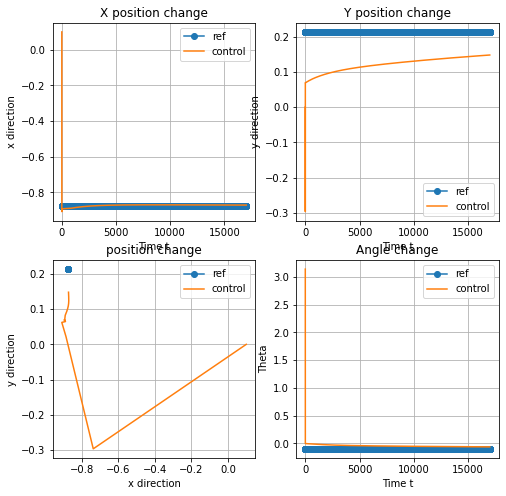

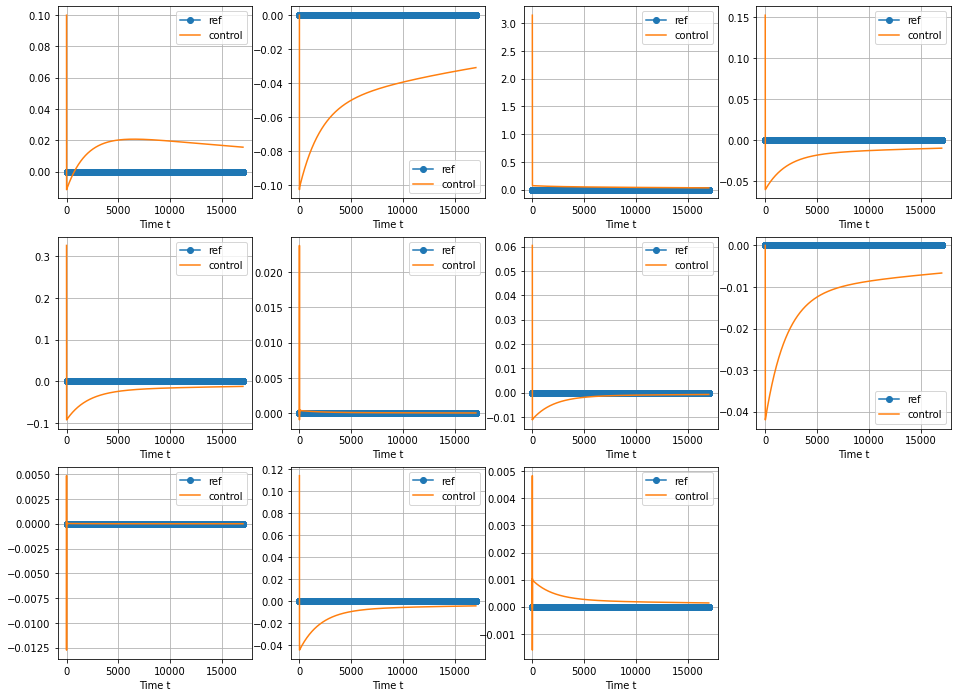

In [1]:
from LQR import dlqr_process
from numpy import pi
import numpy as np
model_file = 'unmasked_encoder_[3, 32, 64, 8]_decoder_[11, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
init = np.array([0.1,0.,pi])
ref = np.array([0.,0.,0.])
Q = 1000*np.diag(np.array([1.,1.,1.,1.,1.,1.,1.,1.,1.,1.,1.]))
R = 1*np.diag(np.array([1.,1.]))
thre = 0.05
dlqr_process(model_file,init,ref,Q,R,thre)

In [58]:
(np.ones((1,5))-np.tri(1,5,0))[0]

array([0., 1., 1., 1., 1.])

In [1]:
import numpy as np
from Koopman_numpy import Koopman_numpy
from MPC import *

SimLength = 8
init_x = np.array([0.,0.,0.])
file=simulate_path(init_x,SimLength)
ref = np.load(file+".npy",allow_pickle=True).item()
path_ref = ref['path']
x_init = ref['init state']
diff = path_ref[:,1:]-path_ref[:,:-1]
angle = np.arctan2(diff[1,:],diff[0,:])
path_ref = np.r_[path_ref,np.c_[x_init[2],np.array([angle])]]

./dataset/MPC/SimLenth_8_Ts_0.1


In [2]:
file_name = 'encoder_[3, 32, 64, 6]_decoder_[9, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
operater = Koopman_numpy(file_name)
lifted_ref = np.zeros((9,path_ref.shape[1]))
for i in range(path_ref.shape[1]):
    lifted_ref[:,i] = operater.encode(path_ref[:,i])
np.save('./matlab/lower_complex/ref_4',lifted_ref)


file_name = 'encoder_[3, 32, 64, 8]_decoder_[11, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 11]_batch_10'
operater = Koopman_numpy(file_name)
lifted_ref = np.zeros((11,path_ref.shape[1]))
for i in range(path_ref.shape[1]):
    lifted_ref[:,i] = operater.encode(path_ref[:,i])
np.save('./matlab/complex/ref_4',lifted_ref)


file_name = 'unmasked_encoder_[3, 32, 64, 8]_decoder_[11, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
operater = Koopman_numpy(file_name)
lifted_ref = np.zeros((11,path_ref.shape[1]))
for i in range(path_ref.shape[1]):
    lifted_ref[:,i] = operater.encode(path_ref[:,i])
np.save('./matlab/unmasked/ref_4',lifted_ref)


file_name = 'real_encoder_[3, 32, 64, 8]_decoder_[11, 128, 64, 32, 3]_hyper_[1.0, 3.0, 0.3, 1e-07, 1e-07, 1e-07, 10]_batch_10'
operater = Koopman_numpy(file_name)
lifted_ref = np.zeros((11,path_ref.shape[1]))
for i in range(path_ref.shape[1]):
    lifted_ref[:,i] = operater.encode(path_ref[:,i])
np.save('./matlab/diagonal/ref_4',lifted_ref)